<a href="https://colab.research.google.com/github/camrivera8/MGPM/blob/main/3_MRS_Models_Clusters.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Load Packages

In [ ]:
# OS library
import os
import sys
import argparse

!pip install scikit-learn==1.2.2

# Analysis
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import f_oneway
from sklearn.utils import resample
from statistics import mean

#Model
from sklearn import datasets
from sklearn import metrics
from sklearn.metrics import classification_report, roc_curve, roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import auc
from sklearn.metrics import roc_curve
from sklearn.multiclass import OneVsRestClassifier
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import label_binarize
from sklearn.metrics import accuracy_score
from sklearn import preprocessing

from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV


#import the relevant packages
from sklearn import metrics
import matplotlib.pyplot as plt #get the confusion matrix

import joblib
#import pydicom

pd.options.display.min_rows = 500

from google.colab import drive
drive.mount('/content/drive')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 19.2 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.5.2
    Uninstalling scikit-learn-1.5.2:
      Successfully uninstalled scikit-learn-1.5.2
Mounted at /content/drive


#DeLong's Method is used to compare ROC Curves. This is the code for initializing it. Adapted from vmaf github.  IGNORE

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats

# AUC comparison adapted from
# https://github.com/Netflix/vmaf/
def compute_midrank(x):
    """Computes midranks.
    Args:
       x - a 1D numpy array
    Returns:
       array of midranks
    """
    J = np.argsort(x)
    Z = x[J]
    N = len(x)
    T = np.zeros(N)

    i = 0
    while i < N:
        j = i
        while j < N and Z[j] == Z[i]:
            j += 1
        T[i:j] = 0.5*(i + j - 1)
        i = j
    T2 = np.zeros(N)
    #T2 = pd.DataFrame(T2)
    #T2 = T2.to_numpy()
    # Note(kazeevn) +1 is due to Python using 0-based indexing
    # instead of 1-based in the AUC formula in the paper
    #T = pd.DataFrame(T)
    #T = T.to_numpy()
    T2[J] = T + 1


    return T2


def fastDeLong(predictions_sorted_transposed, label_1_count):
    """
    The fast version of DeLong's method for computing the covariance of
    unadjusted AUC.
    Args:
       predictions_sorted_transposed: a 2D numpy.array[n_classifiers, n_examples]
          sorted such as the examples with label "1" are first
    Returns:
       (AUC value, DeLong covariance)
    Reference:
     @article{sun2014fast,
       title={Fast Implementation of DeLong's Algorithm for
              Comparing the Areas Under Correlated Receiver Operating Characteristic Curves},
       author={Xu Sun and Weichao Xu},
       journal={IEEE Signal Processing Letters},
       volume={21},
       number={11},
       pages={1389--1393},
       year={2014},
       publisher={IEEE}
     }
    """
    # Short variables are named as they are in the paper
    m = label_1_count
    n = predictions_sorted_transposed.shape[1] - m
    positive_examples = predictions_sorted_transposed[:, :m]
    negative_examples = predictions_sorted_transposed[:, m:]
    k = predictions_sorted_transposed.shape[0]

    tx = np.empty([k, m])
    ty = np.empty([k, n])
    tz = np.empty([k, m + n])
    for r in range(k):
        tx[r, :] = compute_midrank(positive_examples[r, :])
        ty[r, :] = compute_midrank(negative_examples[r, :])
        tz[r, :] = compute_midrank(predictions_sorted_transposed[r, :])
    aucs = tz[:, :m].sum(axis=1) / m / n - float(m + 1.0) / 2.0 / n
    v01 = (tz[:, :m] - tx[:, :]) / n
    v10 = 1.0 - (tz[:, m:] - ty[:, :]) / m
    sx = np.cov(v01)
    sy = np.cov(v10)
    delongcov = sx / m + sy / n
    return aucs, delongcov


def calc_pvalue(aucs, sigma):
    """Computes log(10) of p-values.
    Args:
       aucs: 1D array of AUCs
       sigma: AUC DeLong covariances
    Returns:
       log10(pvalue)
    """
    l = np.array([[1, -1]])
    z = np.abs(np.diff(aucs)) / np.sqrt(np.dot(np.dot(l, sigma), l.T))
    return z #np.log10(2) + scipy.stats.norm.logsf(z, loc=0, scale=1) / np.log(10)


def compute_ground_truth_statistics(ground_truth):
    assert np.array_equal(np.unique(ground_truth), [0, 1])
    order = (-ground_truth).argsort()
    label_1_count = int(ground_truth.sum())
    return order, label_1_count


def delong_roc_variance(ground_truth, predictions):
    """
    Computes ROC AUC variance for a single set of predictions
    Args:
       ground_truth: np.array of 0 and 1
       predictions: np.array of floats of the probability of being class 1
    """
    order, label_1_count = compute_ground_truth_statistics(ground_truth)
    predictions_sorted_transposed = predictions[np.newaxis, order]
    aucs, delongcov = fastDeLong(predictions_sorted_transposed, label_1_count)
    assert len(aucs) == 1, "There is a bug in the code, please forward this to the developers"
    return aucs[0], delongcov


def delong_roc_test(ground_truth, predictions_one, predictions_two):
    """
    Computes log(p-value) for hypothesis that two ROC AUCs are different
    Args:
       ground_truth: np.array of 0 and 1
       predictions_one: predictions of the first model,
          np.array of floats of the probability of being class 1
       predictions_two: predictions of the second model,
          np.array of floats of the probability of being class 1
    """
    order, label_1_count = compute_ground_truth_statistics(ground_truth)
    predictions_sorted_transposed = np.vstack((predictions_one, predictions_two))[:, order]
    aucs, delongcov = fastDeLong(predictions_sorted_transposed, label_1_count)
    return calc_pvalue(aucs, delongcov)

In [ ]:
import sklearn.datasets
import sklearn.model_selection
import sklearn.linear_model
import numpy
#import compare_auc_delong_xu
import scipy.stats

x_distr = scipy.stats.norm(0.5, 1)
y_distr = scipy.stats.norm(-0.5, 1)
sample_size_x = 7
sample_size_y = 14
n_trials = 1000
aucs = numpy.empty(n_trials)
variances = numpy.empty(n_trials)
numpy.random.seed(1234235)
labels = numpy.concatenate([numpy.ones(sample_size_x), numpy.zeros(sample_size_y)])
for trial in range(n_trials):
    scores = numpy.concatenate([
        x_distr.rvs(sample_size_x),
        y_distr.rvs(sample_size_y)])
    aucs[trial] = sklearn.metrics.roc_auc_score(labels, scores)
    auc_delong, variances[trial] = delong_roc_variance(
        labels, scores)

print(f"Experimental variance {variances.mean():.4f}, "
      f"computed vairance {aucs.var():.4f}, {n_trials} trials")

NameError: ignored

In [ ]:
delong_roc_test(labels,)

0.6938775510204082

In [ ]:
%pip install shap
import shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 5.3 MB/s eta 0:00:00


Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


# Filename + Data

In [ ]:
# #he = pd.read_excel("/content/drive/Shareddrives/MR_Spectroscopy/Clean_Data.xlsx", sheet_name = "healthy", header=0)
# ed = pd.read_excel("/content/drive/Shareddrives/MR_Spectroscopy/Clean_Data2.xlsx", sheet_name = "FLAIR", header=0)
# en = pd.read_excel("/content/drive/Shareddrives/MR_Spectroscopy/Clean_Data2.xlsx", sheet_name = "Tumor", header=0)
# rec = pd.read_excel("/content/drive/Shareddrives/MR_Spectroscopy/Clean_Data2.xlsx", sheet_name = "AFR", header=0)
# nawm = pd.read_excel("/content/drive/Shareddrives/MR_Spectroscopy/Clean_Data2.xlsx", sheet_name = "NAWM", header=0)
# rec_key = pd.read_excel("/content/drive/Shareddrives/MR_Spectroscopy/Clean_Data2.xlsx", sheet_name = "PF", header=0)
# ed_corr = pd.read_excel("/content/drive/Shareddrives/MR_Spectroscopy/Clean_Data2.xlsx", sheet_name = "NPF", header=0)

In [ ]:
#he = pd.read_excel("/content/drive/Shareddrives/MR_Spectroscopy/Clean_Data.xlsx", sheet_name = "healthy", header=0)
ed = pd.read_excel("/content/drive/Shareddrives/MR_Spectroscopy/Clean_Data_5-16-23.xlsx", sheet_name = "FLAIR", header=0)
en = pd.read_excel("/content/drive/Shareddrives/MR_Spectroscopy/Clean_Data_5-16-23.xlsx", sheet_name = "Tumor", header=0)
rec = pd.read_excel("/content/drive/Shareddrives/MR_Spectroscopy/Clean_Data_5-16-23.xlsx", sheet_name = "AFR", header=0)
nawm = pd.read_excel("/content/drive/Shareddrives/MR_Spectroscopy/Clean_Data_5-16-23.xlsx", sheet_name = "NAWM", header=0)
rec_key = pd.read_excel("/content/drive/Shareddrives/MR_Spectroscopy/Clean_Data_5-16-23.xlsx", sheet_name = "PF", header=0)
ed_corr = pd.read_excel("/content/drive/Shareddrives/MR_Spectroscopy/Clean_Data_5-16-23.xlsx", sheet_name = "NPF", header=0)
wbf_norec = pd.read_csv("/content/drive/Shareddrives/MR_Spectroscopy/wbf_norec")



In [ ]:
#PICK which columns to drop/keep: relative or measured glx & myo-inositol
non_rel = ['Glx._Sm', 'myo-Inositol_Sm']
rel = ['relglx', 'relmyoinositol']

#drop = non_rel
drop = rel

ed = ed.drop(drop, axis=1)
en = en.drop(drop, axis=1)
rec = rec.drop(drop, axis=1)
nawm = nawm.drop(drop, axis=1)
rec_key = rec_key.drop(drop, axis=1)
ed_corr = ed_corr.drop(drop, axis=1)

File Name for figure

In [ ]:
'''
Pick a file name

-the ensuing features & classifiers will be chosen
-the figure name will be updated
-the figure file name will also be updated
'''

#filename = 'nawm_enhancing'
#filename = 'nawm_recurrence'
#filename = 'nawm_flair'
#filename = 'flair_recurrence'
filename = 'wbf_recurrence'
#filename = 'multiclass_model'


if filename == 'nawm_enhancing':
  figurename = 'NAWM vs Enhancing'
if filename == 'nawm_recurrence':
  figurename = 'NAWM vs Recurrence'
if filename == 'nawm_flair':
  figurename = 'NAWM vs FLAIR_nontumor'
if filename == 'enhancing_recurrence':
  figurename = 'Enhancing vs Recurrence'
if filename == 'flair_recurrence':
  figurename = 'FLAIR_nontumor vs Recurrence'
if filename == 'wbf_recurrence':
  figurename = 'Whole-brain healthy vs Recurrence'
if filename == 'multiclass_model':
  figurename = 'Multi-Class Model'



#edit this depending on the comparison done to save the ROC figure

#Feature & Classifier Setup

Features

In [ ]:
#NAWM vs Enhancing
if filename == 'nawm_enhancing':
  tot = pd.concat([nawm, en])

#NAWM vs Recurrence in Edema
if filename == 'nawm_recurrence':
  tot = pd.concat([nawm, rec])

#NAWM vs FLAIR
if filename == 'nawm_flair':
  tot = pd.concat([nawm, ed])

#Recurrence in Edema vs Enhancing
if filename == 'enhancing_recurrence':
  tot = pd.concat([en, rec])

#FLAIR_nontumor vs Recurrence in Edema
if filename == 'flair_recurrence':
  tot = pd.concat([ed_corr, rec_key])

#WBF vs Recurrence in Edema
if filename == 'wbf_recurrence':
  tot = pd.concat([wbf_norec, rec])

#Multiclass model
if filename == 'multiclass_model':
  print('yes')
  tot = pd.concat([nawm, rec_key, ed_temp, en])


'''
Right now, we are using 5 columns.
Column 1 is printing as the row number,
so we want to eliminate column 1 from the features
'''
tot = tot.drop(columns = ['Unnamed: 0'])

#set the features
cols = ['Glx._Sm', 'myo-Inositol_Sm', 'relNAA/CR', 'relCHO/CR', 'relCHO/NAA']

features = tot.loc[:,cols]

Classifier

In [ ]:
#he_cl = np.zeros(((len(he_temp)),1))
#he_cl = pd.DataFrame(he_cl)

nawm_cl = np.zeros(((len(nawm)),1))
nawm_cl = pd.DataFrame(nawm_cl)

#zeros for enhancing
en_z_cl = np.zeros((len(en),1))
en_z_cl = pd.DataFrame(en_z_cl)

#ones for enhancing
en_cl = np.linspace(1,1,num=len(en))
en_cl = pd.DataFrame(np.transpose(en_cl))

#ones for recurrence
rec_cl = np.linspace(1,1,num=len(rec))
rec_cl = pd.DataFrame(np.transpose(rec_cl))


rec_key_cl = np.linspace(1,1,num=len(rec_key))
rec_key_cl = pd.DataFrame(np.transpose(rec_key_cl))

#zeros for flair
ed_z_cl = np.zeros((len(ed),1))
ed_z_cl = pd.DataFrame(ed_z_cl)

#zeros for flair corrected
ed_corr_z_cl = np.zeros((len(ed_corr),1))
ed_corr_z_cl = pd.DataFrame(ed_corr_z_cl)

#ones for flair
ed_cl = np.linspace(1,1,num=len(ed))
ed_cl = pd.DataFrame(np.transpose(ed_cl))

wbf_z_cl = np.zeros((len(wbf_norec), 1))
wbf_z_cl = pd.DataFrame(wbf_z_cl)

#multiclass
nawm_mc_cl = np.linspace(1,1,num=len(nawm))
nawm_mc_cl = pd.DataFrame(np.transpose(nawm_mc_cl))

rec_mc_cl = np.linspace(2,2,num=len(rec))
rec_mc_cl = pd.DataFrame(np.transpose(rec_mc_cl))

#ed_corr_mc_cl = np.linspace(3,3,num=len(ed_corr))
#ed_corr_mc_cl = pd.DataFrame(np.transpose(ed_corr_mc_cl))

#ed_temp_mc_cl = np.linspace(3,3,num=len(ed_temp))
#ed_temp_mc_cl = pd.DataFrame(np.transpose(ed_temp_mc_cl))

en_mc_cl = np.linspace(4,4,num=len(en))
en_mc_cl = pd.DataFrame(np.transpose(en_mc_cl))


if filename == 'nawm_enhancing':
  classifier = pd.concat([nawm_cl, en_cl])
if filename == 'nawm_recurrence':
  classifier = pd.concat([nawm_cl, rec_cl])
if filename == 'nawm_flair':
  classifier = pd.concat([nawm_cl, ed_cl])
if filename == 'enhancing_recurrence':
  classifier = pd.concat([en_z_cl, rec_cl])
if filename == 'flair_recurrence':
  classifier = pd.concat([ed_corr_z_cl, rec_key_cl])
if filename == 'wbf_recurrence':
  classifier = pd.concat([wbf_z_cl, rec_cl])
if filename == 'multiclass_model':
  classifier = pd.concat([nawm_mc_cl, rec_key_mc_cl, ed_corr_mc_cl, en_mc_cl])
  classifier.astype('int')

## **Logistic Regression**

**We don't really use this**

Import functions/packages

& Define features/classifiers

In [ ]:
#define features
x_logistic_data = features.copy()
#define classifiers
y_logistic_data = classifier.copy()

'''
above is where you fill in whatever our desired matrix of variables is for the whole set of data
no need to separate 80/20 test, as we are just looking at coefficients and p-values (less so the confusion matrix)
'''

#import functions/packages
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import datasets
from sklearn import metrics
from sklearn.metrics import classification_report, roc_curve, roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import auc
from sklearn.metrics import roc_curve
from sklearn.multiclass import OneVsRestClassifier
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import label_binarize
from scipy import stats
import statsmodels.api as sm
from sklearn.metrics import accuracy_score

Univariate Logistical Models
x & y inputs are copied


In [ ]:
# #univariate regressions
# #*use model.summary() for statistics
# uni_glx = sm.Logit(y_logistic_data, x_logistic_data['Glx._Sm']).fit()

# #uni_lactate = sm.Logit(y_logistic_data, x_logistic_data['Lactate']).fit()

# uni_myoino = sm.Logit(y_logistic_data, x_logistic_data['myo-Inositol_Sm']).fit()

# uni_naa_cr = sm.Logit(y_logistic_data, x_logistic_data['relNAA/CR']).fit()

# uni_cho_naa = sm.Logit(y_logistic_data, x_logistic_data['relCHO/NAA']).fit()

# uni_cr_cho = sm.Logit(y_logistic_data, x_logistic_data['relCHO/CR']).fit()


Multivariate Logistical Models (with P-values)

In [ ]:
# #multivariate regressions
# log_reg = sm.Logit(y_logistic_data, x_logistic_data).fit()
# log_reg_summary = log_reg.summary()
# log_reg_summary

## SMOTE. Synthetic Minority Oversampling Technique

Used to upsample minority class

In [ ]:
# X -> features, y -> label
X = features
y = classifier

#X = X['relCHO/NAA']
#ratios = ['relCHO/NAA', 'relNAA/CR', 'relCHO/CR']
#X = X[ratios]
X = pd.DataFrame(X)
# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler()
# scaler.fit(X)
# X_scaler= scaler.transform(X)

# dividing X, y into train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.8, random_state = 0)

#X_train['y']=y_train
#X_test['y']=y_test

In [ ]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
X_smote, y_smote = sm.fit_resample(X,y)
X_res, y_res = sm.fit_resample(X_train, y_train)
X_tres, y_tres = sm.fit_resample(X_test, y_test)

**FOR SHINY MODEL**

In [ ]:
# X_res.columns

# new_column_names = {
#     'Glx._Sm': 'glx',
#     'myo-Inositol_Sm': 'myoinositol',
#     'relNAA/CR': 'relnaacr',
#     'relCHO/CR': 'relchocr',
#     'relCHO/NAA': 'relchonaa'
# }

# X_res = X_res.rename(columns=new_column_names)
# X_tres = X_tres.rename(columns=new_column_names)


**FOR R MACHINE LEARNING**

In [ ]:
# X_res.to_csv('/content/drive/Shareddrives/MR_Spectroscopy/app_files/X_res_wbf.csv', index=False)
# X_tres.to_csv('/content/drive/Shareddrives/MR_Spectroscopy/app_files/X_tres_wbf.csv', index=False)
# y_res.to_csv('/content/drive/Shareddrives/MR_Spectroscopy/app_files/y_res_wbf.csv', index=False)
# y_tres.to_csv('/content/drive/Shareddrives/MR_Spectroscopy/app_files/y_tres_wbf.csv', index=False)

# **BINARY MACHINE LEARNING CLASSIFICATION MODELS**

### Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
y_pred_nb = gnb.fit(X_res, y_res).predict(X_tres)
print(classification_report(y_tres,y_pred_nb))

              precision    recall  f1-score   support

         0.0       0.65      0.95      0.77     20309
         1.0       0.90      0.48      0.63     20309

    accuracy                           0.71     40618
   macro avg       0.77      0.71      0.70     40618
weighted avg       0.77      0.71      0.70     40618



/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
precision_nb  = metrics.precision_recall_fscore_support(y_tres,y_pred_nb)[0][1]
specificity_nb = metrics.precision_recall_fscore_support(y_tres,y_pred_nb)[1][0]
sensitivity_nb = metrics.precision_recall_fscore_support(y_tres,y_pred_nb)[1][1]
accuracy_nb = accuracy_score(y_tres, y_pred_nb)
metrics_nb = pd.DataFrame([accuracy_nb,precision_nb,specificity_nb,sensitivity_nb])
metrics_nb

,0
0,0.714191
1,0.902033
2,0.947806
3,0.480575


GridSearchCV

In [ ]:
param_grid_nb = {'var_smoothing': np.logspace(0,-9, num=100)}

nbModel_grid = GridSearchCV(estimator=GaussianNB(), param_grid=param_grid_nb, verbose=1, cv=10, n_jobs=-1)
nbModel_grid.fit(X_train, y_train)
print(nbModel_grid.best_estimator_)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
GaussianNB(var_smoothing=0.8111308307896871)


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


ROC: Naive Bayes

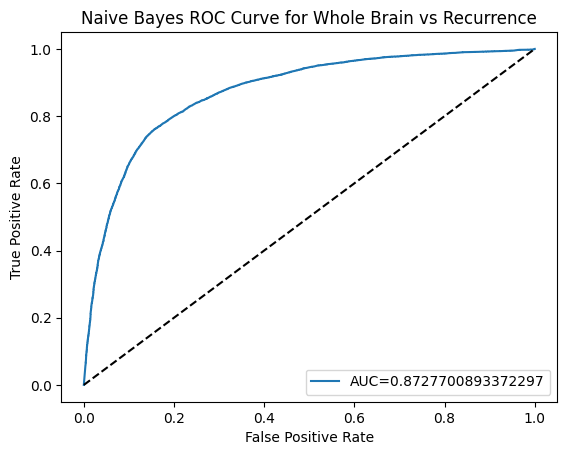

In [ ]:
y_naive_proba = gnb.predict_proba(X_tres)
auc_naive = metrics.roc_auc_score(y_tres, y_naive_proba[:,1])

fpr_naive, tpr_naive, _ = roc_curve(y_tres, y_naive_proba[:,1])

plt.clf()
plt.plot(fpr_naive,tpr_naive,label="AUC="+str(auc_naive))
plt.plot([0,1],'k--')
plt.title('Naive Bayes ROC Curve for ' + figurename)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

Raw ROC Values

In [ ]:
nb_roc_data = pd.DataFrame([fpr_naive, tpr_naive])
nb_roc_data = nb_roc_data.transpose()

SHAP: Feature Importance

In [ ]:
nb_explainer = shap.Explainer(gnb.predict,X_res)
nb_shap_values = nb_explainer(X_tres)
nb_shap = pd.DataFrame(nb_shap_values.values, columns = X_tres.columns)

NameError: ignored

In [ ]:
nb_shap_values.values

In [ ]:
shap.summary_plot(nb_shap_values, features=X_tres, feature_names=X_tres.columns, plot_type='bar')

### Decision Tree

In [ ]:
# X -> features, y -> label
#X = features
#y = classifier

# dividing X, y into train and test data
#X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.8, random_state = 0)

# training a DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
dtree_model = DecisionTreeClassifier(max_features=8).fit(X_res, y_res)
dtree_predictions = dtree_model.predict(X_tres)

dtree_predictions_proba_pre = dtree_model.predict_proba(X_tres)
dtree_predictions_proba_pre = pd.DataFrame(dtree_predictions_proba_pre)

dtree_predictions_proba = dtree_predictions_proba_pre[dtree_predictions_proba_pre.columns[1]]

# creating a confusion matrix
cm_dtree = confusion_matrix(y_tres, dtree_predictions)


print(accuracy_score(y_tres, dtree_predictions))

0.7846767443005565


In [ ]:
precision_dtree  = metrics.precision_recall_fscore_support(y_tres,dtree_predictions)[0][1]
specificity_dtree = metrics.precision_recall_fscore_support(y_tres,dtree_predictions)[1][0]
sensitivity_dtree = metrics.precision_recall_fscore_support(y_tres,dtree_predictions)[1][1]
accuracy_dtree = accuracy_score(y_tres, dtree_predictions)
metrics_dtree = pd.DataFrame([accuracy_dtree,precision_dtree,specificity_dtree,sensitivity_dtree])
metrics_dtree

,0
0,0.784677
1,0.889983
2,0.919691
3,0.649663


Randomized Search CV 10 fold

In [ ]:
# Setup the parameters and distributions to sample from: param_dist
param_dist = {"max_depth": [3, None],
              "max_features": range(1, 9),
              "min_samples_leaf": range(1, 9),
              "criterion": ["gini", "entropy"]}

dtree_base = DecisionTreeClassifier()
# Instantiate the RandomizedSearchCV object: tree_cv
tree_cv = RandomizedSearchCV(dtree_base, param_dist, cv=10, n_iter=50)
tree_cv.fit(X_res,y_res)
print(tree_cv.best_estimator_)

ROC for Decision Tree

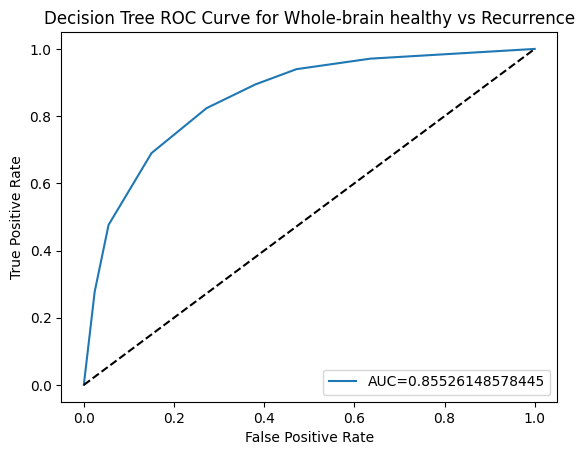

In [ ]:
y_dtree_proba = dtree_model.predict_proba(X_tres)
auc_dtree = metrics.roc_auc_score(y_tres, y_dtree_proba[:,1])

fpr_dtree, tpr_dtree, _ = roc_curve(y_tres, y_dtree_proba[:,1])

plt.clf()
plt.plot(fpr_dtree,tpr_dtree,label="AUC="+str(auc_dtree))
plt.plot([0,1],'k--')
plt.title('Decision Tree ROC Curve for ' + figurename)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

In [ ]:
importances = dtree_model.feature_importances_

importances = pd.DataFrame(importances)
importances = importances.transpose()
importances.columns = X_tres.columns
#std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)


AttributeError: ignored

In [ ]:
! pip install lofo-importance

In [ ]:
fig, ax = plt.subplots()
importances.plot.barh(ax=ax)
ax.set_title("Decision Tree: Feature importances")
ax.set_ylabel("Features")

ROC Raw Values

In [ ]:
dtree_roc_data = pd.DataFrame([fpr_dtree, tpr_dtree])
dtree_roc_data = dtree_roc_data.transpose()

SHAP: Decision tree

In [ ]:
dt_explainer = shap.KernelExplainer(dtree_model.predict_proba, X_res)
dt_shap_values = dt_explainer.shap_values(X_tres)

In [ ]:
dtree_model.feature_importances_

In [ ]:
dt_shap = pd.DataFrame(dt_shap_values[1], columns = X_tres.columns)

In [ ]:
shap.summary_plot(dt_shap_values[1], features=X_tres, feature_names=X_tres.columns, plot_type='bar')

Heat Map: Prediction.Proba vs Classifier

In [ ]:
categories = ['Decision Tree Prediction', 'Classification']

#set predictions next to classifiers
y_tres_index = y_tres.reset_index(drop=True)

dtree_predictions_proba = pd.DataFrame(dtree_predictions_proba)
dtree_predictions_proba = dtree_predictions_proba.reset_index(drop=True)

hmc_dtree = pd.concat([dtree_predictions_proba, y_tres_index], axis=1)
hmc_dtree = hmc_dtree.sort_values(by=[ hmc_dtree.columns[1] , hmc_dtree.columns[0]  ])

#heat map comparisons
plt.figure(figsize = (10,200))
hmc = sns.heatmap(hmc_dtree, annot = True, cmap = 'Blues')
hmc.figure.savefig("dtree_heatmap.png")

Confusion Matrix for Decision Tree

[Text(0, 0.5, 'Healthy'), Text(0, 1.5, 'Recurrence')]

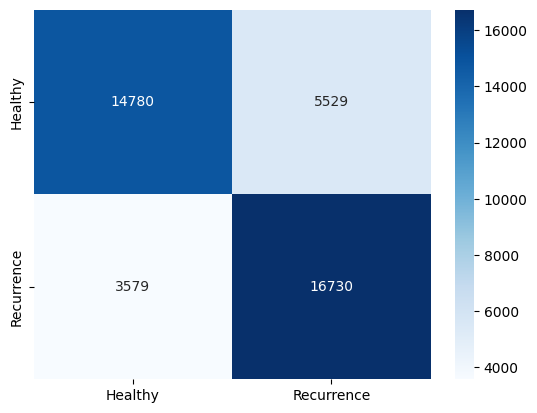

In [ ]:
categories = ['Healthy','Recurrence']
ax = sns.heatmap(cm_dtree, annot=True,fmt='d',cmap='Blues')
ax.set_xticklabels(categories)
ax.set_yticklabels(categories)

In [ ]:

FP = cm_dtree.sum(axis=0)-np.diag(cm_dtree)
FN = cm_dtree.sum(axis=1)-np.diag(cm_dtree)
TP = np.diag(cm_dtree)
TN = cm_dtree.sum() - (FP+FN+TP)

TPR = TP/(TP+FN) #sensitivity
TNR = TN/(TN+FP) #specificity
PPV = TP/(TP+FP)

ACC = (TP+TN)/(TP+FP+FN+TN)

TNR.mean()

0.6614090431125131

### KNN

In [ ]:
# X -> features, y -> label
#X = features
#y = classifier

# dividing X, y into train and test data
#X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.8, random_state = 0)

# training a KNN classifier
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors = 70, p=1, leaf_size=20, weights='uniform').fit(X_res, y_res)

# accuracy on X_test
accuracy = knn.score(X_tres, y_tres)
print(accuracy)

# creating a confusion matrix
knn_predictions = knn.predict(X_tres)

knn_predictions_proba_pre = knn.predict_proba(X_tres)
knn_predictions_proba_pre = pd.DataFrame(knn_predictions_proba_pre)

knn_predictions_proba = knn_predictions_proba_pre[knn_predictions_proba_pre.columns[1]]

cm_knn = confusion_matrix(y_tres, knn_predictions)


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


0.59606578364272


In [ ]:
precision_knn  = metrics.precision_recall_fscore_support(y_tres,knn_predictions)[0][1]
specificity_knn = metrics.precision_recall_fscore_support(y_tres,knn_predictions)[1][0]
sensitivity_knn = metrics.precision_recall_fscore_support(y_tres,knn_predictions)[1][1]
accuracy_knn = accuracy_score(y_tres, knn_predictions)
metrics_knn = pd.DataFrame([accuracy_knn,precision_knn,specificity_knn,sensitivity_knn])
metrics_knn

,0
0,0.596066
1,0.615294
2,0.679452
3,0.512679


RandomSearchCV 10 fold

In [ ]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [ ]:
#List Hyperparameters that we want to tune.
leaf_size = list(range(0,50,5))
n_neighbors = list(range(0,100,5))
p=[1,2]

random_grid = {'leaf_size': leaf_size,
               'n_neighbors': n_neighbors,
               'p': p}
#Convert to dictionary
#hyperparameters = dict(leaf_size=leaf_size, n_neighbors=n_neighbors, p=p)
#Create new KNN object
knn_base = KNeighborsClassifier()
#Use GridSearch
knn_base = RandomizedSearchCV(knn_base, random_grid, cv=10, n_iter=50)
#Fit the model
knn_best_model = knn_base.fit(X_res,y_res)
#Print The value of best Hyperparameters
print(knn_best_model.best_estimator_)

ROC Curve for KNN

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


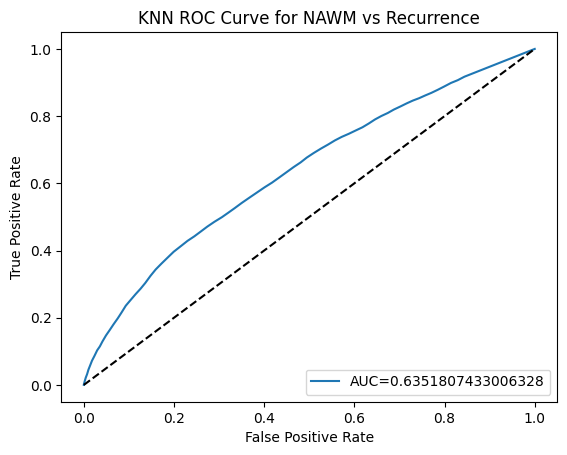

In [ ]:
#roc
knn.fit(X_res,y_res)

y_knn_proba = knn.predict_proba(X_tres)

fpr_knn, tpr_knn, _ = roc_curve(y_tres, y_knn_proba[:,1])
auc_knn = metrics.roc_auc_score(y_tres, y_knn_proba[:,1])

#create ROC curve
plt.plot(fpr_knn,tpr_knn,label="AUC="+str(auc_knn))
plt.plot([0,1],'k--')
plt.title('KNN ROC Curve for NAWM vs Recurrence')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()


ROC Raw Values

In [ ]:
knn_roc_data = pd.DataFrame([fpr_knn, tpr_knn])
knn_roc_data = knn_roc_data.transpose()

SHAP Feature Importance

In [ ]:
knn_explainer = shap.KernelExplainer(knn.predict_proba, X_res)
knn_shap_values = knn_explainer.shap_values(X_tres)

In [ ]:
knn_shap_values[1]

array([[ 8.85411174e-02, -9.36986817e-02,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00],
       [ 4.15321197e-02, -1.26688847e-01,  0.00000000e+00,
        -8.36995193e-07,  0.00000000e+00],
       [ 9.17120737e-02, -1.50202553e-01,  0.00000000e+00,
        -4.18497598e-07,  0.00000000e+00],
       ...,
       [ 6.36848713e-02,  3.57824231e-01,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00],
       [ 1.58875078e-01,  3.29300691e-01,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00],
       [ 9.08612680e-02,  3.73145009e-02,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00]])

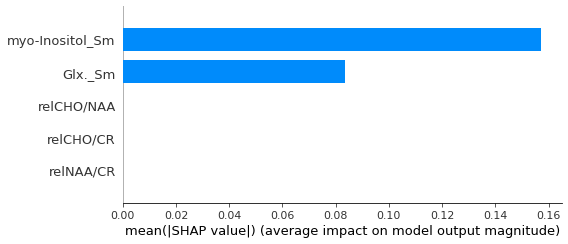

In [ ]:
shap.summary_plot(knn_shap_values[1], features=X_tres, feature_names=X_tres.columns, plot_type='bar')

In [ ]:
knn_shap = pd.DataFrame(knn_shap_values[1], columns = X_tres.columns)

KNN Heatmap predictions vs classifier


In [ ]:
categories = ['KNN Prediction', 'Classification']

#set predictions next to classifiers
y_tres_index = y_tres.reset_index(drop=True)

knn_predictions_proba = pd.DataFrame(knn_predictions_proba)
knn_predictions_proba = knn_predictions_proba.reset_index(drop=True)

hmc_knn = pd.concat([knn_predictions_proba, y_tres_index], axis=1)
hmc_knn = hmc_knn.sort_values(by=[ hmc_knn.columns[1] , hmc_knn.columns[0]  ])

#heat map comparisons
plt.figure(figsize = (10,376))
hmc = sns.heatmap(hmc_knn, annot = True, cmap = 'Blues')
hmc.figure.savefig("knn_heatmap.png")

              precision    recall  f1-score   support

         0.0       0.67      0.79      0.73       655
         1.0       0.74      0.62      0.68       655

    accuracy                           0.70      1310
   macro avg       0.71      0.70      0.70      1310
weighted avg       0.71      0.70      0.70      1310



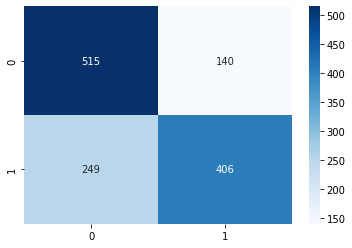

In [ ]:
# Seaborn's heatmap to better visualize the confusion matrix
sns.heatmap(cm_knn, annot=True, fmt='d', cmap='Blues');

print(classification_report(y_tres, knn_predictions))

### Logistic Regression

In [ ]:
# X -> features, y -> label
X = features
y = classifier

# dividing X, y into train and test data
#X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.8, random_state = 0)

log_regression = LogisticRegression()

log_regression.fit(X_res,y_res)

y_log_proba = log_regression.predict_proba(X_tres)[::,1]
fpr_log, tpr_log, _ = metrics.roc_curve(y_tres,  y_log_proba)
auc_log = metrics.roc_auc_score(y_tres, y_log_proba)

# creating a confusion matrix
log_regression_predictions = log_regression.predict(X_tres)

log_predictions_proba_pre = log_regression.predict_proba(X_tres)
log_predictions_proba_pre = pd.DataFrame(log_predictions_proba_pre)

log_predictions_proba = log_predictions_proba_pre[log_predictions_proba_pre.columns[1]]

cm_lm = confusion_matrix(y_tres, log_regression_predictions)


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
precision_log_reg  = metrics.precision_recall_fscore_support(y_tres,log_regression_predictions)[0][1]
specificity_log_reg = metrics.precision_recall_fscore_support(y_tres,log_regression_predictions)[1][0]
sensitivity_log_reg = metrics.precision_recall_fscore_support(y_tres,log_regression_predictions)[1][1]
accuracy_log_reg = accuracy_score(y_tres, log_regression_predictions)
f1_log_reg = metrics.f1_score(y_tres, log_regression_predictions)
metrics_log_reg = pd.DataFrame([accuracy_log_reg,precision_log_reg,specificity_log_reg,sensitivity_log_reg,f1_log_reg])
metrics_log_reg

,0
0,0.756807
1,0.757137
2,0.757447
3,0.756167
4,0.756652


RandomizedSearchCV 10 fold

In [ ]:
# define search space
space = dict()
space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']


In [ ]:
log_search = RandomizedSearchCV(log_regression, space, n_iter=50, scoring='accuracy', n_jobs=-1, cv=10, random_state=1)
log_search.fit(X_res,y_res)
print(log_search.best_estimator_)

ROC

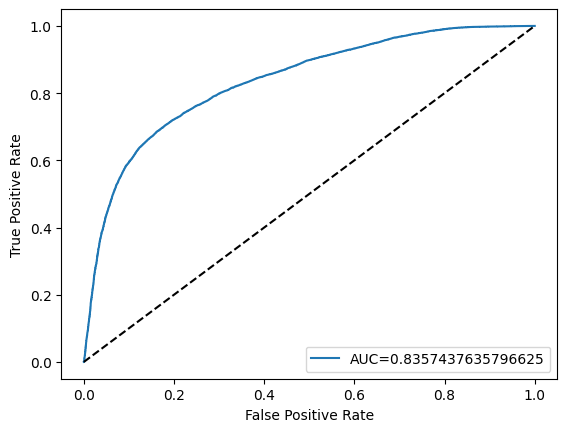

In [ ]:
plt.plot(fpr_log,tpr_log,label="AUC="+str(auc_log))
plt.plot([0,1],'k--')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

In [ ]:
log_roc_data = pd.DataFrame([fpr_log, tpr_log])
log_roc_data = log_roc_data.transpose()

SHAP Values

In [ ]:
explainer_log = shap.Explainer(log_regression.predict, X_res)
log_shap_values = explainer_log(X_tres)

In [ ]:
log_shap = log_shap_values.values
log_shap = pd.DataFrame(log_shap, columns = X_tres.columns)

[Text(0, 0.5, 'Healthy'), Text(0, 1.5, 'Enhancing')]

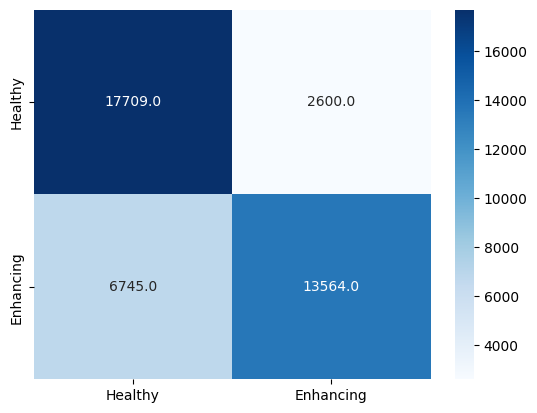

In [ ]:
categories = ['Healthy','Enhancing']
ax = sns.heatmap(cm_lm, annot=True, fmt='.1f',cmap='Blues')
ax.set_xticklabels(categories)
ax.set_yticklabels(categories)

Logistic Regression heatmap predictions vs classifier

In [ ]:
categories = ['Logisical Model Prediction', 'Classification']

#set predictions next to classifiers
y_tres_index = y_tres.reset_index(drop=True)

log_predictions_proba = pd.DataFrame(log_predictions_proba)
log_predictions_proba = log_predictions_proba.reset_index(drop=True)

hmc_log = pd.concat([log_predictions_proba, y_tres_index], axis=1)
hmc_log = hmc_log.sort_values(by=[ hmc_log.columns[1] , hmc_log.columns[0]  ])

#heat map comparisons
plt.figure(figsize = (10,200))
hmc = sns.heatmap(hmc_log, annot = True, cmap = 'Blues')
hmc.figure.savefig("log_heatmap.png")

### RandomForest

In [ ]:
# X -> features, y -> label
#X = features
#y = classifier

# dividing X, y into train and test data
# X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.8, random_state = 0)


# training a RF classifier
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier(max_depth=50, min_samples_leaf=2, min_samples_split=10,n_estimators=200, oob_score = True)
rf_model =rf_model.fit(X_res, y_res)
rf_predictions = rf_model.predict(X_tres)

rf_predictions_proba_pre = rf_model.predict_proba(X_tres)
rf_predictions_proba_pre = pd.DataFrame(rf_predictions_proba_pre)

rf_predictions_proba = rf_predictions_proba_pre[rf_predictions_proba_pre.columns[1]]

# save trained RF model
#*will save whatever training model
#joblib.dump(rf_model, f'/content/drive/Shareddrives/MR_Spectroscopy/random_forest_{filename}.joblib')


# model accuracy for X_test
accuracy = rf_model.score(X_tres, y_tres)

print(accuracy)


<ipython-input-50-69651c6b7a53>:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_model =rf_model.fit(X_res, y_res)


0.7318611987381703


In [ ]:
precision_rf  = metrics.precision_recall_fscore_support(y_tres,rf_predictions)[0][1]
specificity_rf = metrics.precision_recall_fscore_support(y_tres,rf_predictions)[1][0]
sensitivity_rf = metrics.precision_recall_fscore_support(y_tres,rf_predictions)[1][1]
f1_rf = metrics.f1_score(y_tres,rf_predictions)
accuracy_rf = accuracy_score(y_tres, rf_predictions)
metrics_rf = pd.DataFrame([accuracy_rf,precision_rf,specificity_rf,sensitivity_rf,f1_rf])
metrics_rf

,0
0,0.731861
1,0.769231
2,0.801262
3,0.662461
4,0.711864


In [ ]:
import pickle
file_name = "/content/drive/Shareddrives/MR_Spectroscopy/app_files/rf_model_wbf.pkl"

# save
pickle.dump(rf_model, open(file_name, "wb"))

In [ ]:
import pickle
file_name = "/content/drive/Shareddrives/MR_Spectroscopy/app_files/rf_model_wbf.pkl"

# load
rf_model = pickle.load(open(file_name, "rb"))
rf_predictions = rf_model.predict(X_tres)

Randomized Search CV

In [ ]:
## Number of trees in random forest
n_estimators = [1000,2000]
# Number of features to consider at every split
#max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [50, 80]
#max_depth.append(None)
# Minimum number of samples required to split a node
#min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
#min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
#bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               #'max_features': max_features,
               'max_depth': max_depth,
               #'min_samples_split': min_samples_split,
               #'min_samples_leaf': min_samples_leaf,
               #'bootstrap': bootstrap
               }

In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
from sklearn.ensemble import RandomForestClassifier
rf_base = RandomForestClassifier()
# Random search of parameters, using 10 fold cross validation,
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf_base, param_distributions = random_grid,
                               n_iter = 10, cv = 10, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_res, y_res)
rf_random.best_estimator_

NameError: ignored

ROC

accuracy:  0.8503372888867005
precision:  0.9196649758169163
recall:  0.7677384410852331
f1:  0.8368623030888549
area under curve (auc):  0.9427769102673169


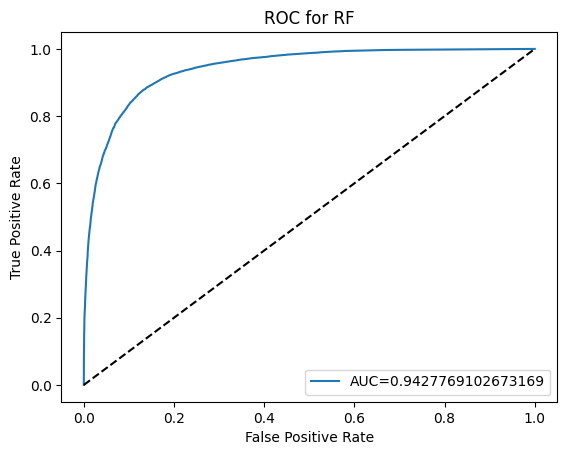

In [ ]:
#AUC
y_rf_score = rf_model.predict(X_tres)
y_rf_proba = rf_model.predict_proba(X_tres)
print("accuracy: ", metrics.accuracy_score(y_tres, y_rf_score))
print("precision: ", metrics.precision_score(y_tres, y_rf_score))
print("recall: ", metrics.recall_score(y_tres, y_rf_score))
print("f1: ", metrics.f1_score(y_tres, y_rf_score))
print("area under curve (auc): ", metrics.roc_auc_score(y_tres, y_rf_proba[:,1]))


fpr_rf, tpr_rf, _ = roc_curve(y_tres, y_rf_proba[:,1])

auc_rf =  metrics.roc_auc_score(y_tres, y_rf_proba[:,1])

plt.plot(fpr_rf,tpr_rf,label="AUC="+str(auc_rf))
plt.plot([0,1],'k--')
plt.title('ROC for RF')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()


In [ ]:
cm_rf = confusion_matrix(y_tres, rf_predictions)

categories = ['Healthy','AFR']
ax = sns.heatmap(cm_rf, annot=True, fmt='.1f',cmap='Blues')
ax.set_xticklabels(categories)
ax.set_yticklabels(categories)

ROC Raw Data

In [ ]:
rf_roc_data = pd.DataFrame([fpr_rf, tpr_rf])
rf_roc_data = rf_roc_data.transpose()

SHAP Feature Importance

In [ ]:
rf_explainer = shap.KernelExplainer(rf_model.predict, X_res)
shap_downsample_100 = shap.sample(X_tres, 100)
rf_shap_values = rf_explainer.shap_values(shap_downsample_100 )
rf_shap = pd.DataFrame(rf_shap_values[1], columns = X_tres.columns)

In [ ]:
shap.summary_plot(rf_shap_values[1], features=X_tres, feature_names=X_tres.columns, plot_type='bar')

arr = np.array(rf_shap_values)
arr = arr.reshape(-1,5)
rf_shap = pd.DataFrame(arr)
rf_shap.columns = X_tres.columns

with pd.ExcelWriter('/content/drive/Shareddrives/MR_Spectroscopy/Shap_wbh_afr/SHAP_RF.xlsx') as writer :
  rf_shap.to_excel(writer, sheet_name = 'Random Forest')


Random Forest: Feature Importance

In [ ]:
def imp_df(column_names, importances):
    data = {
        'Feature': column_names,
        'Importance': importances,
    }
    df = pd.DataFrame(data) \
        .set_index('Feature') \
        .sort_values('Importance', ascending=False)

    return df

Drop Column Method

In [ ]:
from sklearn.base import clone

def drop_col_feat_imp(model, X_res, y_res, random_state = 42):

    # clone the model to have the exact same specification as the one initially trained
    model_clone = clone(model)
    # set random_state for comparability
    model_clone.random_state = random_state
    # training and scoring the benchmark model
    model_clone.fit(X_res, y_res)
    benchmark_score = model_clone.score(X_res, y_res)
    # list for storing feature importances
    importances = []

    # iterating over all columns and storing feature importance (difference between benchmark and new model)
    for col in X_res.columns:
        model_clone = clone(model)
        model_clone.random_state = random_state
        model_clone.fit(X_res.drop(col, axis = 1), y_res)
        drop_col_score = model_clone.score(X_res.drop(col, axis = 1), y_res)
        importances.append(benchmark_score - drop_col_score)

    importances_df = imp_df(X_res.columns, importances)
    return importances_df

In [ ]:
imp = drop_col_feat_imp(rf_model,X_res,y_res,random_state = 42)

In [ ]:
fig, ax = plt.subplots()
imp.plot.bar(ax=ax)
ax.set_title("Random Forest: Feature importances")
ax.set_ylabel("Features")

Basic Method

In [ ]:
importances = rf_model.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf_model.estimators_], axis=0)

feature_names = features.columns

In [ ]:
forest_importances = pd.Series(importances, index = feature_names).sort_values()
fig, ax = plt.subplots()
forest_importances.plot.bar(ax=ax)
ax.set_title("Random Forest: Feature importances")
ax.set_ylabel("Features")

### Gradient Boosting

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
# Define Gradient Boosting Classifier with hyperparameters
gbc=GradientBoostingClassifier(max_depth=15, max_features='auto', min_samples_leaf=2, min_samples_split=10, n_estimators=1100)
# Fit train data to GBC
gbc.fit(X_res, y_res)
y_gbc_predictions = gbc.predict(X_tres)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/usr/local/li

KeyboardInterrupt: 

In [ ]:
precision_gbc  = metrics.precision_recall_fscore_support(y_tres,y_gbc_predictions)[0][1]
specificity_gbc = metrics.precision_recall_fscore_support(y_tres,y_gbc_predictions)[1][0]
sensitivity_gbc = metrics.precision_recall_fscore_support(y_tres,y_gbc_predictions)[1][1]
f1_gbc = metrics.f1_score(y_tres,y_gbc_predictions)
accuracy_gbc = accuracy_score(y_tres, y_gbc_predictions)
metrics_gbc = pd.DataFrame([accuracy_gbc,precision_gbc,specificity_gbc,sensitivity_gbc,f1_gbc])
metrics_gbc

,0
0,0.716088
1,0.782669
2,0.833859
3,0.598318
4,0.678188


Randomized Search CV 10 fold

In [ ]:
# Define the grid of hyperparameters to search
#loss = ['ls', 'lad', 'huber']
n_estimators = [100, 500, 900, 1100, 1500]
max_depth = [2, 3, 5, 10, 15]
min_samples_leaf = [1, 2, 4, 6, 8]
min_samples_split = [2, 4, 6, 10]
max_features = ['auto', 'sqrt', 'log2', None]

hyperparameter_grid = {
    'n_estimators': n_estimators,
    'max_depth': max_depth,
    'min_samples_leaf': min_samples_leaf,
    'min_samples_split': min_samples_split,
    'max_features': max_features}

gbc_base = GradientBoostingClassifier()

# Set up the random search with 5-fold cross validation
gbc_random_cv = RandomizedSearchCV(estimator=gbc_base,
            param_distributions=hyperparameter_grid,
            n_iter = 10, cv = 10, verbose=2, random_state=42, n_jobs = -1)
gbc_random_cv.fit(X_res,y_res)
print(gbc_random_cv.best_estimator_)

ROC for Gradient Boosting

accuracy:  0.7339642481598317
precision:  0.7480490523968785
recall:  0.7055730809674028
recall:  0.7055730809674028
f1:  0.7261904761904763
area under curve (auc):  0.8158460682816582


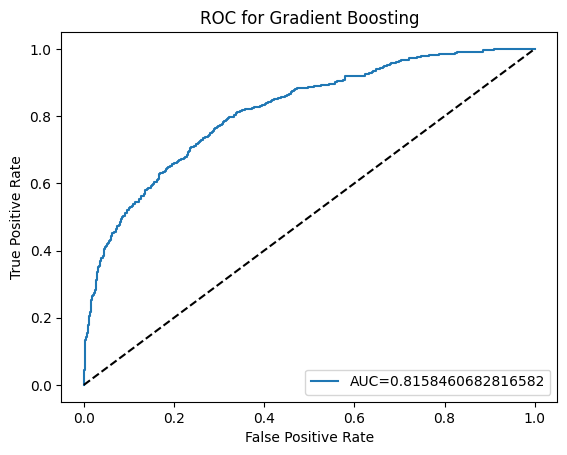

In [ ]:
#AUC
y_gbc_score = gbc.predict(X_tres)
y_gbc_proba = gbc.predict_proba(X_tres)
print("accuracy: ", metrics.accuracy_score(y_tres, y_gbc_score))
print("precision: ", metrics.precision_score(y_tres, y_gbc_score))
print("recall: ", metrics.recall_score(y_tres, y_gbc_score))
print("recall: ", metrics.recall_score(y_tres, y_gbc_score))
print("f1: ", metrics.f1_score(y_tres, y_gbc_score))
print("area under curve (auc): ", metrics.roc_auc_score(y_tres, y_gbc_proba[:,1]))


fpr_gbc, tpr_gbc, _ = roc_curve(y_tres, y_gbc_proba[:,1])

auc_gbc =  metrics.roc_auc_score(y_tres, y_gbc_proba[:,1])

plt.plot(fpr_gbc,tpr_gbc,label="AUC="+str(auc_gbc))
plt.plot([0,1],'k--')
plt.title('ROC for Gradient Boosting')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

[Text(0, 0.5, 'NPF'), Text(0, 1.5, 'PF')]

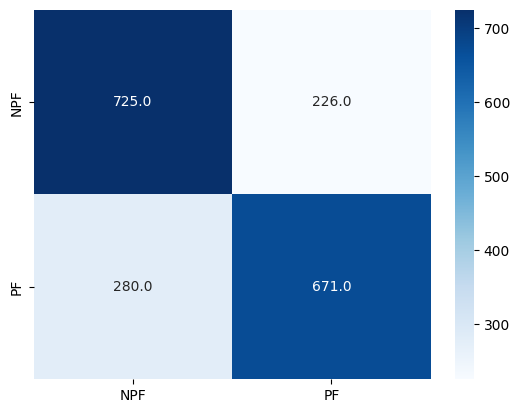

In [ ]:
cm_gb = confusion_matrix(y_tres, y_gbc_predictions)
categories = ['NPF','PF']
ax = sns.heatmap(cm_gb, annot=True, fmt='.1f',cmap='Blues')
ax.set_xticklabels(categories)
ax.set_yticklabels(categories)

In [ ]:
cm_gb = confusion_matrix(y_tres, y_gbc_predictions)

categories = ['Healthy','AFR']
ax = sns.heatmap(cm_gb, annot=True, fmt='.1f',cmap='Blues')
ax.set_xticklabels(categories)
ax.set_yticklabels(categories)

In [ ]:
pd.set_option('display.max_rows', None)
from google.colab import data_table

xx = X_tres['relCHO/NAA']
xx = pd.DataFrame(xx)
xx['predict_proba'] = gbc.predict_proba(X_tres)[:,1]
xx['classifier'] = y_tres
xx = xx.sort_values(by=['relCHO/NAA'])
print(xx)

ROC Raw Values

In [ ]:
gbc_roc_data = pd.DataFrame([fpr_gbc, tpr_gbc])
gbc_roc_data = gbc_roc_data.transpose()

Feature Importance

In [ ]:
gbc_explainer = shap.TreeExplainer(gboost_wbf)
shap_downsample_1500 = shap.sample(X_tres, 1500)
gbc_shap_values = gbc_explainer.shap_values(shap_downsample_1500)
gbc_shap = pd.DataFrame(gbc_shap_values, columns = X_tres.columns)
with pd.ExcelWriter('/content/drive/Shareddrives/MR_Spectroscopy/Shap_wbh_afr/SHAP_wbh_afr_GBOOST.xlsx') as writer :
  gbc_shap.to_excel(writer, sheet_name = 'Gradient Boosting')


Exception ignored in: <function ZipFile.__del__ at 0x79c1fae61090>
Traceback (most recent call last):
  File "/usr/lib/python3.10/zipfile.py", line 1819, in __del__
    self.close()
  File "/usr/lib/python3.10/zipfile.py", line 1836, in close
    self.fp.seek(self.start_dir)
ValueError: seek of closed file


In [ ]:
shap.summary_plot(gbc_shap_values, features=X_tres, feature_names=X_tres.columns, plot_type='bar')

In [ ]:
gbc_imp = gbc.feature_importances_
gbc_importances = pd.Series(gbc_imp, index = X_res.columns).sort_values()

In [ ]:
fig, ax = plt.subplots()
gbc_importances.plot.barh(ax=ax)
ax.set_title("GBC: Feature importances")
ax.set_ylabel("Features")

###Validation

In [ ]:
# Save a model for validation
import pickle
file_name = "/content/drive/Shareddrives/MR_Spectroscopy/app_files/070923_gradient_boosting_WBF_AFR_model.pkl"

# save
pickle.dump(gbc, open(file_name, "wb"))

NameError: name 'gbc' is not defined

In [ ]:
# Load a model for validation
import pickle
file_name = "/content/drive/Shareddrives/MR_Spectroscopy/app_files/070923_gradient_boosting_WBF_AFR_model.pkl"
with open(file_name, 'rb') as file:
    gboost_wbf = pickle.load(file)

In [ ]:
# Load gboost joblib binary

import os
import joblib
file_path = "/content/drive/Shareddrives/MR_Spectroscopy/app_files/gboost_623.joblib"
if os.path.exists(file_path):
    gboost_623 = joblib.load(file_path)
else:
    print("File not found.")
print(gboost_623.feature_names_in_)

In [ ]:
# # Load ANN binary
# from tensorflow import keras
# import tensorflow as tf

# # Load the Keras model
# ann_model = keras.models.load_model('/content/drive/Shareddrives/MR_Spectroscopy/Validation/model.h5')

Validation with whole-NPF+PF

In [ ]:
# Load NPF + PF for 53 & 88
cols = ['Glx._Sm',  'myo-Inositol_Sm', 'relNAA/CR',  'relCHO/CR', 'relCHO/NAA']
new_cols = ['glx','myoinositol', 'relnaacr', 'relchocr', 'relchonaa']
column_mapping = {
    'Glx._Sm': 'glx',
    'myo-Inositol_Sm': 'myoinositol',
    'relCHO/CR': 'relchocr',
    'relCHO/NAA': 'relchonaa',
    'relNAA/CR': 'relnaacr'}

npf_53 = pd.read_csv('/content/drive/Shareddrives/MR_Spectroscopy/Validation/npf_53.csv')
npf_53 = npf_53[cols]
npf_53['classifier'] = 0

pf_53 = pd.read_csv('/content/drive/Shareddrives/MR_Spectroscopy/Validation/pf_53.csv')
pf_53 = pf_53[cols]
pf_53['classifier'] = 1

flair_53 = pd.concat([npf_53, pf_53], axis=0)
#flair_53 = flair_53.rename(columns=column_mapping)
#flair_53_features = flair_53[new_cols]
flair_53_features = flair_53[cols]

npf_88 = pd.read_csv('/content/drive/Shareddrives/MR_Spectroscopy/Validation/npf_88.csv')
npf_88 = npf_88[cols]
npf_88['classifier'] = 0

pf_88 = pd.read_csv('/content/drive/Shareddrives/MR_Spectroscopy/Validation/pf_88.csv')
pf_88 = pf_88[cols]
pf_88['classifier'] = 1

flair_88 = pd.concat([npf_88, pf_88], axis=0)
flair_88_features = flair_88[cols]
#flair_88 = flair_88.rename(columns=column_mapping)
#flair_88_features = flair_88[new_cols]


#Load the WBH vs AFR for Validation Cohort
wbf_norec_val53 = pd.read_csv('/content/drive/Shareddrives/MR_Spectroscopy/wbf_norec_val53.csv')
wbf_norec_val88 = pd.read_csv('/content/drive/Shareddrives/MR_Spectroscopy/wbf_norec_val88.csv')
rec_val_concat53 = pd.read_csv('/content/drive/Shareddrives/MR_Spectroscopy/rec_val53.csv')
rec_val_concat88 = pd.read_csv('/content/drive/Shareddrives/MR_Spectroscopy/rec_val88.csv')

wbf_norec_val53 = wbf_norec_val53[cols]
wbf_norec_val88 = wbf_norec_val88[cols]
rec_val_concat53 = rec_val_concat53[cols]
rec_val_concat88 = rec_val_concat88[cols]

wbf_norec_val53['classifier'] = 0
wbf_norec_val88['classifier'] = 0
rec_val_concat53['classifier'] = 1
rec_val_concat88['classifier'] = 1

wbh_afr_val53 = pd.concat([wbf_norec_val53, rec_val_concat53])
wbh_afr_val53_features = wbh_afr_val53[cols]
wbh_afr_val88 = pd.concat([wbf_norec_val88, rec_val_concat88])
wbh_afr_val88_features = wbh_afr_val88[cols]

<ipython-input-8-da7640c4abe3>:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wbf_norec_val53['classifier'] = 0
<ipython-input-8-da7640c4abe3>:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wbf_norec_val88['classifier'] = 0
<ipython-input-8-da7640c4abe3>:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/inde

In [ ]:
# Run features through classifier
model = gboost_wbf
flair_53['predict_proba'] = model.predict_proba(flair_53_features)[:,1]
flair_53['predictions'] = model.predict(flair_53_features)
flair_88['predict_proba'] = model.predict_proba(flair_88_features)[:,1]
flair_88['predictions'] = model.predict(flair_88_features)


# flair_53['predictions'] = np.where(flair_53_features['relCHO/NAA'] > 1.6, 1, 0)
# flair_53['predict_proba'] = flair_53['predictions']
# flair_88['predictions'] = np.where(flair_88_features['relCHO/NAA'] > 1.6, 1, 0)
# flair_88['predict_proba'] = flair_88['predictions']


wbh_afr_val53['predict_proba'] = model.predict_proba(wbh_afr_val53_features)[:,1]
wbh_afr_val53['predictions'] = model.predict(wbh_afr_val53_features)
wbh_afr_val88['predict_proba'] = model.predict_proba(wbh_afr_val88_features)[:,1]
wbh_afr_val88['predictions'] = model.predict(wbh_afr_val88_features)

#for cho/naa

# wbh_afr_val53['predictions'] = np.where(wbh_afr_val53['relCHO/NAA'] > 1.6, 1, 0)
# wbh_afr_val53['predict_proba'] = wbh_afr_val53['predictions']
# wbh_afr_val88['predictions'] = np.where(wbh_afr_val88['relCHO/NAA'] > 1.6, 1, 0)
# wbh_afr_val88['predict_proba'] = wbh_afr_val88['predictions']

Plot the validation predictions on a map

*   First snippet prepares data to be plotted
*   Second snippet plots the graphs 2D + 3D



In [ ]:
# Load in new sheets to add X, Y, Z to the table
whole53 = pd.read_excel('/content/drive/Shareddrives/MR_Spectroscopy/txt_files/Recurrence/BL053.xlsx')
rec53 = pd.read_excel('/content/drive/Shareddrives/MR_Spectroscopy/txt_files/Recurrence/BL053.xlsx', sheet_name = 'Recurrence')
whole88 = pd.read_excel('/content/drive/Shareddrives/MR_Spectroscopy/txt_files/Recurrence/BL088.xlsx')
rec88 = pd.read_excel('/content/drive/Shareddrives/MR_Spectroscopy/txt_files/Recurrence/BL088.xlsx', sheet_name = 'Recurrence')

# Isolate rec + wbh from each other
rec_53_xyz = whole53[whole53['data_xyz'].isin(rec53['data_xyz'])]
rec_88_xyz = whole88[whole88['data_xyz'].isin(rec88['data_xyz'])]
wbh_53_xyz = whole53[~whole53['data_xyz'].isin(rec53['data_xyz'])]
wbh_88_xyz = whole88[~whole88['data_xyz'].isin(rec88['data_xyz'])]

# Isolate relevant cols
rec_53_xyz = rec_53_xyz[['x', 'y', 'z', 'relCHO/NAA', 'relCHO/CR', 'relNAA/CR', 'myo-Inositol_Sm', 'Glx._Sm']]
rec_88_xyz = rec_88_xyz[['x', 'y', 'z', 'relCHO/NAA', 'relCHO/CR', 'relNAA/CR', 'myo-Inositol_Sm', 'Glx._Sm']]
wbh_53_xyz = wbh_53_xyz[['x', 'y', 'z', 'relCHO/NAA', 'relCHO/CR', 'relNAA/CR', 'myo-Inositol_Sm', 'Glx._Sm']]
wbh_88_xyz = wbh_88_xyz[['x', 'y', 'z', 'relCHO/NAA', 'relCHO/CR', 'relNAA/CR', 'myo-Inositol_Sm', 'Glx._Sm']]

# Remove first empty row from wbh df's
wbh_53_xyz = wbh_53_xyz.iloc[1:]
wbh_88_xyz = wbh_88_xyz.iloc[1:]

# Make model predictions
rec_53_xyz['predict_proba'] = model.predict_proba(rec_53_xyz[cols])[:,1]
rec_88_xyz['predict_proba'] = model.predict_proba(rec_88_xyz[cols])[:,1]
wbh_53_xyz['predict_proba'] = model.predict_proba(wbh_53_xyz[cols])[:,1]
wbh_88_xyz['predict_proba'] = model.predict_proba(wbh_88_xyz[cols])[:,1]

full_53 = pd.concat([rec_53_xyz, wbh_53_xyz], ignore_index=True)
full_88 = pd.concat([rec_88_xyz, wbh_88_xyz], ignore_index=True)


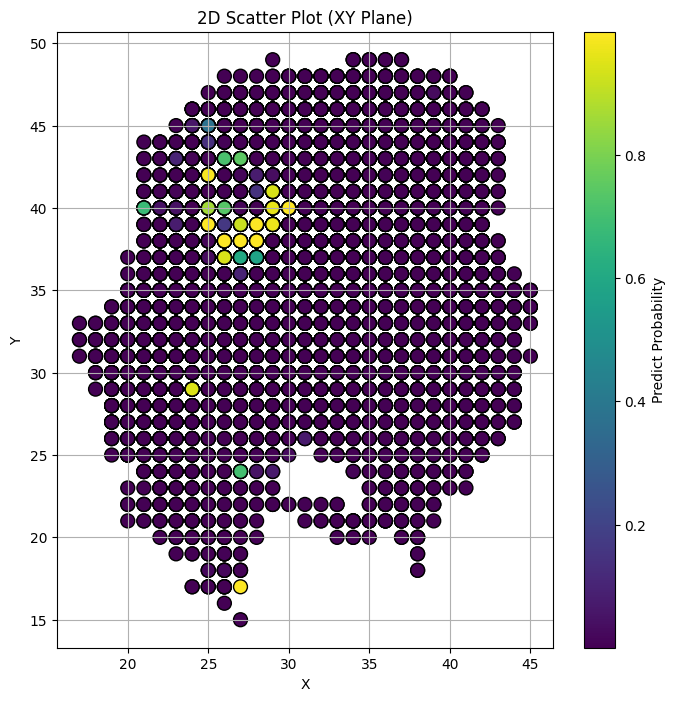

In [ ]:
# 2D Scatter Plot (XY Plane)
plt.figure(figsize=(8, 8))
scatter = plt.scatter(full_53['x'], full_53['y'], c=full_53['predict_proba'], cmap='viridis', s=100, edgecolor='k')
plt.colorbar(scatter, label='Predict Probability')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('2D Scatter Plot (XY Plane)')
plt.grid(True)
plt.show()

BL_053 Visualized 2D Heatmap

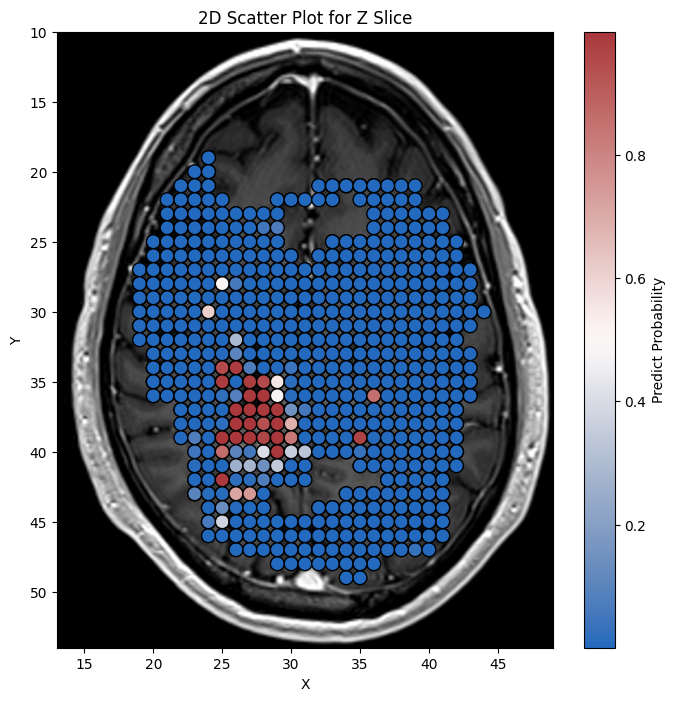

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg
# !pip install pillow
from PIL import Image

#background_img = mpimg.imread('/content/drive/Shareddrives/MR_Spectroscopy/BL_055_z19_T1CE.png')

image_path = '/content/drive/Shareddrives/MR_Spectroscopy/BL_055_z19_T1CE.png'
image = Image.open(image_path)
flipped_image = image.transpose(Image.FLIP_TOP_BOTTOM)
flipped_image = np.array(flipped_image)

for z_slice_value in range(0, len(full_53.z.unique())):

  # Stop the loop after 1
  if z_slice_value >= 1:
    break

  # Sample data preparation
  x = full_53['x']
  y = full_53['y']
  z = full_53['z']
  predict_proba = full_53['predict_proba']

  # Define the specific z slice to plot
  z_slice_value = 19 #z_slice_value  # Replace this with the desired z value
  tolerance = 1                      # Adjust this value to widen or narrow the slice range

  # Apply filter to only include points where z is around the specified z slice value
  mask = np.abs(z - z_slice_value) <= tolerance
  x_filtered = x[mask]
  y_filtered = y[mask]
  predict_proba_filtered = predict_proba[mask]

  # Create a new figure
  plt.figure(figsize=(8, 8))

  x_min = 13
  x_max = 49
  y_max = 54
  y_min = 10
  plt.imshow(image, extent=[x_max, x_min, y_min, y_max], aspect='auto')


  # Create a scatter plot with filtered data
  scatter = plt.scatter(x_filtered, y_filtered, c=predict_proba_filtered, cmap='vlag', s=100, edgecolor='k')

  # Add a color bar
  plt.colorbar(scatter, label='Predict Probability')

  # Set labels and title
  plt.xlabel('X')
  plt.ylabel('Y')
  plt.title(f'2D Scatter Plot for Z Slice')


  # Turn off the grid
  plt.grid(False)

  # Modify X and Y axis length
  plt.xlim(x_min, x_max)
  plt.ylim(y_min, y_max)

  # Place posterior voxels at bottom for overlay on MRI
  plt.gca().invert_yaxis()


  # Show the plot
  plt.show()


Repeat for BL088

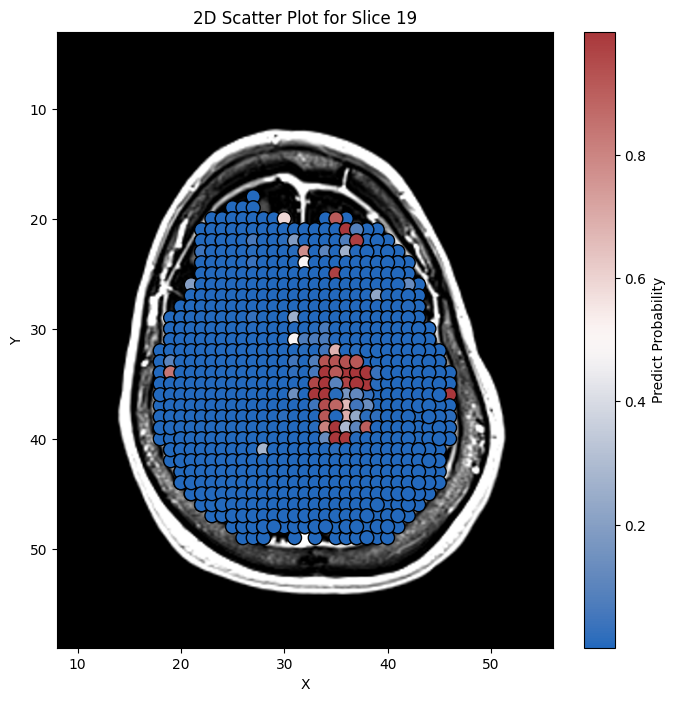

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg
# !pip install pillow
from PIL import Image

#background_img = mpimg.imread('/content/drive/Shareddrives/MR_Spectroscopy/BL_055_z19_T1CE.png')

image_path = '/content/drive/Shareddrives/MR_Spectroscopy/BL_088_z19_T1CE.png'
image = Image.open(image_path)
flipped_image = image.transpose(Image.FLIP_TOP_BOTTOM)
flipped_image = np.array(flipped_image)

for z_slice_value in range(0, len(full_88.z.unique())):

  # # Stop the loop after 1
  if z_slice_value >= 1:
    break

  # Sample data preparation
  x = full_88['x']
  y = full_88['y']
  z = full_88['z']
  predict_proba = full_88['predict_proba']

  # Define the specific z slice to plot
  z_slice_value = 19 #z_slice_value  # Replace this with the desired z value
  tolerance = 1                      # Adjust this value to widen or narrow the slice range

  # Apply filter to only include points where z is around the specified z slice value
  mask = np.abs(z - z_slice_value) <= tolerance
  x_filtered = x[mask]
  y_filtered = y[mask]
  predict_proba_filtered = predict_proba[mask]

  # Create a new figure
  plt.figure(figsize=(8, 8))

  x_min = 8
  x_max = 56
  y_max = 59
  y_min = 3
  plt.imshow(flipped_image, extent=[x_min, x_max, y_min, y_max], aspect='auto')


  # Create a scatter plot with filtered data
  scatter = plt.scatter(x_filtered, y_filtered, c=predict_proba_filtered, cmap='vlag', s=100, edgecolor='k')

  # Add a color bar
  plt.colorbar(scatter, label='Predict Probability')

  # Set labels and title
  plt.xlabel('X')
  plt.ylabel('Y')
  plt.title(f'2D Scatter Plot for Slice {z_slice_value}')


  # Turn off the grid
  plt.grid(False)

  # Modify X and Y axis length
  plt.xlim(x_min, x_max)
  plt.ylim(y_min, y_max)

  # Place posterior voxels at bottom for overlay on MRI
  plt.gca().invert_yaxis()


  # Show the plot
  plt.show()


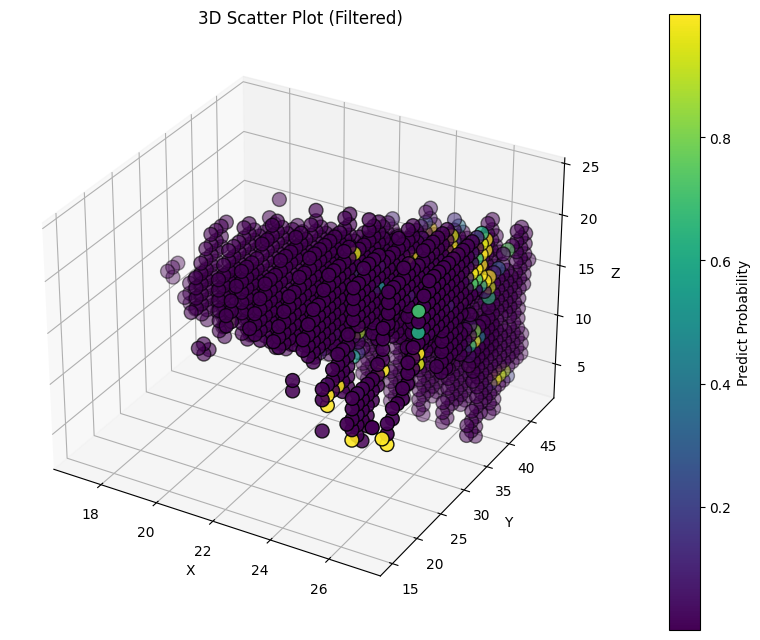

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Sample data preparation
x = full_53['x']
y = full_53['y']
z = full_53['z']
predict_proba = full_53['predict_proba']

# Apply filter to only include points where x is between 0 and 30
mask = (x >= 0) & (x <= 27)
x_filtered = x[mask]
y_filtered = y[mask]
z_filtered = z[mask]
predict_proba_filtered = predict_proba[mask]

# Create a new figure
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Create a scatter plot with filtered data
scatter = ax.scatter(x_filtered, y_filtered, z_filtered, c=predict_proba_filtered, cmap='viridis', s=100, edgecolor='k')

# Add a color bar
cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Predict Probability')

# Set labels and title
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3D Scatter Plot (Filtered)')

# Show grid
ax.grid(True)

# Show the plot
plt.show()


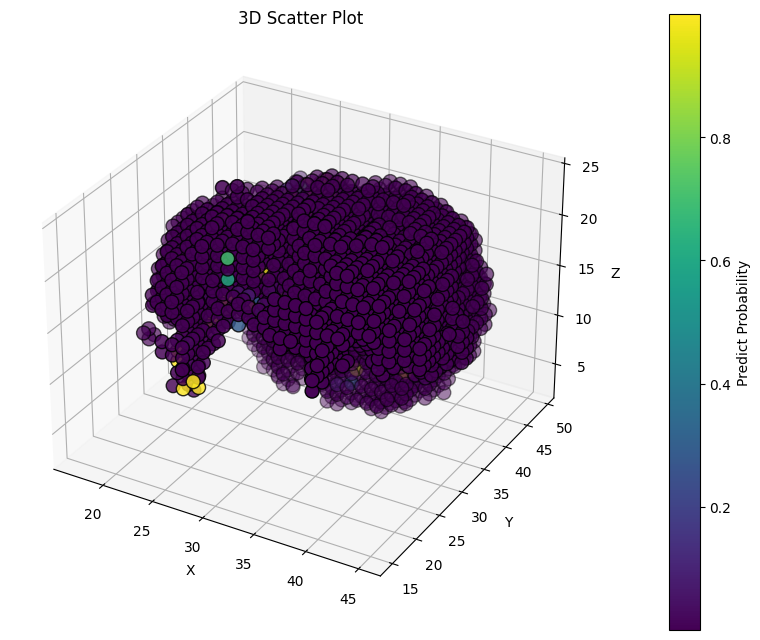

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Sample data preparation
x = full_53['x']
y = full_53['y']
z = full_53['z']
predict_proba = full_53['predict_proba']

# Create a new figure
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Create a scatter plot
scatter = ax.scatter(x, y, z, c=predict_proba, cmap='viridis', s=100, edgecolor='k')

# Add a color bar
cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Predict Probability')

# Set labels and title
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3D Scatter Plot')

# Show grid
ax.grid(True)

# Show the plot
plt.show()


...back to the regular code pipeline:

In [ ]:
# make sure saved model has same AUC as above

# Over-write's X_tres, be careful
#X_tres = X_tres.rename(columns=column_mapping)
#X_tres = X_tres[new_cols]

y_gbc_score = model.predict(X_tres)
y_gbc_proba = model.predict_proba(X_tres)
print("accuracy: ", metrics.accuracy_score(y_tres, y_gbc_score))
print("precision: ", metrics.precision_score(y_tres, y_gbc_score))
print("recall: ", metrics.recall_score(y_tres, y_gbc_score))
print("f1: ", metrics.f1_score(y_tres, y_gbc_score))
print("area under curve (auc): ", metrics.roc_auc_score(y_tres, y_gbc_proba[:,1]))


fpr_gbc, tpr_gbc, _ = roc_curve(y_tres, y_gbc_proba[:,1])

auc_gbc =  metrics.roc_auc_score(y_tres, y_gbc_proba[:,1])

plt.plot(fpr_gbc,tpr_gbc,label="AUC="+str(auc_gbc))
plt.plot([0,1],'k--')
plt.title('ROC for Gradient Boosting')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

NameError: name 'X_tres' is not defined

BL_053 FLAIR

[Text(0, 0.5, 'Healthy'), Text(0, 1.5, 'Recurrence')]

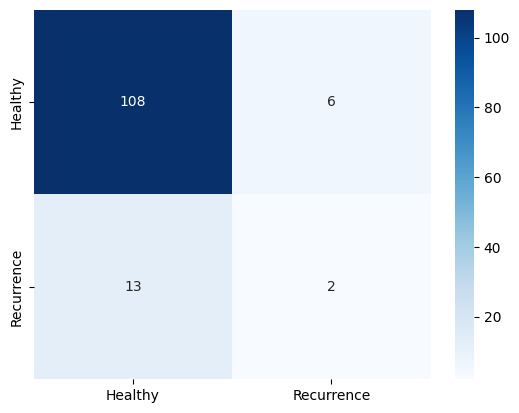

In [ ]:
cm_53 = confusion_matrix(flair_53.predictions, flair_53.classifier)
categories = ['Healthy','Recurrence']
ax = sns.heatmap(cm_53, annot=True,fmt='d',cmap='Blues')
ax.set_xticklabels(categories)
ax.set_yticklabels(categories)

accuracy:  0.8527131782945736
precision:  0.13333333333333333
recall:  0.25
f1:  0.1739130434782609
area under curve (auc):  0.7427685950413223


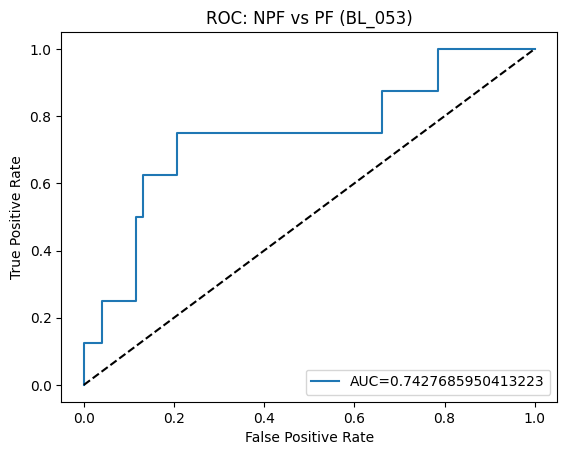

In [ ]:
#AUC: BL_053
print("accuracy: ", metrics.accuracy_score(flair_53.classifier, flair_53.predictions))
print("precision: ", metrics.precision_score(flair_53.classifier, flair_53.predictions))
print("recall: ", metrics.recall_score(flair_53.classifier, flair_53.predictions))
print("f1: ", metrics.f1_score(flair_53.classifier, flair_53.predictions))
print("area under curve (auc): ", metrics.roc_auc_score(flair_53.classifier, flair_53.predict_proba))

fpr_gbc, tpr_gbc, _ = roc_curve(flair_53.classifier, flair_53.predict_proba)

auc_gbc =  metrics.roc_auc_score(flair_53.classifier, flair_53.predict_proba)

plt.plot(fpr_gbc,tpr_gbc,label="AUC="+str(auc_gbc))
plt.plot([0,1],'k--')
plt.title('ROC: NPF vs PF (BL_053)')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

BL_053 WBH vs AFR

[Text(0, 0.5, 'Healthy'), Text(0, 1.5, 'Recurrence')]

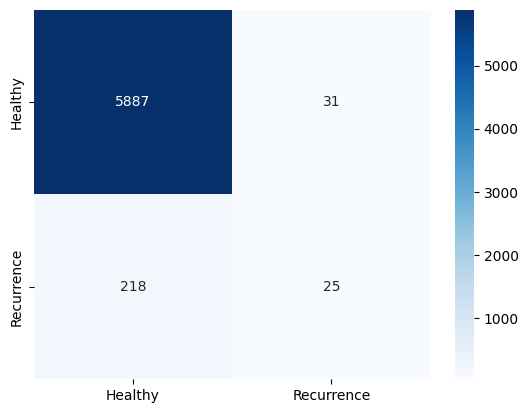

In [ ]:
cm_53 = confusion_matrix(wbh_afr_val53.predictions, wbh_afr_val53.classifier)
categories = ['Healthy','Recurrence']
ax = sns.heatmap(cm_53, annot=True,fmt='d',cmap='Blues')
ax.set_xticklabels(categories)
ax.set_yticklabels(categories)

accuracy:  0.9595844830384678
precision:  0.102880658436214
recall:  0.44642857142857145
f1:  0.16722408026755853
area under curve (auc):  0.9034866034866035


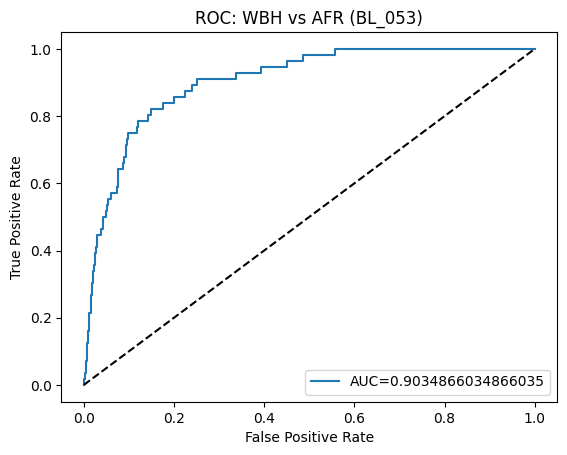

In [ ]:
#AUC: BL_053
print("accuracy: ", metrics.accuracy_score(wbh_afr_val53.classifier, wbh_afr_val53.predictions))
print("precision: ", metrics.precision_score(wbh_afr_val53.classifier, wbh_afr_val53.predictions))
print("recall: ", metrics.recall_score(wbh_afr_val53.classifier, wbh_afr_val53.predictions))
print("f1: ", metrics.f1_score(wbh_afr_val53.classifier, wbh_afr_val53.predictions))
print("area under curve (auc): ", metrics.roc_auc_score(wbh_afr_val53.classifier, wbh_afr_val53.predict_proba))

fpr_gbc, tpr_gbc, _ = roc_curve(wbh_afr_val53.classifier, wbh_afr_val53.predict_proba)

auc_gbc =  metrics.roc_auc_score(wbh_afr_val53.classifier, wbh_afr_val53.predict_proba)

plt.plot(fpr_gbc,tpr_gbc,label="AUC="+str(auc_gbc))
plt.plot([0,1],'k--')
plt.title('ROC: WBH vs AFR (BL_053)')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

BL_088 FLAIR

[Text(0, 0.5, 'Healthy'), Text(0, 1.5, 'Recurrence')]

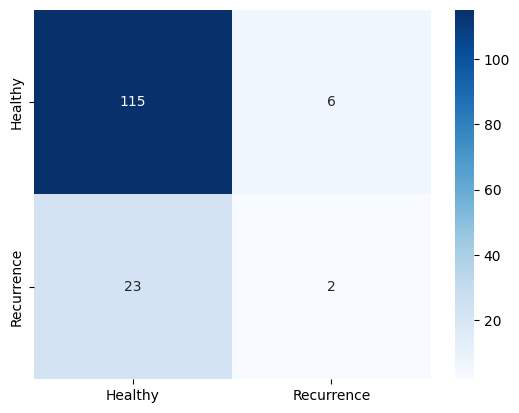

In [ ]:
cm_88 = confusion_matrix(flair_88.predictions, flair_88.classifier, )
categories = ['Healthy','Recurrence']
ax = sns.heatmap(cm_88, annot=True,fmt='d',cmap='Blues')
ax.set_xticklabels(categories)
ax.set_yticklabels(categories)

accuracy:  0.8013698630136986
precision:  0.08
recall:  0.25
f1:  0.12121212121212122
area under curve (auc):  0.7119565217391305


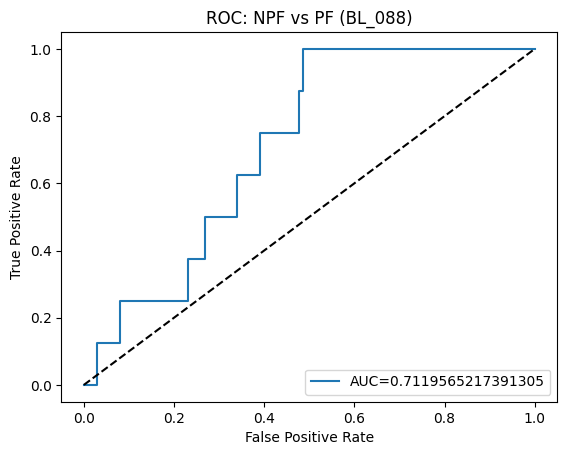

In [ ]:
#AUC: BL_088
print("accuracy: ", metrics.accuracy_score(flair_88.classifier, flair_88.predictions))
print("precision: ", metrics.precision_score(flair_88.classifier, flair_88.predictions))
print("recall: ", metrics.recall_score(flair_88.classifier, flair_88.predictions))
print("f1: ", metrics.f1_score(flair_88.classifier, flair_88.predictions))
print("area under curve (auc): ", metrics.roc_auc_score(flair_88.classifier, flair_88.predict_proba))

fpr_gbc, tpr_gbc, _ = roc_curve(flair_88.classifier, flair_88.predict_proba)

auc_gbc =  metrics.roc_auc_score(flair_88.classifier, flair_88.predict_proba)

plt.plot(fpr_gbc,tpr_gbc,label="AUC="+str(auc_gbc))
plt.plot([0,1],'k--')
plt.title('ROC: NPF vs PF (BL_088)')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

BL_088 WBH vs AFR

[Text(0, 0.5, 'Healthy'), Text(0, 1.5, 'Recurrence')]

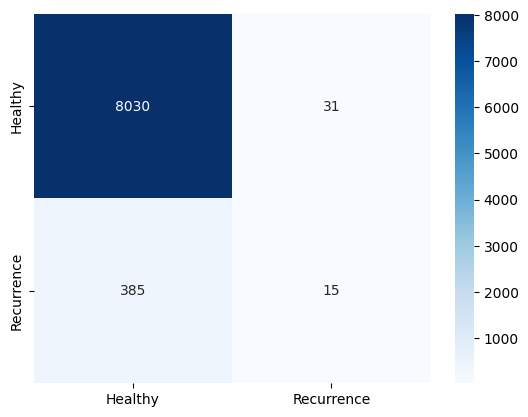

In [ ]:
cm_88 = confusion_matrix(wbh_afr_val88.predictions, wbh_afr_val88.classifier)
categories = ['Healthy','Recurrence']
ax = sns.heatmap(cm_88, annot=True,fmt='d',cmap='Blues')
ax.set_xticklabels(categories)
ax.set_yticklabels(categories)

accuracy:  0.9508332348422173
precision:  0.0375
recall:  0.32608695652173914
f1:  0.06726457399103139
area under curve (auc):  0.830047275827327


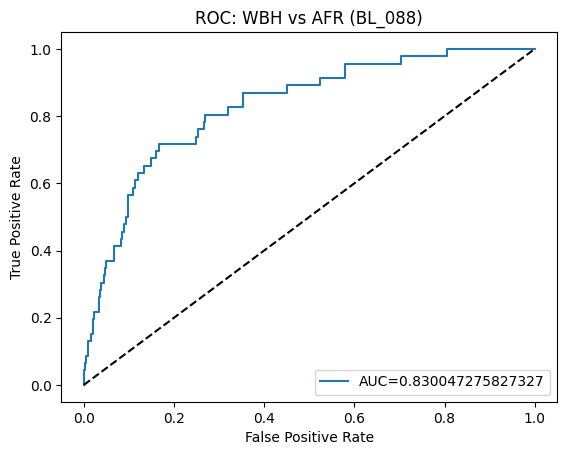

In [ ]:
#AUC: BL_088
print("accuracy: ", metrics.accuracy_score(wbh_afr_val88.classifier, wbh_afr_val88.predictions))
print("precision: ", metrics.precision_score(wbh_afr_val88.classifier, wbh_afr_val88.predictions))
print("recall: ", metrics.recall_score(wbh_afr_val88.classifier, wbh_afr_val88.predictions))
print("f1: ", metrics.f1_score(wbh_afr_val88.classifier, wbh_afr_val88.predictions))
print("area under curve (auc): ", metrics.roc_auc_score(wbh_afr_val88.classifier, wbh_afr_val88.predict_proba))

fpr_gbc, tpr_gbc, _ = roc_curve(wbh_afr_val88.classifier, wbh_afr_val88.predict_proba)

auc_gbc =  metrics.roc_auc_score(wbh_afr_val88.classifier, wbh_afr_val88.predict_proba)

plt.plot(fpr_gbc,tpr_gbc,label="AUC="+str(auc_gbc))
plt.plot([0,1],'k--')
plt.title('ROC: WBH vs AFR (BL_088)')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

Validation with Voxels Chosen for Radiologists

*results stored on Google Sheets

In [ ]:
# Isolate survey voxels for validation

#colnames = ['relCHO/NAA', 'relCHO/CR', 'relNAA/CR', 'myo-Inositol_Sm', 'Glx._Sm']
colnames = ['Glx._Sm', 'myo-Inositol_Sm', 'relNAA/CR', 'relCHO/CR', 'relCHO/NAA']
model = gboost_wbf

bl53 = pd.read_csv("/content/drive/Shareddrives/MR_Spectroscopy/wb53.csv")
#bl53_subset = ['(26,32,20)', '(27,26,20)', '(26,36,20)', '(26,42,17)', '(28,38,20)', '(29,41,20)', '(25,41,17)', '(30,36,17)']

####USE THIS LINE INSTEAD TO MODIFY#####
bl53_subset = ['(26,32,20)', '(27,26,20)', '(26,36,20)', '(26,42,17)', '(28,38,20)', '(29,41,20)', '(30,36,17)']
bl53_val = bl53[bl53['data_xyz'].isin(bl53_subset)]
bl53_val = bl53_val.loc[:, colnames]

features_53 = bl53_val.values
predictions_53 = model.predict_proba(features_53)
#predictions_53_rf = rf_model.predict(features_53)
#predict_proba_53_rf = rf_model.predict_proba(features_53)
bl53_result = bl53_val.copy()
bl53_result['Predictions'] = predictions_53[:,1]
#bl53_result['Pred_RF'] = predictions_53_rf
#bl53_result['Pred_proba_rf'] = predict_proba_53_rf[:,1]


# Display the `bl53_result` DataFrame
print(bl53_result)

bl88 = pd.read_csv("/content/drive/Shareddrives/MR_Spectroscopy/wb88.csv")
#bl88_subset = ['(37,40,19)','(40,37,19)','(39,39,19)','(36,39,18)', '(39,37,18)','(39,38,20)','(39,37,19)','(39,36,19)', '(37,37,18)','(37,38,18)']

####USE THIS LINE INSTEAD TO MODIFY#####
bl88_subset = ['(37,40,19)','(40,37,19)','(39,39,19)','(36,39,18)', '(39,37,18)','(39,38,20)','(39,37,19)', '(37,37,18)','(37,38,18)']
bl88_val = bl88[bl88['data_xyz'].isin(bl88_subset)]
bl88_val = bl88_val.loc[:, colnames]

features_88 = bl88_val.values
predictions_88 = model.predict_proba(features_88)
#predictions_88_rf = rf_model.predict(features_88)
#predict_proba_88_rf = rf_model.predict_proba(features_88)


bl88_result = bl88_val.copy()
bl88_result['Predictions'] = predictions_88[:,1]
#bl88_result['Pred_RF'] = predictions_88_rf
#bl88_result['Pred_proba_rf'] = predict_proba_88_rf[:,1]

# Display the `bl88_result` DataFrame
print(bl88_result)





NameError: name 'gboost_wbf' is not defined

Cohen's Kappa for Interrater Agreeance

In [ ]:
from sklearn.metrics import cohen_kappa_score

# Replace the data_matrix with your actual data
data_matrix = [
[1, 0,  1, 	0,	1,	1,	1,	0,	0,	1,	1,	1,	1,	1,	1,	1,	1],
[1,	0,  1,	0,	0,	1,	0,	0,	0,	1,	1,	1,	0,	1,	0,	1,	1],
[1,	0,  0,	0,	1,	1,	0,	1,	1,	1,	1,	1,	1,	1,	1,	1,	1],
[0,	0,  0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	1]
]


# Replace the ground_truth with the actual ground truth values if you have them
ground_truth = [1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1]

# Flatten the data matrix and ground truth list
observed = sum(data_matrix, [])
expected = ground_truth * len(data_matrix)

# Calculate Cohen's Kappa
kappa = cohen_kappa_score(observed, expected)

print("Cohen's Kappa:", kappa)
data_with_ground_truth = np.vstack([ground_truth, data_matrix])

# # Export data to CSV
# import csv
# with open('survey_data.csv', 'w', newline='') as csvfile:
#     csvwriter = csv.writer(csvfile)
#     csvwriter.writerows(data_with_ground_truth)

Cohen's Kappa: 0.29655172413793107


0
0     1
1     0
2     1
3     0
4     1
5     1
6     1
7     0
8     0
9     1
10    1
11    1
12    1
13    1
14    1
15    1
16    1
Name: 0, dtype: int64
i = 0
j = 0
ground truth: 1
i = 0
j = 1
ground truth: 0
i = 0
j = 2
ground truth: 0
i = 0
j = 3
ground truth: 0
i = 0
j = 4
ground truth: 1
i = 0
j = 5
ground truth: 1
i = 0
j = 6
ground truth: 0
i = 0
j = 7
ground truth: 1
i = 0
j = 8
ground truth: 0
i = 0
j = 9
ground truth: 1
i = 0
j = 10
ground truth: 0
i = 0
j = 11
ground truth: 1
i = 0
j = 12
ground truth: 0
i = 0
j = 13
ground truth: 1
i = 0
j = 14
ground truth: 0
i = 0
j = 15
ground truth: 0
i = 0
j = 16
ground truth: 1
1
0     1
1     0
2     1
3     0
4     0
5     1
6     0
7     0
8     0
9     1
10    1
11    1
12    0
13    1
14    0
15    1
16    1
Name: 1, dtype: int64
i = 1
j = 0
ground truth: 1
i = 1
j = 1
ground truth: 0
i = 1
j = 2
ground truth: 0
i = 1
j = 3
ground truth: 0
i = 1
j = 4
ground truth: 1
i = 1
j = 5
ground truth: 1
i = 1
j = 6
ground truth: 0
i

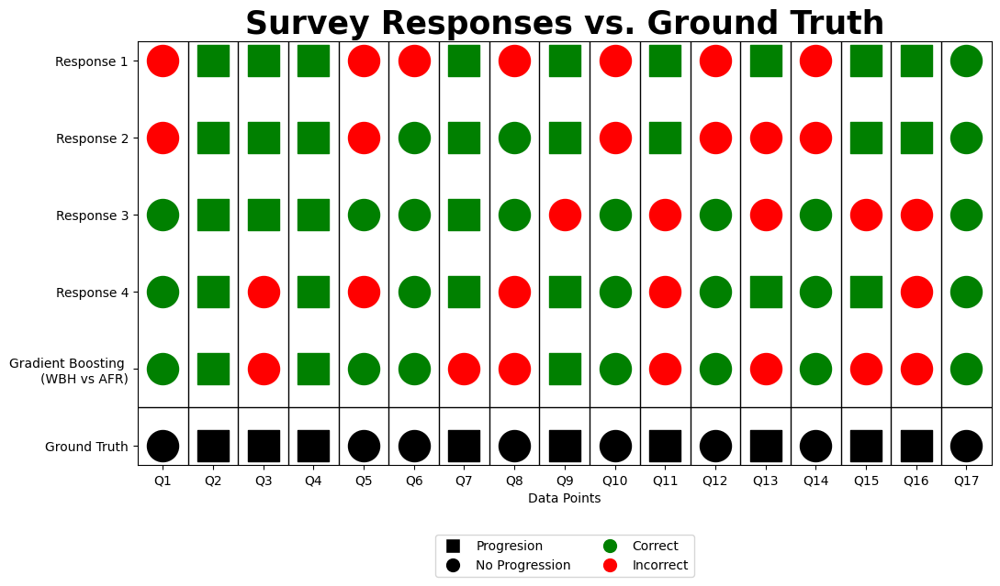

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
import matplotlib.pyplot as plt

import numpy as np
import matplotlib.pyplot as plt

# Define colors for 0 and 1 (red and green)
colors = {0: 'blue', 1: 'orange'}
color_no = colors[0]
color_yes = colors[1]
import numpy as np
import matplotlib.pyplot as plt

data_matrix_with_ml = [
[1, 0,  1, 	0,	1,	1,	1,	0,	0,	1,	1,	1,	1,	1,	1,	1,	1],
[1,	0,  1,	0,	0,	1,	0,	0,	0,	1,	1,	1,	0,	1,	0,	1,	1],
[1,	0,  0,	0,	1,	1,	0,	1,	1,	1,	1,	1,	1,	1,	1,	1,	1],
[0, 0,  0,  0,  0,  1,  0,  1,  0,  0,  0,  0,  1,  0,  0,  0,  1],
[0,	0,  0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	1]
]
data_matrix = pd.DataFrame(data_matrix_with_ml)

# Define colors for 0 and 1 in the ground truth
colors_ground_truth = {0: 'blue', 1: 'orange'}

# Plot responses
plt.figure(figsize=(12, 6))
for i in range(0,len(data_matrix.loc[:,0])):
    print(i)
    row_i = data_matrix.loc[i,:]
    print(row_i)

    for j in range(0,len(row_i)):
        print('i = ' + str(i))
        print('j = ' + str(j))
        print('ground truth: ' + str(ground_truth[j]))
        ground_truth_val = ground_truth[j]
        color = 'green' if row_i[j] == ground_truth_val else 'red'
        if ground_truth_val== 0 and color == 'green':
          marker = 's'
        else:
          marker = 'o'
        plt.scatter(j, i, color=color, marker=marker, s=600)

# Plot ground truth with different markers
y_ground_truth = [-1] * len(ground_truth)
for j, val in enumerate(ground_truth):
    marker = 's' if val == 0 else 'o'
    color = 'black'
    plt.scatter(j, y_ground_truth[0], color=color, marker=marker, s=600)

# Add a horizontal black bar
plt.axhline(y=-0.5, color='black', linewidth=1)

# Add vertical black bars between each question
for i in range(1, len(data_matrix.loc[0,:])):
    plt.axvline(x=i - 0.5, color='black', linewidth=1)

# Set x-axis limits to fix the width and centering of columns
plt.xlim(-0.5, len(data_matrix.loc[0,:]) - 0.5)

# Set labels and title
y_tick_labels = ['Ground Truth'] + ['Gradient Boosting \n(WBH vs AFR)'] + ['Response ' + str(4-i) for i in range(len(data_matrix)-1)]
plt.yticks(list(range(-1, len(data_matrix))), y_tick_labels)
plt.xlabel('Data Points')
plt.title('Survey Responses vs. Ground Truth', fontweight='bold',fontsize = 25)

# Set x-axis labels to be [Q1, Q2, Q3, ..., Q18]
question_labels = ['Q{}'.format(i+1) for i in range(len(data_matrix.loc[0,:]))]
plt.xticks(range(len(data_matrix.loc[0,:])), question_labels)


# Create a legend
legend_elements = [plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='black', markersize=12, label='Progresion'),
                   plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=12, label='No Progression'),
                   plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=12, label='Correct'),
                   plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=12, label='Incorrect')]
plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.savefig('/content/drive/Shareddrives/MR_Spectroscopy/figures/survey_responses.png')

plt.show()



<Figure size 1200x600 with 0 Axes>

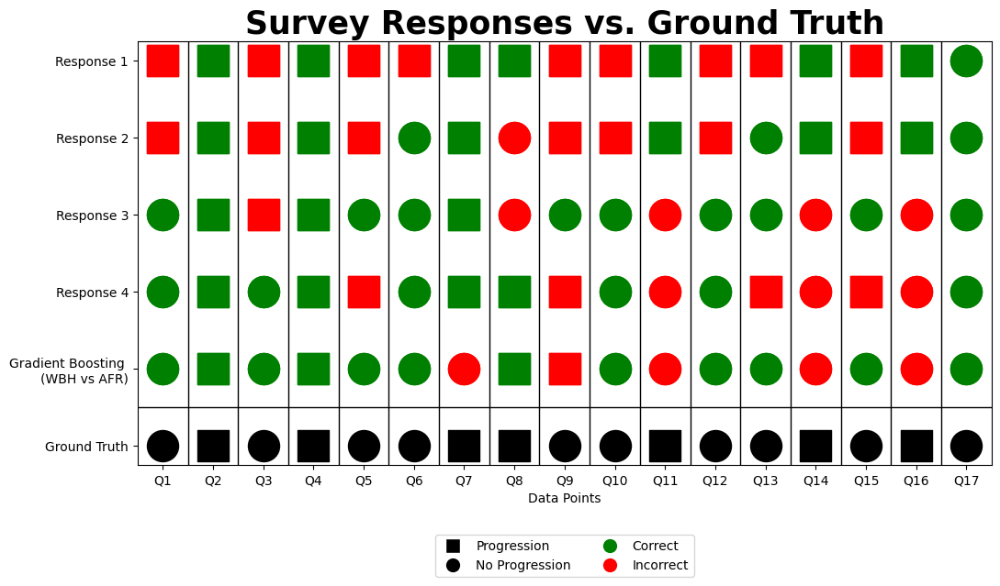

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define colors for 0 and 1
colors = {0: 'blue', 1: 'orange'}

# Example ground truth (you need to provide this data)
ground_truth = [1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1]

data_matrix_with_ml = [
    [1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1],
    [1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]
]
data_matrix = pd.DataFrame(data_matrix_with_ml)

# Plot responses
plt.figure(figsize=(12, 6))
for i in range(len(data_matrix)):
    row_i = data_matrix.loc[i, :]
    for j in range(len(row_i)):
        ground_truth_val = ground_truth[j]

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define colors for 0 and 1
colors = {0: 'blue', 1: 'orange'}

# Example ground truth and additional condition value
ground_truth = [1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1]
some_value = 1  # Example condition for x

data_matrix_with_ml = [
    [1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1],
    [1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]
]
data_matrix = pd.DataFrame(data_matrix_with_ml)

# Plot responses
plt.figure(figsize=(12, 6))
for i in range(len(data_matrix)):
    row_i = data_matrix.loc[i, :]
    for j in range(len(row_i)):
        ground_truth_val = ground_truth[j]
        # Determine color and marker
        if row_i[j] == ground_truth_val:
            color = 'green'
            marker = 's' if ground_truth_val == 0 else 'o'
        else:
            color = 'red'
            marker = 'o'  if ground_truth_val == 0 else 's'
        # Plot the data point
        plt.scatter(j, i, color=color, marker=marker, s=600)

        plt.scatter(j, i, color=color, marker=marker, s=600)

# Plot ground truth with different markers
y_ground_truth = [-1] * len(ground_truth)
for j, val in enumerate(ground_truth):
    marker = 's' if val == 0 else 'o'
    color = 'black'
    plt.scatter(j, y_ground_truth[0], color=color, marker=marker, s=600)

# Add horizontal black bar
plt.axhline(y=-0.5, color='black', linewidth=1)

# Add vertical black bars between each question
for i in range(1, len(data_matrix.columns)):
    plt.axvline(x=i - 0.5, color='black', linewidth=1)

# Set x-axis limits to fix the width and centering of columns
plt.xlim(-0.5, len(data_matrix.columns) - 0.5)

# Set labels and title
y_tick_labels = ['Ground Truth'] + ['Gradient Boosting \n(WBH vs AFR)'] + ['Response ' + str(4-i) for i in range(len(data_matrix)-1)]
plt.yticks(list(range(-1, len(data_matrix))), y_tick_labels)
plt.xlabel('Data Points')
plt.title('Survey Responses vs. Ground Truth', fontweight='bold', fontsize=25)

# Set x-axis labels to be [Q1, Q2, Q3, ..., Q18]
question_labels = ['Q{}'.format(i+1) for i in range(len(data_matrix.columns))]
plt.xticks(range(len(data_matrix.columns)), question_labels)

# Create a legend
legend_elements = [
    plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='black', markersize=12, label='Progression'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=12, label='No Progression'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=12, label='Correct'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=12, label='Incorrect')
]
plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)

# Save and show plot
plt.savefig('/content/drive/Shareddrives/MR_Spectroscopy/figures/survey_responses.png')
plt.show()



### relCHO/NAA >2

In [ ]:
# chonaa_model_train = X_res['relCHO/NAA']
# chonaa_model_train = pd.DataFrame(chonaa_model_train)
# chonaa_model_test = X_tres['relCHO/NAA']
# chonaa_model_test = pd.DataFrame(chonaa_model_test)

# chonaa_model_train['prediction'] = np.where(chonaa_model_train['relCHO/NAA'] > 1.8, 1, 0)
# chonaa_model_test['prediction'] = np.where(chonaa_model_test['relCHO/NAA'] > 1.8, 1, 0)

# chonaa_model_train = chonaa_model_train.sort_values(by='relCHO/NAA')
# chonaa_model_test = chonaa_model_test.sort_values(by='relCHO/NAA')



# chonaa_model_train['classifier'] = y_res
# chonaa_model_test['classifier'] = y_tres


cho/naa roc curve

In [ ]:
# #print(chonaa_model_test)
# fpr_chonaa, tpr_chonaa, _ = metrics.roc_curve(y_tres,  chonaa_model_test['prediction'])

# auc_chonaa =  metrics.roc_auc_score(y_tres, chonaa_model_test['prediction'])

# plt.plot(fpr_chonaa, tpr_chonaa, label="AUC="+str(auc_chonaa))
# plt.plot([0,1],'k--')
# plt.title('ROC for relCHO/NAA')
# plt.ylabel('True Positive Rate')
# plt.xlabel('False Positive Rate')
# plt.legend(loc=4)
# plt.show()

Define Model + 5-Fold Cross-Validation

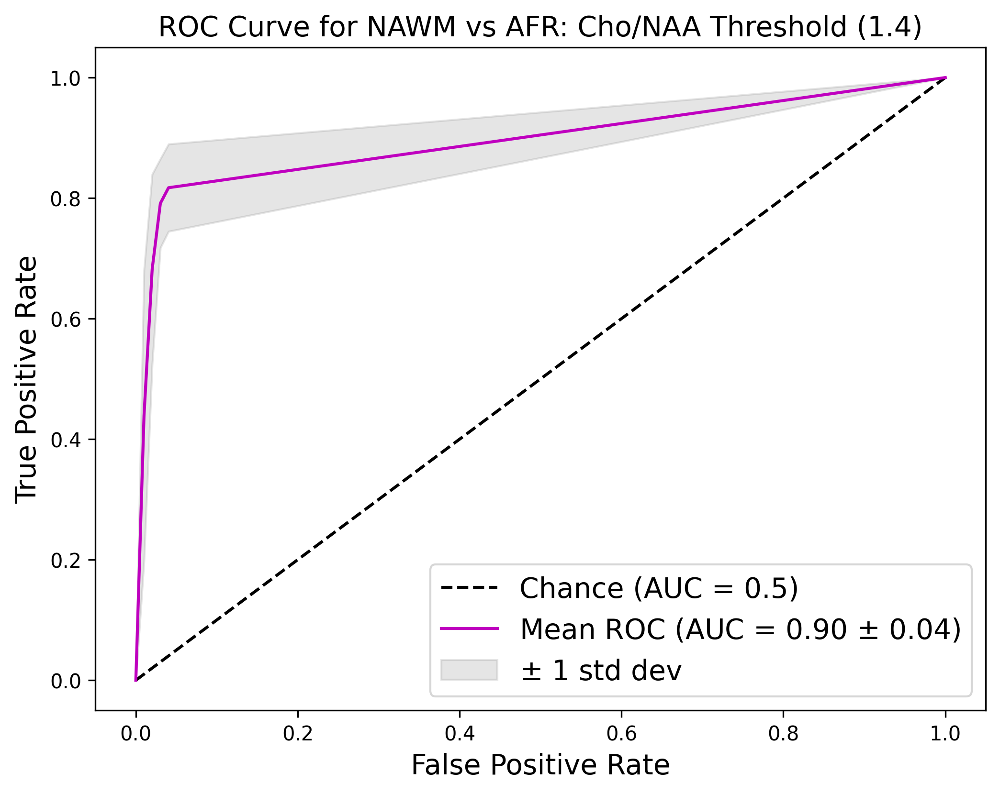

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.model_selection import StratifiedKFold

threshold = 1.6

def cho_naa_model(X):
    # Create the binary predictions based on relCHO/NAA > 1.8
    predictions = np.where(X['relCHO/NAA'] > threshold, 1, 0)
    return predictions

cv = StratifiedKFold(n_splits=5)
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 6), dpi=300)

for fold, (train, test) in enumerate(cv.split(X_smote, y_smote)):
    # Get the binary predictions for the test set using cho_naa_model
    chonaa_model_test = cho_naa_model(X_smote.iloc[test])

    fpr_chonaa, tpr_chonaa, _ = roc_curve(y_smote.iloc[test], chonaa_model_test)
    auc_chonaa = roc_auc_score(y_smote.iloc[test], chonaa_model_test)

    # Append the results to tprs and aucs lists
    tprs.append(np.interp(mean_fpr, fpr_chonaa, tpr_chonaa))
    aucs.append(auc_chonaa)

    # ax.plot(fpr_chonaa, tpr_chonaa, alpha=0.3, label=f'ROC fold {fold} (AUC = {auc_chonaa:.2f})')

ax.plot([0, 1], [0, 1], "k--", label="Chance (AUC = 0.5)")

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = roc_auc_score(y_smote, cho_naa_model(X_smote))
std_auc = np.std(aucs)
ax.plot(
    mean_fpr,
    mean_tpr,
    color="m",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    # lw=2,
    # alpha=0.8,
)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std dev",
)

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
)
font = 14
ax.set_xlabel("False Positive Rate", fontsize=font)
ax.set_ylabel("True Positive Rate", fontsize=font)
ax.set_title(f"ROC Curve for NAWM vs AFR: Cho/NAA Threshold ({threshold})", fontsize=font)

ax.legend(loc=4, prop={'size': font})
plt.show()

# fig.savefig('/content/drive/Shareddrives/MR_Spectroscopy/figures/ROC/FLAIR_Recurrence/logreg_0523.png')
fig.savefig('/content/drive/Shareddrives/MR_Spectroscopy/Shap_wbh_afr/cho_naa_nawm_afr.png')


Validation for Cho/NAA

AUC for BL_053 is: 0.6425619834710744
AUC for BL_088 is: 0.5498188405797101


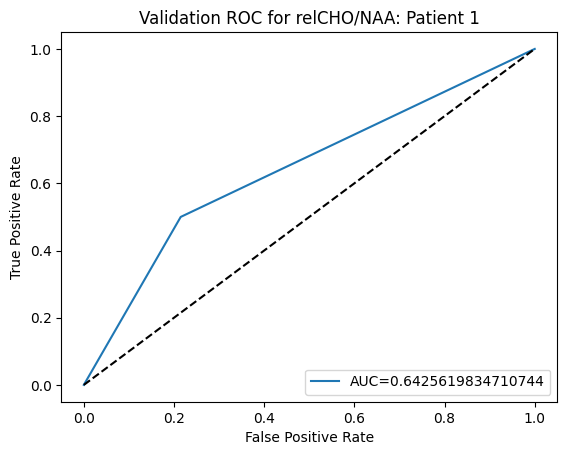

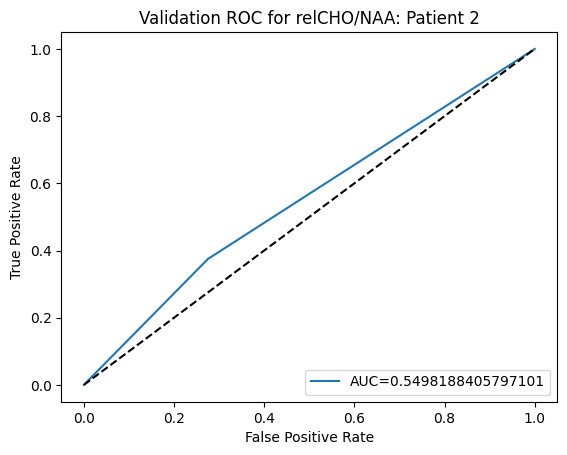

In [ ]:
threshold = 1.6
def cho_naa_model(X):
    # Create the binary predictions based on relCHO/NAA > 1.8
    predictions = np.where(X['relCHO/NAA'] > threshold, 1, 0)
    return predictions

chonaa_53 = cho_naa_model(flair_53_features)
chonaa_88 = cho_naa_model(flair_88_features)


mean_auc_53 = roc_auc_score(flair_53['classifier'], chonaa_53)
mean_auc_88 = roc_auc_score(flair_88['classifier'], chonaa_88)

print('AUC for BL_053 is: ' + str(mean_auc_53))
print('AUC for BL_088 is: ' + str(mean_auc_88))


#AUC Curve Plot #53
fpr_chonaa, tpr_chonaa, _ = metrics.roc_curve(flair_53['classifier'], chonaa_53)
auc_chonaa =  metrics.roc_auc_score(flair_53['classifier'], chonaa_53)
plt.plot(fpr_chonaa, tpr_chonaa, label="AUC="+str(auc_chonaa))
plt.plot([0,1],'k--')
plt.title('Validation ROC for relCHO/NAA: Patient 1')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()


#AUC Curve Plot #88
fpr_chonaa, tpr_chonaa, _ = metrics.roc_curve(flair_88['classifier'], chonaa_88)
auc_chonaa =  metrics.roc_auc_score(flair_88['classifier'], chonaa_88)
plt.plot(fpr_chonaa, tpr_chonaa, label="AUC="+str(auc_chonaa))
plt.plot([0,1],'k--')
plt.title('Validation ROC for relCHO/NAA: Patient 2')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()


cho/naa confusion matrix

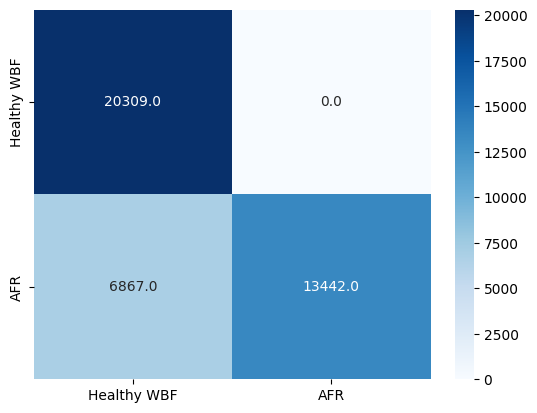

In [ ]:

cm_chonaa = confusion_matrix(y_tres, chonaa_model_test['prediction'])
categories = ['Healthy WBF','AFR']
ax = sns.heatmap(cm_chonaa, annot=True, fmt='.1f',cmap='Blues')
ax.set_xticklabels(categories)
ax.set_yticklabels(categories)
accuracy = (cm_chonaa[0,0] + cm_chonaa[1,1]) / (cm_chonaa[0,0] + cm_chonaa[1,1] + cm_chonaa[0,1] + cm_chonaa[1,0])

### Exporting Data

SHAP

In [ ]:
with pd.ExcelWriter('/content/drive/Shareddrives/MR_Spectroscopy/SHAP_FLAIR_Recurrence_KNN.xlsx') as writer :
  #nb_shap.to_excel(writer, sheet_name = 'Naive Bayes')
  #rf_shap.to_excel(writer, sheet_name = 'Random Forest')
  #dt_shap.to_excel(writer, sheet_name = 'Decision Trees')
  #gbc_shap.to_excel(writer, sheet_name = 'Gradient Boosting')
  knn_shap.to_excel(writer, sheet_name = 'KNN')
  #log_shap.to_excel(writer, sheet_name = 'Logistic')

ROC Raw Value

In [ ]:
with pd.ExcelWriter('/content/drive/Shareddrives/MR_Spectroscopy/ROCs.xlsx') as writer :
  nb_roc_data.to_excel(writer, sheet_name = 'Naive Bayes')
  rf_roc_data.to_excel(writer, sheet_name = 'Random Forest')
  dtree_roc_data.to_excel(writer, sheet_name = 'Decision Trees')
  gbc_roc_data.to_excel(writer, sheet_name = 'Gradient Boosting')
  knn_roc_data.to_excel(writer, sheet_name = 'KNN')
  log_roc_data.to_excel(writer, sheet_name = 'Logistic')

### Figure

In [ ]:
figure = plt.figure(figsize=(8, 6), dpi=300)

#plt.plot(fpr_gbc,tpr_gbc,'y-',lw=2,label="AUC="+str(auc_gbc.round(3)))
#plt.plot(fpr_rf,tpr_rf,'m-',lw=2,label="AUC="+str(auc_rf.round(3)))
#plt.plot(fpr_log,tpr_log,'r-',lw=2,label="AUC="+str(auc_log.round(3)))
plt.plot(fpr_naive,tpr_naive,'b-',lw=2,label="AUC="+str(auc_naive.round(3)))
#plt.plot(fpr_dtree,tpr_dtree,'c-',lw=2,label="AUC="+str(auc_dtree.round(3)))
#plt.plot(fpr_knn,tpr_knn,'g-',lw=2,label="AUC="+str(auc_knn.round(3)))


plt.plot([0,1],'k--')
plt.title('ROC Curve for NPF vs. PF: Naive Bayes')#' + figurename)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4,prop={'size': 16})
plt.show()

#figure.savefig('/content/drive/Shareddrives/MR_Spectroscopy/figures/' + filename + '.png')
figure.savefig('/content/drive/Shareddrives/MR_Spectroscopy/figures/ROC/FLAIR_Recurrence/naive2.png')
#figure.savefig('/content/drive/Shareddrives/MR_Spectroscopy/figures/ROC/NAWM_Recurrence/knn.png')

NameError: ignored

<Figure size 2400x1800 with 0 Axes>

### Cross validation ROC

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
 

mean accuracy: 0.7926574312733291
mean precision: 0.7428955317919831
mean specificity: 0.7428955317919831
mean sensitivity: 0.9105946023027844
mean F1-Score: 0.8165786272059931


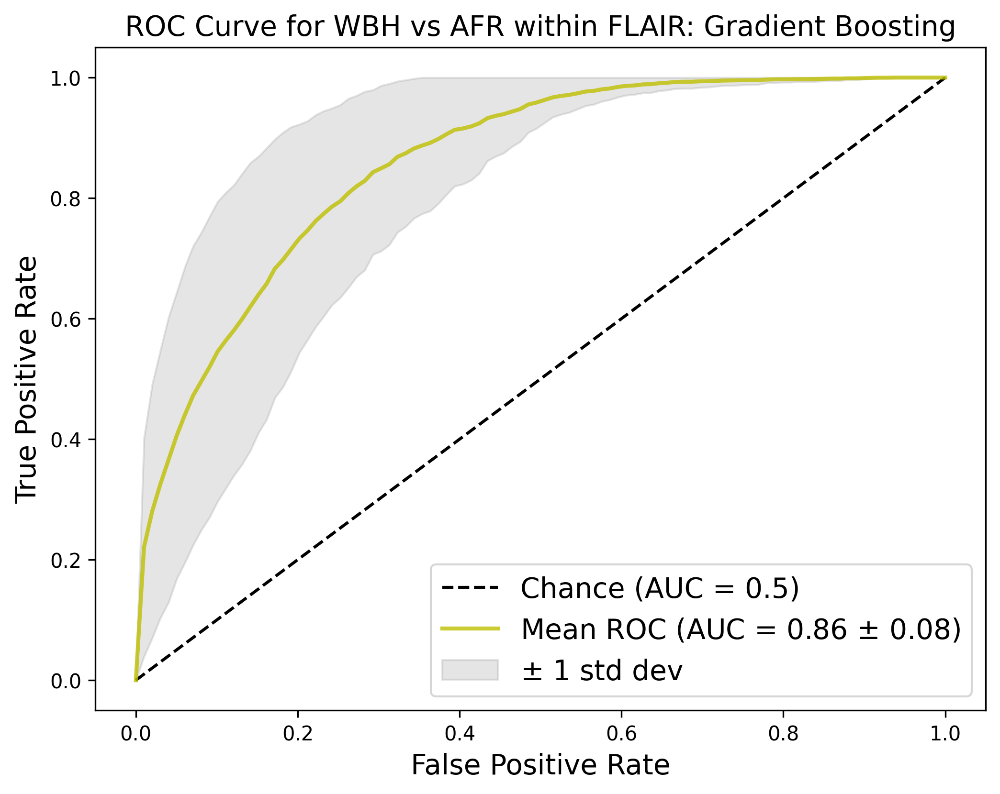

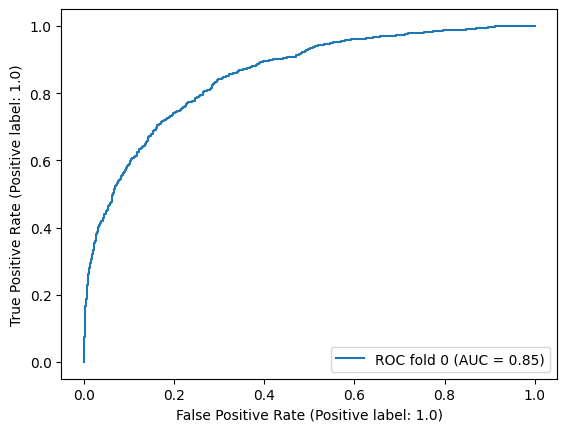

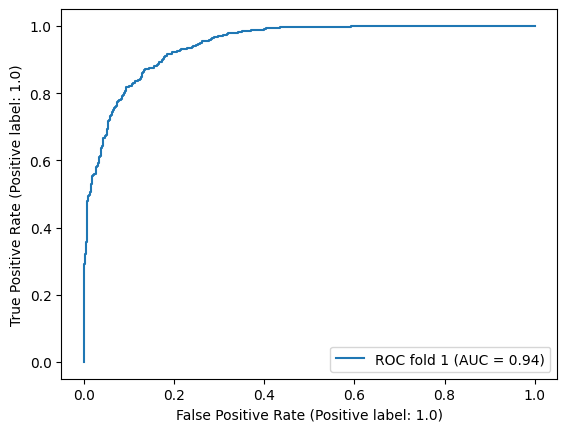

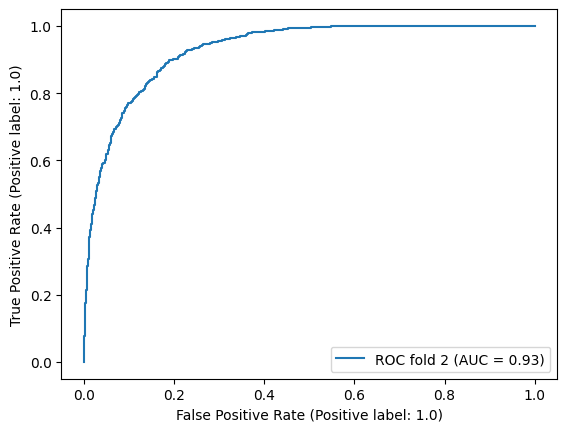

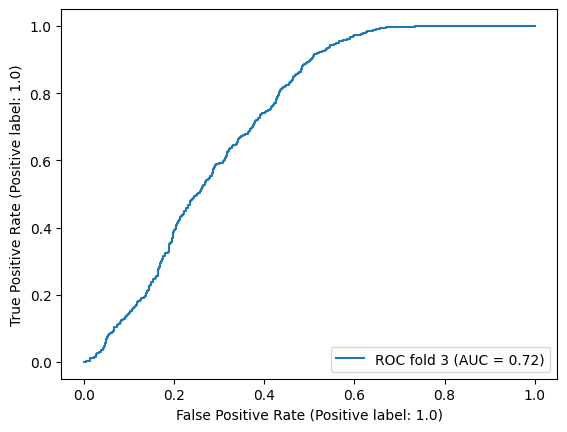

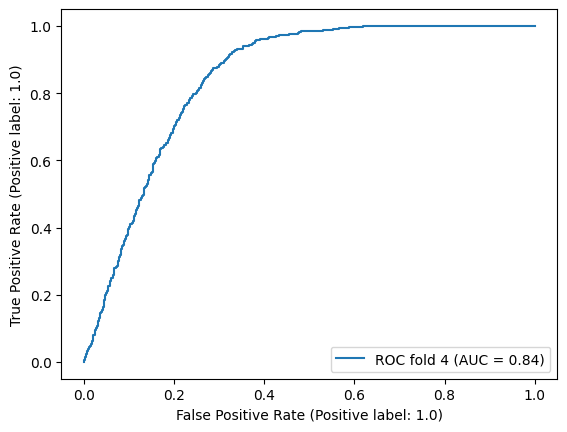

In [ ]:
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.metrics import auc
from sklearn.metrics import RocCurveDisplay
from sklearn.model_selection import StratifiedKFold

cv = StratifiedKFold(n_splits=5)

model = gboost_wbf

# Set Empty Structs for Loops
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

precision = []
specificity = []
sensitivity = []
f1 = []
accuracy = []

fig, ax = plt.subplots(figsize=(8, 6),dpi=300)
for fold, (train, test) in enumerate(cv.split(X_smote, y_smote)):
    model.fit(X_smote.iloc[train], y_smote.iloc[train])

    y_pred = model.predict(X_smote.iloc[test])
    y_true = y_smote.iloc[test]


    precision.append(metrics.precision_recall_fscore_support(y_true, y_pred)[0][1])
    sensitivity.append(metrics.precision_recall_fscore_support(y_true, y_pred)[1][1])
    f1.append(metrics.precision_recall_fscore_support(y_true, y_pred)[2][1])
    accuracy.append(metrics.accuracy_score(y_true, y_pred))
    specificity.append(metrics.precision_recall_fscore_support(y_true, y_pred)[1][0])

    viz = RocCurveDisplay.from_estimator(
        model,
        X_smote.iloc[test],
        y_smote.iloc[test],
        name=f"ROC fold {fold}",
#         alpha=0.3,
#         lw=1,
#         ax=ax,
  )
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)
ax.plot([0, 1], [0, 1], "k--", label="Chance (AUC = 0.5)")

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(
    mean_fpr,
    mean_tpr,
    color="y",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8
)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std dev",
)

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
)
font = 14
ax.set_xlabel("False Positive Rate", fontsize=font)
ax.set_ylabel("True Positive Rate", fontsize=font)
ax.set_title(f"ROC Curve for WBH vs AFR within FLAIR: Gradient Boosting",fontsize=font)

# Calculate Mean Metrics
mean_accuracy = mean(accuracy)
mean_precision = mean(precision)
mean_specificity = mean(specificity)
mean_sensitivity = mean(sensitivity)
mean_f1 = mean(f1)

# Print Mean Metrics
metrics_auc = [mean_accuracy, mean_precision, mean_specificity, mean_sensitivity, mean_f1]
print("mean accuracy: " + str(mean_accuracy))
print("mean precision: " + str(mean_precision))
print("mean specificity: " + str(mean_precision))
print("mean sensitivity: " + str(mean_sensitivity))
print("mean F1-Score: " + str(mean_f1))


ax.legend(loc=4,prop={'size': font})
plt.show()

#fig.savefig('/content/drive/Shareddrives/MR_Spectroscopy/figures/ROC/FLAIR_Recurrence/logreg_0523.png')
fig.savefig('/content/drive/Shareddrives/MR_Spectroscopy/Shap_wbh_afr/WBH_vs_AFR_gboost_FLAIR_Voxels_redo.png')



#Cluster Analysis

####Intro Code

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN

# Assume your data is in a numpy array called 'data' with columns x, y, z, and likelihood
# Filter the data to only include rows where likelihood is greater than 0.5
#data = edema_03[['data_x', 'data_y', 'data_z', 'recurrence']].values

from scipy.spatial import ConvexHull
from matplotlib.animation import FuncAnimation

In [ ]:
# Parameters
threshold = 0.5
min_samples = 1
eps = 3

In [ ]:
# # Create cohort (** load in next pickle **)
wbf = pd.read_csv('/content/drive/Shareddrives/MR_Spectroscopy/big_data_sheets/wbf_bigsheets.csv')
cohort_ids = ('BL_003', 'BL_006', 'BL_009','BL_012','BL_019','BL_022','BL_025','BL_053', 'BL_063','BL_076','BL_078','BL_082','BL_085', 'BL_088', 'BL_092','BL_094')
# wbf_cohort = wbf[wbf.id.isin(cohort_ids)]
wbf_data = wbf[wbf.id.isin(cohort_ids)]


# # Write the variable from the file
# import pickle
# file_name = "/content/drive/Shareddrives/MR_Spectroscopy/wbf_for_clusters.pkl"

# # save
# pickle.dump(wbf_cohort, open(file_name, "wb"))

In [ ]:
import pickle

#downgrade version of pickle
#!pip install "pandas<2.0.0"

#reload the edema pickle
# Load the variable from the file
with open("/content/drive/Shareddrives/MR_Spectroscopy/wbf_for_cluster_backup.pkl", "rb") as f:
    wbf_cohort = pickle.load(f)


####Main Code

#####Old DB

In [ ]:
wbf_cohort
wbf_cohort.feature_names_in_

array(['Glx._Sm', 'myo-Inositol_Sm', 'relNAA/CR', 'relCHO/CR',
       'relCHO/NAA'], dtype=object)

BL_088
i =  1


<ipython-input-136-07be2bf0984a>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['recurrence'] = wbf_cohort.predict_proba(data_features)[:,1]
<ipython-input-136-07be2bf0984a>:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[data['recurrence'] > threshold, 'cluster'] = dbscan.labels_


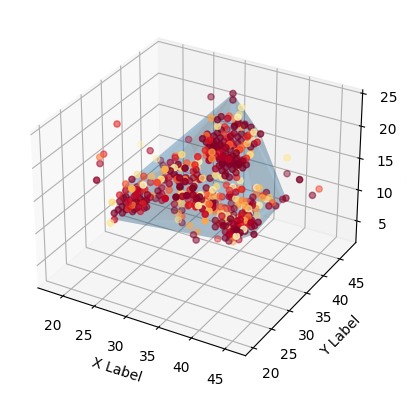

sample size is:1


<ipython-input-136-07be2bf0984a>:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['classifier_cluster'] = data['data_xyz'].apply(lambda x: 1 if eval(x) in cluster_points  else 0)


In [ ]:
# Start Sample Size N count at 0
n=0
count=0

# Create new structure of all edema data
wbf_clusters = pd.DataFrame()

# Loop over each edema patient for this analysis

# for id in wbf_cohort.id.unique():
for id in wbf_data.id.unique():

  if id != 'BL_088':
    continue

  print(id)
  count = count + 1
  print('i = ', str(count))
  # Load your data into a pandas DataFrame

  #data = wbf_cohort[wbf_cohort.id == id]
  data = wbf_data[wbf_data.id == id]

  # Skip patient if not enough data    *mainly for Edema, everyone qualifies with whole-brain*
  if len(data) < 200:
    continue

  # Isolate relevant columns
  data_features = data[cols]

  # Run data through model
  # data['recurrence'] = gboost_wbf.predict_proba(data_features)[:,1]
  data['recurrence'] = wbf_cohort.predict_proba(data_features)[:,1]


  #threshold = 0.70  #0.464

  # Filter the data to include only high recurrence values
  high_recurrence = data.loc[data['recurrence'] > threshold, ['data_x', 'data_y', 'data_z']]

  # Apply the DBSCAN algorithm
  dbscan = DBSCAN(min_samples=min_samples, eps=eps).fit(high_recurrence)




  # Visualize the resulting clusters in 3D space
  fig = plt.figure()
  ax = fig.add_subplot(111, projection='3d')

  def animate(i):
      ax.view_init(elev=30, azim=i)
      return fig,
  animation = FuncAnimation(fig, animate, frames=np.arange(0, 360, 2), interval=50)


  # Add cluster labels to the original DataFrame
  data.loc[data['recurrence'] > threshold, 'cluster'] = dbscan.labels_



  # Plot all the original data points
  cmap = plt.get_cmap('YlOrRd')
  #ax.scatter(data['data_x'], data['data_y'], data['data_z'], c=data['recurrence'], cmap=cmap)
  data_filter = data[data['recurrence'] > 0.35]
  ax.scatter(data_filter['data_x'], data_filter['data_y'], data_filter['data_z'], c=data_filter['recurrence'], cmap=cmap)


  # Plot the identified cluster with a wireframe
  try:
    cluster_mask = data['cluster'] == np.argmax(np.bincount(dbscan.labels_))
    cluster_points = high_recurrence.loc[cluster_mask].values
    hull = ConvexHull(cluster_points)
    ax.plot_trisurf(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], triangles=hull.simplices, alpha=0.2)

    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    plt.show()


    plt.close()  # prevent duplicate display of the animation
    animation

    #update sample size
    n = n + 1


    # Replace brackets with parenthesis
    cluster_points = [tuple(point) for point in cluster_points]
    data['classifier_cluster'] = data['data_xyz'].apply(lambda x: 1 if eval(x) in cluster_points  else 0)
    #wbf_clusters = wbf_clusters.append(data, ignore_index=True)
    wbf_clusters = pd.concat([wbf_clusters, data], ignore_index=True)



  except ValueError as e:
    print("Skipping iteration due to error:", e)
    continue


  ax.scatter(data['data_x'], data['data_y'], data['data_z'], c=data['recurrence'], cmap=cmap)
print('sample size is:' + str(n))


#####New DB

In [ ]:
# Parameters
threshold = 0.9
min_samples = 2
eps = 1

cols = ['Glx._Sm', 'myo-Inositol_Sm', 'relNAA/CR', 'relCHO/CR', 'relCHO/NAA']

# Format image sizes
x_min = 13
x_max = 49
y_max = 54
y_min = 10

BL_003
BL_006
BL_009
BL_012
BL_019
BL_022
BL_025
BL_053
BL_063
BL_076
BL_078
BL_082
BL_085
BL_088
i =  1


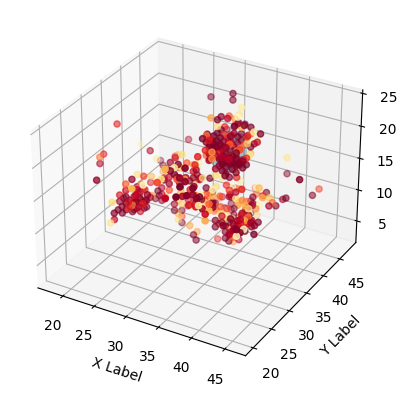

BL_092
BL_094
sample size is:1


In [ ]:
#DBSCAN

# Start Sample Size N count at 0
n=0
count=0

# Create new structure of all edema data
wbf_clusters = pd.DataFrame()

# Loop over each edema patient for this analysis
# for id in wbf_cohort.id.unique():
for id in wbf_data.id.unique():
  print(id)
  if id != 'BL_088':
    continue

  count = count + 1
  print('i = ', str(count))
  # Load your data into a pandas DataFrame

  #data = wbf_cohort[wbf_cohort.id == id]
  data = wbf_data[wbf_data.id == id].copy()

  # Skip patient if not enough data    *mainly for Edema, everyone qualifies with whole-brain*
  if len(data) < 200:
    continue

  # Isolate relevant columns
  data_features = data[cols]

  # Run data through model
  # data['recurrence'] = gboost_wbf.predict_proba(data_features)[:,1]

  #data['recurrence'] = wbf_cohort.predict_proba(data_features)[:,1]
  data.loc[:, 'recurrence'] = wbf_cohort.predict_proba(data_features)[:, 1]


  # Filter the data to include only high recurrence values
  high_recurrence = data.loc[data['recurrence'] > threshold, ['data_x', 'data_y', 'data_z']]

  # Apply the DBSCAN algorithm
  dbscan = DBSCAN(min_samples=min_samples, eps=eps).fit(high_recurrence)
  data.loc[data['recurrence'] > threshold, 'cluster'] = dbscan.labels_
  # Identify the largest cluster (excluding noise points)
  valid_labels = dbscan.labels_[dbscan.labels_ >= 0]  # Only non-noise points

  if len(valid_labels) == 0:
      print(f"No valid clusters found for {id}")
      hull_points = np.empty((0, 3))
      data['classifier_cluster'] = 0
      cluster_points = [tuple(point) for point in hull_points]
      data['classifier_cluster'] = data['data_xyz'].apply(lambda x: 1 if eval(x) in cluster_points else 0)
      wbf_clusters = pd.concat([wbf_clusters, data], ignore_index=True)
      continue
  else:
      largest_cluster_label = np.argmax(np.bincount(valid_labels))
    # Create a mask for the largest cluster, including noise points but without disrupting your flow
      cluster_mask = (data['cluster'] == largest_cluster_label) | (data['cluster'] == -1)  # Include noise
    # Filter points only for the convex hull (exclude noise for convex hull construction)
      hull_points = high_recurrence.loc[data['cluster'] == largest_cluster_label].values
    # Replace brackets with parentheses for classifier_cluster logic
      cluster_points = [tuple(point) for point in hull_points]
      data['classifier_cluster'] = data['data_xyz'].apply(lambda x: 1 if eval(x) in cluster_points else 0)
    # Append the processed data to the final DataFrame
      wbf_clusters = pd.concat([wbf_clusters, data], ignore_index=True)
    # Update sample size
      n += 1

    # Plot the cluster and noise points in 3D space
      def animate(i):
          ax.view_init(elev=30, azim=i)
          return fig,
      fig = plt.figure()
      animation = FuncAnimation(fig, animate, frames=np.arange(0, 360, 2), interval=50)
      ax = fig.add_subplot(111, projection='3d')

      cmap = plt.get_cmap('YlOrRd')
      data_filter = data[data['recurrence'] > 0.35]
      ax.scatter(data_filter['data_x'], data_filter['data_y'], data_filter['data_z'], c=data_filter['recurrence'], cmap=cmap)


    # Create the convex hull only for the largest cluster
  try:
      hull = ConvexHull(hull_points)
      ax.plot_trisurf(hull_points[:, 0], hull_points[:, 1], hull_points[:, 2],
                      triangles=hull.simplices, alpha=0.2)
      # Set plot labels
      ax.set_xlabel('X Label')
      ax.set_ylabel('Y Label')
      ax.set_zlabel('Z Label')
      plt.show()
      plt.close()  # Prevent duplicate display of the animation
  except ValueError as e:
      print(f"Skipping convex hull due to insufficient points: {e}")

print('sample size is:' + str(n))

####Analysis (To Be Updated)

In [ ]:
#merge ed_corr + ed_corr_z_cl
#............................so that we can match exact feature rows with our official classifier from PR/NPR
wbf_full = pd.concat([features, classifier], axis=1)


merged_wbf = wbf_clusters.merge(wbf_full, how='left', on=['Glx._Sm', 'myo-Inositol_Sm', 'relNAA/CR', 'relCHO/NAA', 'relCHO/CR'])


merged_wbf['classifier'] = merged_wbf[0]
cols_to_drop = ['cluster', 0]
merged_wbf = merged_wbf.drop(cols_to_drop, axis=1)
merged_wbf.dropna(subset=['classifier'], inplace=True)

In [ ]:
from sklearn.metrics import f1_score
precision_cluster = metrics.precision_recall_fscore_support(merged_wbf['classifier'].values, merged_wbf['classifier_cluster'].values)[0][1]
specificity_cluster = metrics.precision_recall_fscore_support(merged_wbf['classifier'].values, merged_wbf['classifier_cluster'].values)[1][0]
sensitivity_cluster = metrics.precision_recall_fscore_support(merged_wbf['classifier'].values, merged_wbf['classifier_cluster'].values)[1][1]
accuracy_cluster = accuracy_score(merged_wbf['classifier'].values, merged_wbf['classifier_cluster'].values)
f1_cluster = f1_score(merged_wbf['classifier'].values, merged_wbf['classifier_cluster'].values)

metrics_cluster = pd.DataFrame([accuracy_cluster,precision_cluster,specificity_cluster,sensitivity_cluster, f1_cluster])
metrics_cluster



,0
0,0.995741
1,0.946407
2,0.998671
3,0.885258
4,0.914812


[Text(0, 0.5, 'Healthy'), Text(0, 1.5, 'Recurrence')]

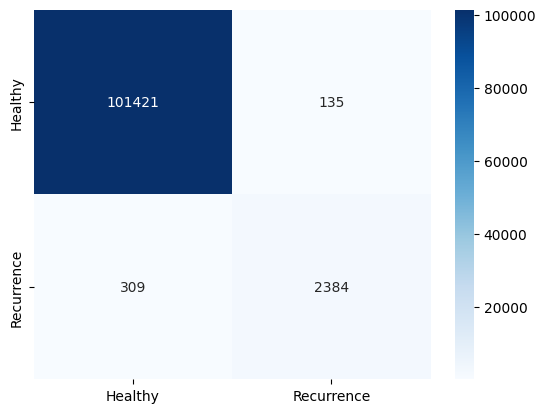

In [ ]:
cm_cluster = confusion_matrix(merged_wbf['classifier'].values, merged_wbf['classifier_cluster'].values)

categories = ['Healthy','Recurrence']
ax = sns.heatmap(cm_cluster, annot=True,fmt='d',cmap='Blues')
ax.set_xticklabels(categories)
ax.set_yticklabels(categories)

In [ ]:
true_labels = merged_wbf['classifier'].values
predicted_probabilities = merged_wbf['classifier_cluster'].values

from sklearn.metrics import precision_recall_curve, auc
precision, recall, _ = precision_recall_curve(true_labels, predicted_probabilities)
auc_score = auc(recall, precision)
print('Precision:', precision)
print('Recall:', recall)
print('AUC:', auc_score)

Precision: [0.02583238 0.9464073  1.        ]
Recall: [1.         0.88525808 0.        ]
AUC: 0.9173147190948524


accuracy:  0.9957409663402047
precision:  0.9464073044859072
recall:  0.8852580764946156
f1:  0.9148119723714504
area under curve (auc):  0.9419643803245854


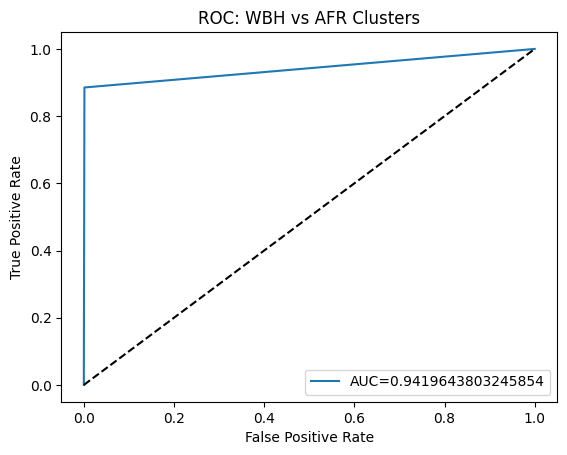

In [ ]:
#AUC: Clusters
print("accuracy: ", metrics.accuracy_score(true_labels, predicted_probabilities))
print("precision: ", metrics.precision_score(true_labels, predicted_probabilities))
print("recall: ", metrics.recall_score(true_labels, predicted_probabilities))
print("f1: ", metrics.f1_score(true_labels, predicted_probabilities))
print("area under curve (auc): ", metrics.roc_auc_score(true_labels, predicted_probabilities))

fpr_gbc, tpr_gbc, _ = roc_curve(true_labels, predicted_probabilities)

auc_gbc =  metrics.roc_auc_score(true_labels, predicted_probabilities)

plt.plot(fpr_gbc,tpr_gbc,label="AUC="+str(auc_gbc))
plt.plot([0,1],'k--')
plt.title('ROC: WBH vs AFR Clusters')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

## Optimized Code

In [ ]:
#DBSCAN

# Start Sample Size N count at 0
n=0
count=0

# Create new structure of all edema data
wbf_clusters = pd.DataFrame()

# Loop over each edema patient for this analysis
# for id in wbf_cohort.id.unique():
for id in wbf_data.id.unique():
  print(id)
  count = count + 1
  print('i = ', str(count))
  # Load your data into a pandas DataFrame

  #data = wbf_cohort[wbf_cohort.id == id]
  data = wbf_data[wbf_data.id == id].copy()

  # Skip patient if not enough data    *mainly for Edema, everyone qualifies with whole-brain*
  if len(data) < 200:
    continue

  # Isolate relevant columns
  data_features = data[cols]

  # Run data through model
  # data['recurrence'] = gboost_wbf.predict_proba(data_features)[:,1]

  #data['recurrence'] = wbf_cohort.predict_proba(data_features)[:,1]
  data.loc[:, 'recurrence'] = wbf_cohort.predict_proba(data_features)[:, 1]


  # Filter the data to include only high recurrence values
  high_recurrence = data.loc[data['recurrence'] > threshold, ['data_x', 'data_y', 'data_z']]

  # Apply the DBSCAN algorithm
  dbscan = DBSCAN(min_samples=min_samples, eps=eps).fit(high_recurrence)
  data.loc[data['recurrence'] > threshold, 'cluster'] = dbscan.labels_
  # Identify the largest cluster (excluding noise points)
  valid_labels = dbscan.labels_[dbscan.labels_ >= 0]  # Only non-noise points

  if len(valid_labels) == 0:
      print(f"No valid clusters found for {id}")
      hull_points = np.empty((0, 3))
      data['classifier_cluster'] = 0
      cluster_points = [tuple(point) for point in hull_points]
      data['classifier_cluster'] = data['data_xyz'].apply(lambda x: 1 if eval(x) in cluster_points else 0)
      wbf_clusters = pd.concat([wbf_clusters, data], ignore_index=True)
      continue
  else:
      largest_cluster_label = np.argmax(np.bincount(valid_labels))
    # Create a mask for the largest cluster, including noise points but without disrupting your flow
      cluster_mask = (data['cluster'] == largest_cluster_label) | (data['cluster'] == -1)  # Include noise
    # Filter points only for the convex hull (exclude noise for convex hull construction)
      hull_points = high_recurrence.loc[data['cluster'] == largest_cluster_label].values
    # Replace brackets with parentheses for classifier_cluster logic
      cluster_points = [tuple(point) for point in hull_points]
      data['classifier_cluster'] = data['data_xyz'].apply(lambda x: 1 if eval(x) in cluster_points else 0)
    # Append the processed data to the final DataFrame
      wbf_clusters = pd.concat([wbf_clusters, data], ignore_index=True)
    # Update sample size
      n += 1

    # Plot the cluster and noise points in 3D space
      def animate(i):
          ax.view_init(elev=30, azim=i)
          return fig,
      animation = FuncAnimation(fig, animate, frames=np.arange(0, 360, 2), interval=50)
      fig = plt.figure()
      ax = fig.add_subplot(111, projection='3d')

      cmap = plt.get_cmap('YlOrRd')
      data_filter = data[data['recurrence'] > 0.35]
      ax.scatter(data_filter['data_x'], data_filter['data_y'], data_filter['data_z'], c=data_filter['recurrence'], cmap=cmap)


    # Create the convex hull only for the largest cluster
  try:
      hull = ConvexHull(hull_points)
      ax.plot_trisurf(hull_points[:, 0], hull_points[:, 1], hull_points[:, 2],
                      triangles=hull.simplices, alpha=0.2)
      # Set plot labels
      ax.set_xlabel('X Label')
      ax.set_ylabel('Y Label')
      ax.set_zlabel('Z Label')
      plt.show()
      plt.close()  # Prevent duplicate display of the animation
  except ValueError as e:
      print(f"Skipping convex hull due to insufficient points: {e}")

print('sample size is:' + str(n))

In [ ]:
#KMEANS


from sklearn.cluster import KMeans

threshold = 0.9
# Start Sample Size N count at 0
n=0
count=0

# Create new structure of all edema data
wbf_clusters2 = pd.DataFrame()

# Loop over each edema patient for this analysis
# for id in wbf_cohort.id.unique():
for id in wbf_data.id.unique():
  print(id)
  count = count + 1
  print('i = ', str(count))
  # Load your data into a pandas DataFrame

  #data = wbf_cohort[wbf_cohort.id == id]
  data = wbf_data[wbf_data.id == id].copy()

  # Skip patient if not enough data    *mainly for Edema, everyone qualifies with whole-brain*
  if len(data) < 200:
    continue

  # Isolate relevant columns
  data_features = data[cols]
  #data['recurrence'] = wbf_cohort.predict_proba(data_features)[:,1]
  data.loc[:, 'recurrence'] = wbf_cohort.predict_proba(data_features)[:, 1]
  # Filter the data to include only high recurrence values
  high_recurrence = data.loc[data['recurrence'] > threshold, ['data_x', 'data_y', 'data_z']]

  # Apply the DBSCAN algorithm
  kmeans = KMeans(n_clusters=2, n_init = 'auto',random_state=42).fit(high_recurrence)
  data.loc[data['recurrence'] > threshold, 'cluster'] = kmeans.labels_

  # Identify the largest cluster (excluding noise points)
  valid_labels = kmeans.labels_[kmeans.labels_ >= 0]  # Only non-noise points
  largest_cluster_label = np.argmax(np.bincount(valid_labels))
  # Create a mask for the largest cluster, including noise points but without disrupting your flow
  cluster_mask = (data['cluster'] == largest_cluster_label) | (data['cluster'] == -1)  # Include noise
  # Filter points only for the convex hull (exclude noise for convex hull construction)
  hull_points = high_recurrence.loc[data['cluster'] == largest_cluster_label].values
  # Plot the cluster and noise points in 3D space

  def animate(i):
      ax.view_init(elev=30, azim=i)
      return fig,
  fig = plt.figure()
  animation = FuncAnimation(fig, animate, frames=np.arange(0, 360, 2), interval=50)
  ax = fig.add_subplot(111, projection='3d')
  cmap = plt.get_cmap('YlOrRd')
  data_filter = data[data['recurrence'] > 0.35]
  ax.scatter(data_filter['data_x'], data_filter['data_y'], data_filter['data_z'], c=data_filter['recurrence'], cmap=cmap)

  # Create the convex hull only for the largest cluster
  try:
      hull = ConvexHull(hull_points)
      ax.plot_trisurf(hull_points[:, 0], hull_points[:, 1], hull_points[:, 2],
                      triangles=hull.simplices, alpha=0.2)
  except ValueError as e:
      print(f"Skipping convex hull due to insufficient points: {e}")

  # Set plot labels
  ax.set_xlabel('X Label')
  ax.set_ylabel('Y Label')
  ax.set_zlabel('Z Label')
  plt.show()
  plt.close()  # Prevent duplicate display of the animation

  # Update sample size
  n += 1

  # Replace brackets with parentheses for classifier_cluster logic
  cluster_points = [tuple(point) for point in hull_points]
  data['classifier_cluster'] = data['data_xyz'].apply(lambda x: 1 if eval(x) in cluster_points else 0)

  # Append the processed data to the final DataFrame
  wbf_clusters2 = pd.concat([wbf_clusters2, data], ignore_index=True)

print('sample size is:' + str(n))

Visualizing MRI data

In [ ]:
#BL_022 T1+CE Baseline
!pip install pydicom
import pydicom
dicom_dir = "/content/drive/Shareddrives/MR_Spectroscopy/Clusters/BL_022/Baseline MRI/T1_CE"

# Function to load DICOM slices
def load_dicom_slices(dicom_dir):
    slices = []
    for filename in os.listdir(dicom_dir):
        if filename.endswith(".dcm"):
            filepath = os.path.join(dicom_dir, filename)
            dicom_slice = pydicom.dcmread(filepath)
            slices.append(dicom_slice)
    return slices

# Load the DICOM slices
dicom_slices = load_dicom_slices(dicom_dir)

Match Z Slice to MRI Slice

In [ ]:
# def match_slices(dicom_slices, data):
#     matched_slices = []

#     # Create a mapping of z values to DICOM slices
#     z_to_dicom = {}
#     for dicom_slice in dicom_slices:
#         z_val = dicom_slice.SliceLocation  # Adjust as necessary for your DICOM metadata
#         if z_val not in z_to_dicom:
#             z_to_dicom[z_val] = []
#         z_to_dicom[z_val].append(dicom_slice)

#     # For each unique z value in your data, find the corresponding DICOM slice(s)
#     for z in data['data_z'].unique():
#         if z in z_to_dicom:
#             matched_slices.append(z_to_dicom[z])  # Append a list of matched slices
#         else:
#             matched_slices.append([])  # No match found, append an empty list

#     return matched_slices

# matched_slices = match_slices(dicom_slices, data)

In [ ]:
import pandas as pd
import numpy as np

# Sample data for DICOM slices and unique z values
dicom_slices = [f"Slice_{i+1}" for i in range(28)]  # Placeholder for DICOM slices
unique_z_values = np.unique(data['data_z'])  # Assuming you have this array from your data

num_dicom_slices = len(dicom_slices)  # Should be 28
num_z_slices = len(unique_z_values)  # Should be 24

# Calculate the ratio
ratio = num_dicom_slices / num_z_slices  # This is 1.16 in your case

# Calculate how many slices to assign to each z slice
slices_per_z = int(np.round(ratio))  # Round to nearest integer

# Create an empty list to store the mapping
slice_mapping = []

# Distribute the slices based on the rounded count
dicom_index = 0

# Create a mapping from MRI slices to their corresponding z values
for z in range(0,num_dicom_slices):
  slice_mapping.append(['mri_slice:', z+1, 'z_slice:', int(z/ratio)+1])


# Convert the mapping to a DataFrame
mapping_df = pd.DataFrame(slice_mapping)

# Display the DataFrame
print(mapping_df)


Index: 0, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.990.90.dcm
Index: 1, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.977.72.dcm
Index: 2, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.989.84.dcm
Index: 3, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.977.71.dcm
Index: 4, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.990.88.dcm
Index: 5, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.978.74.dcm
Index: 6, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.990.87.dcm
Index: 7, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.978.75.dcm
Index: 8, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.985.79.dcm
Index: 9, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.977.65.dcm
Index: 10, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.990.89.dcm
Index: 11, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.978.73.dcm
Index: 12, Fil

<ipython-input-29-f2550421a521>:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


Index: 22, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.986.82.dcm
Index: 23, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.977.66.dcm
Index: 24, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.985.78.dcm
Index: 25, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.977.68.dcm
Index: 26, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.985.81.dcm
Index: 27, Filename: 2.16.840.1.114362.1.12114306.24739667182.677984579.977.69.dcm


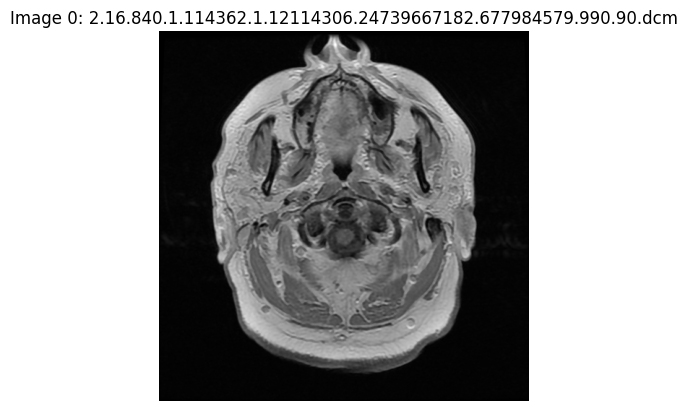

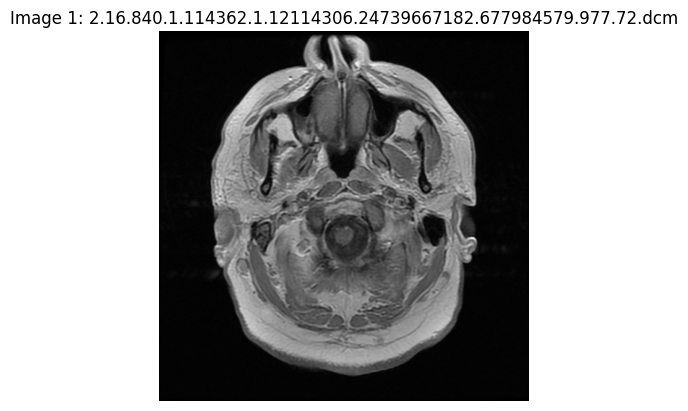

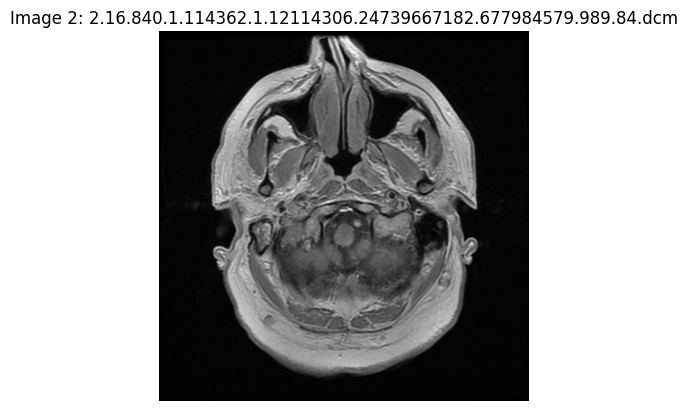

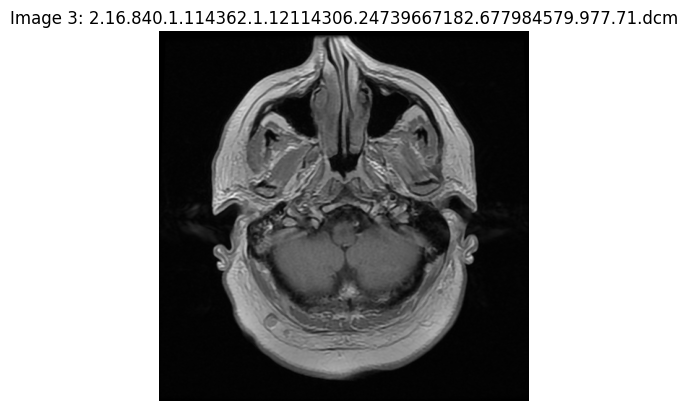

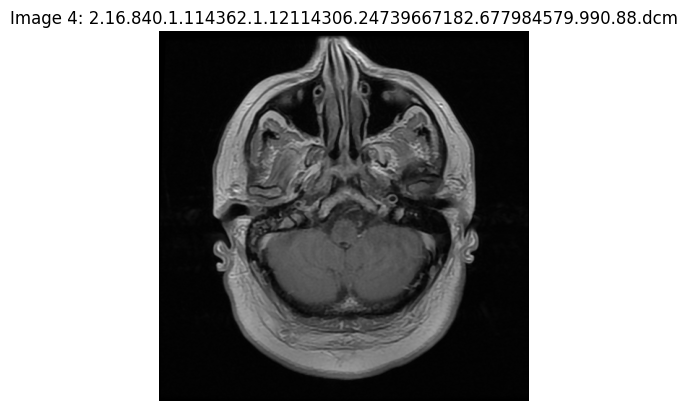

...

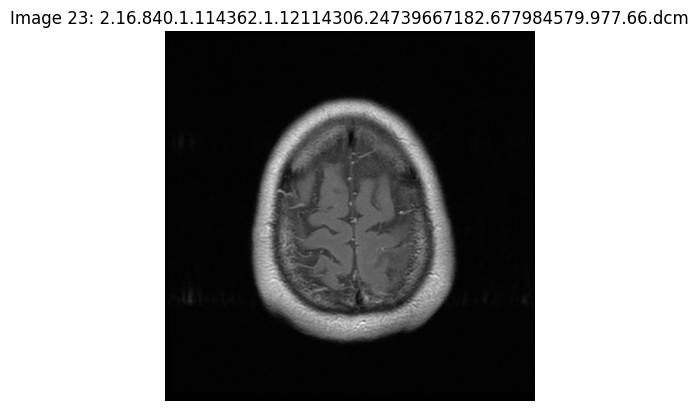

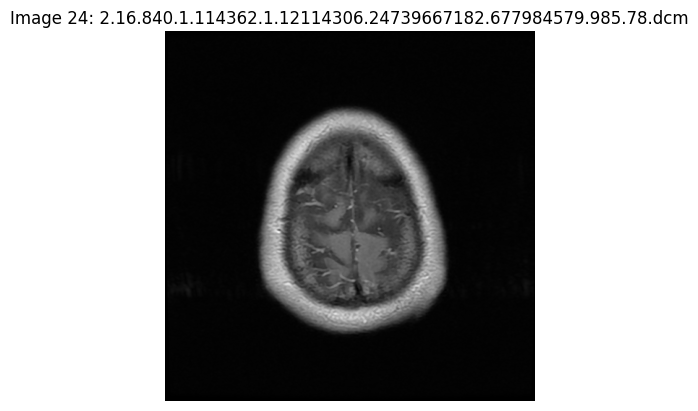

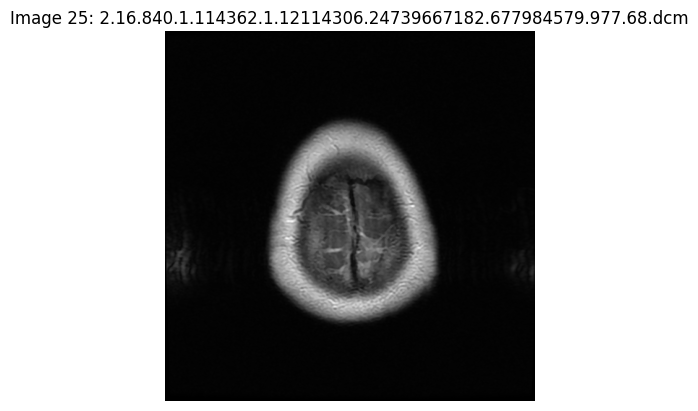

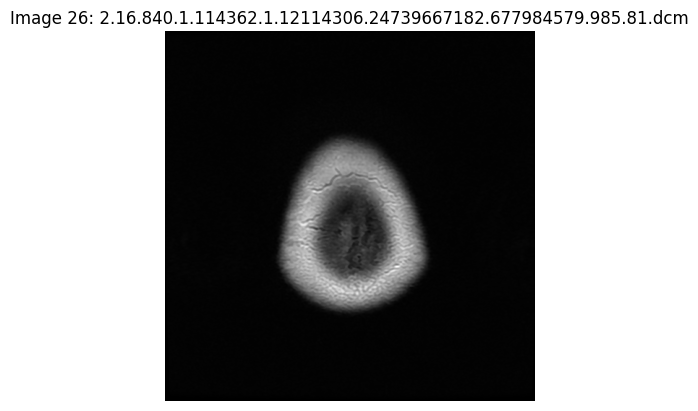

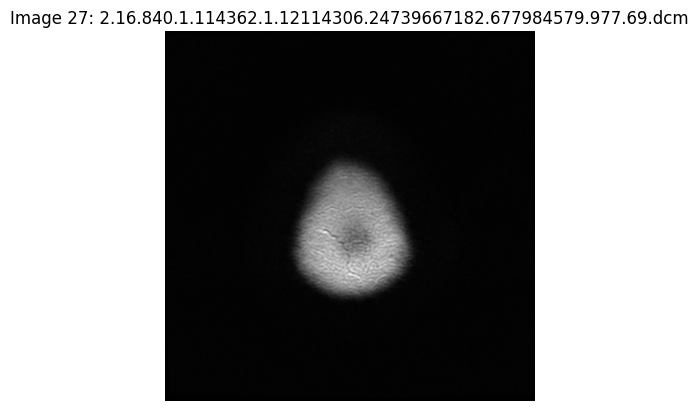

In [ ]:
'''
DEBUG
To make sure the MRI's are in the correct sorted order
If out of order, use this. Otherwise, leave commented out
'''
#!pip install pydicom

import os
import pydicom
import matplotlib.pyplot as plt


# Load DICOM slices from the specified folder
def load_dicom_slices(dicom_dir):
    slices = []
    for filename in os.listdir(dicom_dir):
        if filename.endswith(".dcm"):
            filepath = os.path.join(dicom_dir, filename)
            dicom_slice = pydicom.dcmread(filepath)
            dicom_slice.filename = filename  # Store the filename for reference
            slices.append(dicom_slice)

    # Sort slices based on Slice Location or Instance Number
    # Uncomment one of the following lines based on your preference

    # Sort by Slice Location (0020, 1041)
    slices.sort(key=lambda x: getattr(x, 'SliceLocation', float('inf')))

    # Or, sort by Instance Number (0020, 0013)
    # slices.sort(key=lambda x: getattr(x, 'InstanceNumber', float('inf')))

    return slices

# Specify the directory containing DICOM slices
dicom_dir = "/content/drive/Shareddrives/MR_Spectroscopy/Clusters/BL_022/Baseline MRI/T1_CE"
dicom_slices = load_dicom_slices(dicom_dir)



# Loop through the DICOM slices and display each image
for index, dicom_slice in enumerate(dicom_slices):
    # Print the filename and the index for debugging
    print(f"Index: {index}, Filename: {dicom_slice.filename}")

    # Display the image
    plt.figure()
    plt.imshow(dicom_slice.pixel_array, cmap='gray')
    plt.title(f"Image {index}: {dicom_slice.filename}")
    plt.axis('off')  # Hide axis

# Show all images at once
plt.show()


**2D** DBSCAN *Updated 10/24*

In [ ]:
# # Function to plot the 2D contour of the ConvexHull at a specific z slice
# def plot_2d_contour_for_z_slice(cluster_points_np, hull, z_val, data, x_min, x_max, y_min, y_max, matched_dicom_slice):
#     """
#     Plot the 2D contour of the ConvexHull at a specific z slice and include the voxel predictions as background.
#     Ensures the plot uses the same x and y limits for all slices.
#     """
#     slice_lines = []  # Store intersecting points
#     intersection_points = []  # Collect all intersection points

#     # Loop through each triangle (facet) in the hull
#     for simplex in hull.simplices:
#         points = cluster_points_np[simplex]
#         z_coords = points[:, 2]

#         # Check if this facet intersects the z slice
#         if np.min(z_coords) <= z_val <= np.max(z_coords):
#             # Find the intersection points of the facet edges with the z slice
#             intersections = []
#             for i in range(3):
#                 p1, p2 = points[i], points[(i + 1) % 3]
#                 z1, z2 = p1[2], p2[2]
#                 if (z1 <= z_val <= z2) or (z2 <= z_val <= z1):
#                     # Linear interpolation to find intersection
#                     t = (z_val - z1) / (z2 - z1)
#                     x = p1[0] + t * (p2[0] - p1[0])
#                     y = p1[1] + t * (p2[1] - p1[1])
#                     intersections.append((x, y))
#             if len(intersections) == 2:
#                 intersection_points.extend(intersections)
#           print(f"Z value: {z_val}, Found {len(intersection_points)} intersection points")


#     # Extend the x_lim/y_lim to fit the MRI
#     x_min_updated = x_min - 12
#     x_max_updated = x_max + 12
#     y_min_updated = y_min - 8
#     y_max_updated = y_max + 8

#     # Create a closed shape if there are intersection points
#     if intersection_points:
#         # Ensure points are unique
#         intersection_points = list(set(intersection_points))
#         intersection_points = np.array(intersection_points)

#         # Sort the points to create a closed shape (polygon)
#         centroid = np.mean(intersection_points, axis=0)
#         sorted_points = intersection_points[np.argsort(np.arctan2(intersection_points[:, 1] - centroid[1],
#                                                                   intersection_points[:, 0] - centroid[0]))]
#         print("length of cluster: " + str(len(sorted_points)))
#         # Plot the MRI slice image
#         plt.figure()
#         plt.imshow(matched_dicom_slice.pixel_array, cmap='gray', extent=[x_min_updated, x_max_updated, y_min_updated, y_max_updated], alpha=0.9)

#         # Plot the original voxel data points for the current z slice
#         plt.scatter(data_2d['data_x'], data_2d['data_y'], c=data_2d['recurrence'], cmap='YlOrRd', alpha=0.2)

#         # Plot the closed shape from the intersection points
#         plt.fill(*zip(*sorted_points), color='blue', alpha=0.7)  # Fill the polygon

#         ###*requires this be used with "mri_num" for MRI slice###
#         plt.title(f"2D Contour at MRI Slice {mri_num+1}")
#         plt.xlabel('X Coordinate')
#         plt.ylabel('Y Coordinate')
#         plt.axis('off')
#         plt.grid(False)

#         # Set consistent limits
#         plt.xlim(x_min_updated, x_max_updated)
#         plt.ylim(y_min_updated, y_max_updated)

#         plt.grid(True)
#         plt.show()

# # Load DICOM slices from the specified folder
# def load_dicom_slices(dicom_dir):
#     slices = []
#     for filename in os.listdir(dicom_dir):
#         if filename.endswith(".dcm"):
#             filepath = os.path.join(dicom_dir, filename)
#             dicom_slice = pydicom.dcmread(filepath)
#             dicom_slice.filename = filename  # Store the filename for reference
#             slices.append(dicom_slice)

#     # Sort slices based on Slice Location or Instance Number
#     # Uncomment one of the following lines based on your preference

#     # Sort by Slice Location (0020, 1041)
#     slices.sort(key=lambda x: getattr(x, 'SliceLocation', float('inf')))

#     # Or, sort by Instance Number (0020, 0013)
#     # slices.sort(key=lambda x: getattr(x, 'InstanceNumber', float('inf')))

#     return slices

# # Specify the directory containing DICOM slices
# dicom_dir = "/content/drive/Shareddrives/MR_Spectroscopy/Clusters/BL_022/Baseline MRI/T1_CE"
# dicom_slices = load_dicom_slices(dicom_dir)

# # Convert cluster points to a NumPy array
# cluster_points_np = np.array(cluster_points)

# # Create the ConvexHull object
# hull = ConvexHull(cluster_points_np)

# # Set consistent x and y limits for the plots
# x_min, x_max = np.min(data['data_x']), np.max(data['data_x'])
# y_min, y_max = np.min(data['data_y']), np.max(data['data_y'])

# # # Plot contours for each unique z slice
# # for z_val in data['data_z'].unique():
# #     # Filter the original data for the current z slice
# #     data_2d = data[data['data_z'] == z_val]

# #     # Match the MRI slice (this is a placeholder; implement your own logic to match slices)
# #     # For simplicity, here we will just take the first matching slice as an example
# #     matched_dicom_slice = dicom_slices[0]  # Replace this with your slice matching logic

# #     # Call the updated plot function
# #     plot_2d_contour_for_z_slice(cluster_points_np, hull, z_val, data, x_min, x_max, y_min, y_max, matched_dicom_slice)


# # Plot contours for each unique z slice
# count = -1
# range_mri = range(1,num_dicom_slices+1)
# range_z = range(data.data_z.min(),data.data_z.max())
# for mri_num in range(0,num_dicom_slices):
#     print(mri_num)
#     #count = count + 1
#     #print('i = ', str(count))

#     # Filter the original data for the current z slice
#     '''
#     VERY important step: match each z slice with mri slice
#     '''
#     #z_val = mapping_df.iloc[mri_num,3]
#     #data_2d = data[data['data_z'] == z_val]
#     data_2d = data[data['data_z'] == mri_num+3]

#     # Match the MRI slice (this is a placeholder; implement your own logic to match slices)
#     # For simplicity, here we will just take the first matching slice as an example
#     matched_dicom_slice = dicom_slices[mri_num]  # Replace this with your slice matching logic

#     # Call the updated plot function
#     plot_2d_contour_for_z_slice(cluster_points_np, hull, z_val, data, x_min, x_max, y_min, y_max, matched_dicom_slice)


In [ ]:
# # Function to plot the 2D contour of the ConvexHull at a specific z slice
# def plot_2d_contour_for_z_slice(cluster_points_np, hull, z_val, data, x_min, x_max, y_min, y_max, matched_dicom_slice, mri_num):
#     """
#     Plot the 2D contour of the ConvexHull at a specific z slice and include the voxel predictions as background.
#     Ensures the plot uses the same x and y limits for all slices.
#     """
#     intersection_points = []  # Collect all intersection points

#     # Loop through each triangle (facet) in the hull
#     for simplex in hull.simplices:
#         points = cluster_points_np[simplex]
#         z_coords = points[:, 2]

#         # Check if this facet intersects the z slice
#         if np.min(z_coords) <= z_val <= np.max(z_coords):
#             # Find the intersection points of the facet edges with the z slice
#             intersections = []
#             for i in range(3):
#                 p1, p2 = points[i], points[(i + 1) % 3]
#                 z1, z2 = p1[2], p2[2]
#                 if (z1 <= z_val <= z2) or (z2 <= z_val <= z1):
#                     # Linear interpolation to find intersection
#                     t = (z_val - z1) / (z2 - z1)
#                     x = p1[0] + t * (p2[0] - p1[0])
#                     y = p1[1] + t * (p2[1] - p1[1])
#                     intersections.append((x, y))
#             if len(intersections) == 2:
#                 intersection_points.extend(intersections)

#     # Extend the x_lim/y_lim to fit the MRI
#     x_min_updated = x_min - 12
#     x_max_updated = x_max + 12
#     y_min_updated = y_min - 8
#     y_max_updated = y_max + 8

#     # Check if there are intersection points
#     if intersection_points:
#         # Ensure points are unique
#         intersection_points = list(set(intersection_points))
#         intersection_points = np.array(intersection_points)

#         # Sort the points to create a closed shape (polygon)
#         centroid = np.mean(intersection_points, axis=0)
#         sorted_points = intersection_points[np.argsort(np.arctan2(intersection_points[:, 1] - centroid[1],
#                                                                   intersection_points[:, 0] - centroid[0]))]

#         # Plot the MRI slice image
#         plt.figure()
#         plt.imshow(matched_dicom_slice.pixel_array, cmap='gray', extent=[x_min_updated, x_max_updated, y_min_updated, y_max_updated], alpha=0.9)

#         # Plot the original voxel data points for the current z slice
#         plt.scatter(data['data_x'], data['data_y'], c=data['recurrence'], cmap='YlOrRd', alpha=0.2)

#         # Plot the closed shape from the intersection points
#         plt.fill(*zip(*sorted_points), color='blue', alpha=0.15)  # Fill the polygon

#         # Title and labels
#         plt.title(f"2D Contour at MRI Slice {mri_num + 1}")
#         plt.xlabel('X Coordinate')
#         plt.ylabel('Y Coordinate')
#         plt.axis('off')
#         plt.grid(False)

#         # Set consistent limits
#         plt.xlim(x_min_updated, x_max_updated)
#         plt.ylim(y_min_updated, y_max_updated)

#         plt.show()
#     else:
#         # If no intersection points are found, just print the MRI slice
#         plt.figure()
#         plt.imshow(matched_dicom_slice.pixel_array, cmap='gray', extent=[x_min_updated, x_max_updated, y_min_updated, y_max_updated])
#         plt.title(f"MRI Slice {mri_num + 1} (No Contour)")
#         plt.axis('off')
#         plt.show()

# # Plot contours for each unique z slice
# for mri_num in range(num_dicom_slices):
#     print(mri_num)

#     # Match the MRI slice (this is a placeholder; implement your own logic to match slices)
#     matched_dicom_slice = dicom_slices[mri_num]  # Replace this with your slice matching logic

#     # Check if the mri_num corresponds to a valid z_val in your data
#     z_val = mri_num + 3  # Adjust based on your mapping
#     if z_val in data['data_z'].values:
#         # Filter the original data for the current z slice
#         data_2d = data[data['data_z'] == z_val]
#         # Call the updated plot function with data
#         plot_2d_contour_for_z_slice(cluster_points_np, hull, z_val, data_2d, x_min, x_max, y_min, y_max, matched_dicom_slice, mri_num)
#     else:
#         # Just print the MRI slice if it's not in the range
#         plt.figure()
#         plt.imshow(matched_dicom_slice.pixel_array, cmap='gray')
#         plt.title(f"MRI Slice {mri_num + 1} (Outside Contour Range)")
#         plt.axis('off')
#         plt.show()


Re-run but save each

0


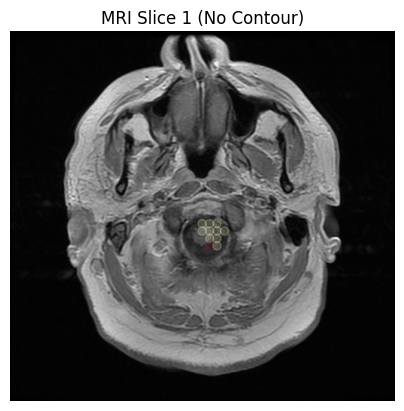

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_001.png
1


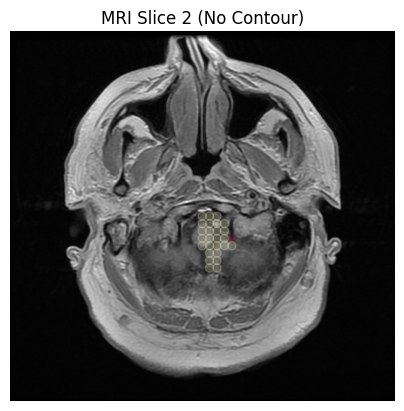

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_002.png
2


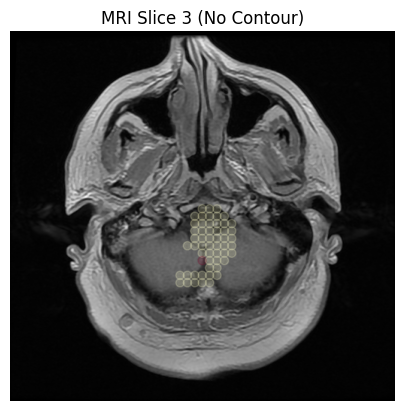

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_003.png
3


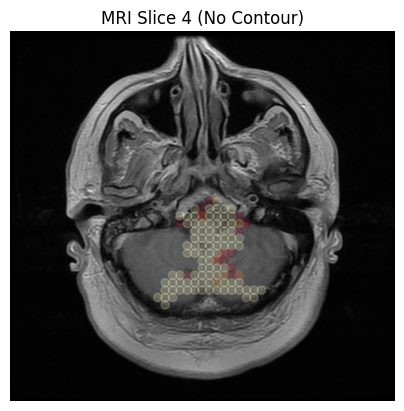

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_004.png
4


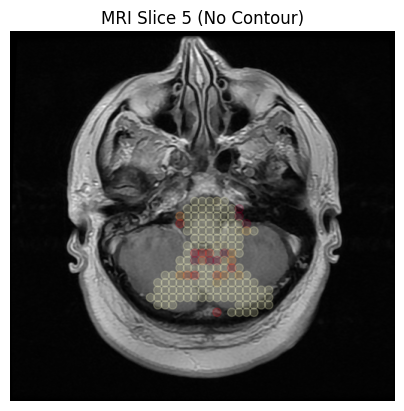

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_005.png
5


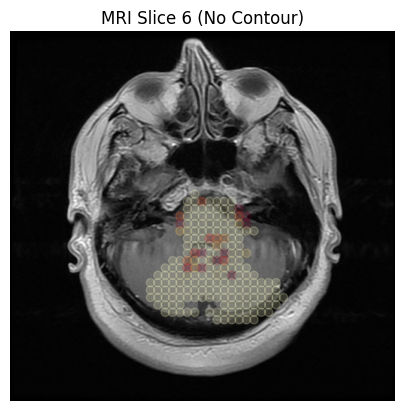

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_006.png
6


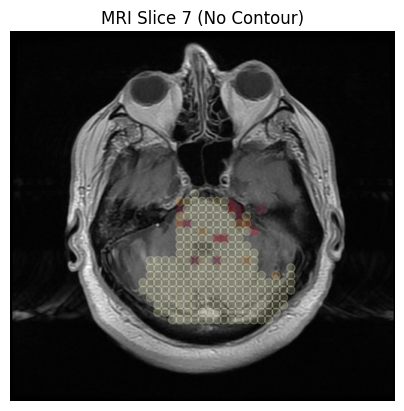

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_007.png
7


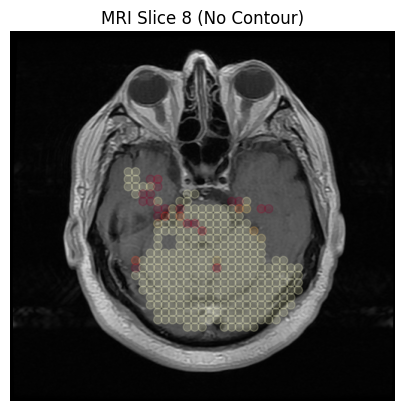

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_008.png
8


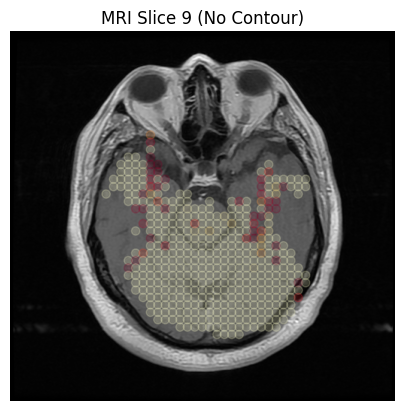

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_009.png
9


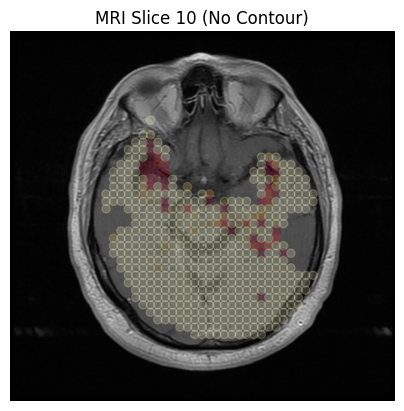

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_010.png
10


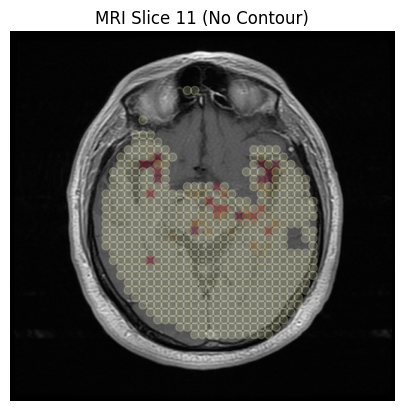

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_011.png
11


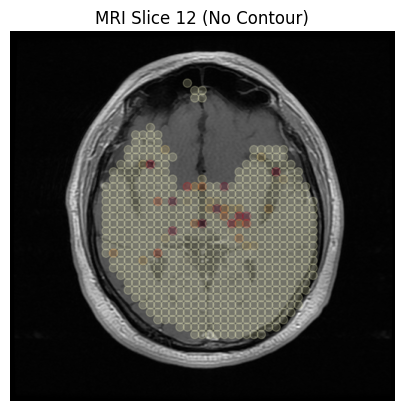

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_012.png
12


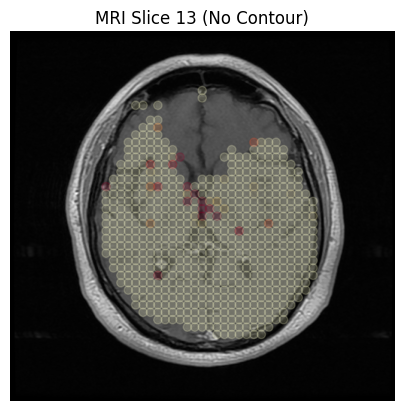

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_013.png
13


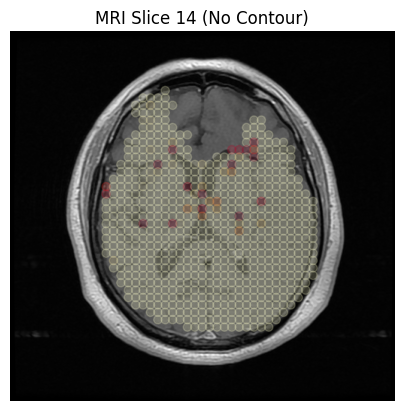

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_014.png
14


<ipython-input-30-a295db257256>:34: RuntimeWarning: invalid value encountered in scalar divide
  t = (z_val - z1) / (z2 - z1)


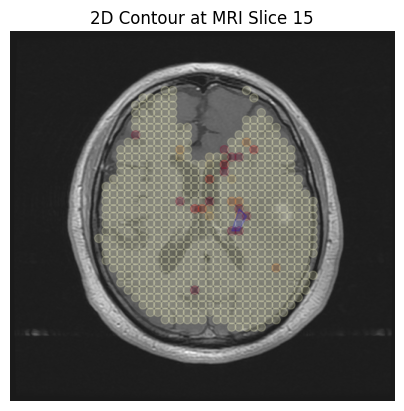

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_015.png
15


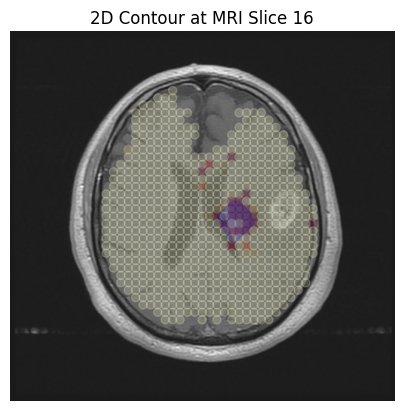

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_016.png
16


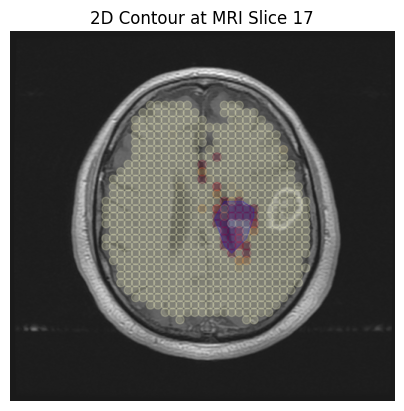

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_017.png
17


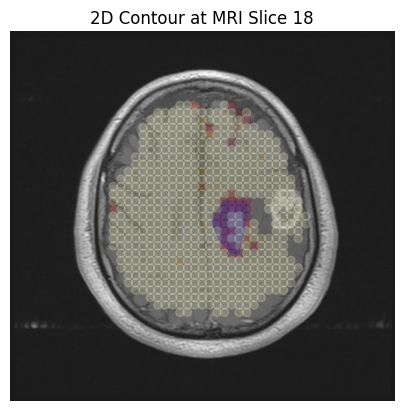

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_018.png
18


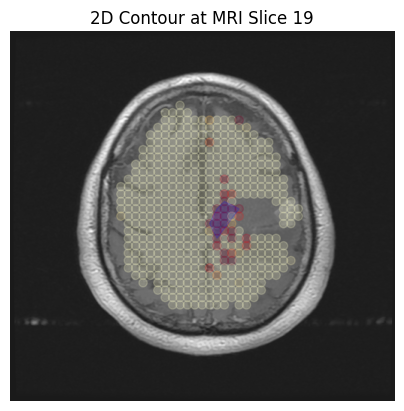

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_019.png
19


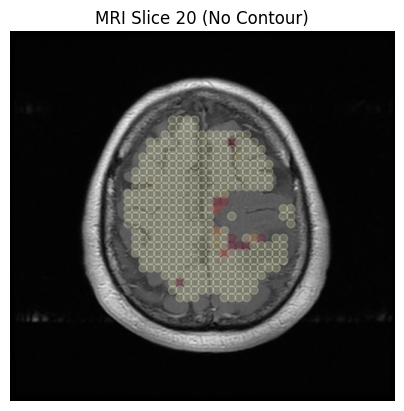

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_020.png
20


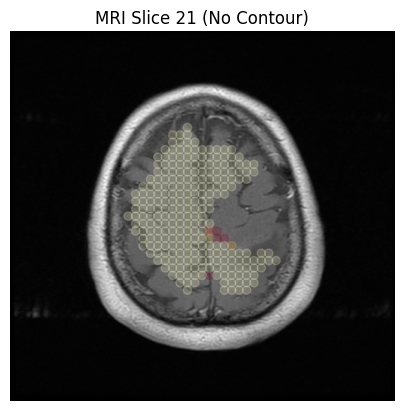

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_021.png
21


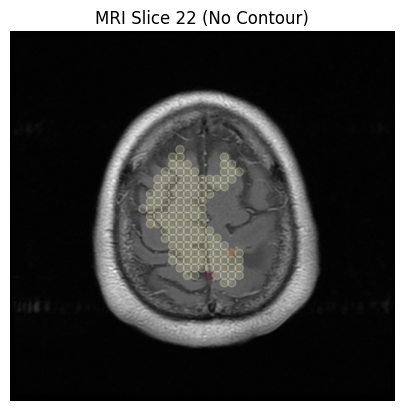

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_022.png
22


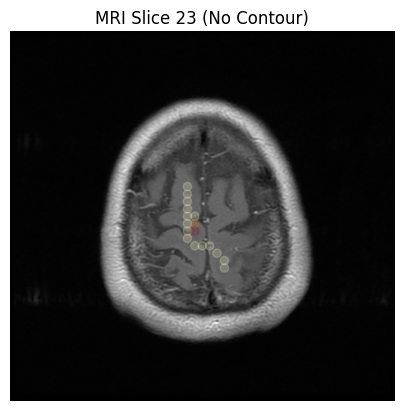

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_023.png
23


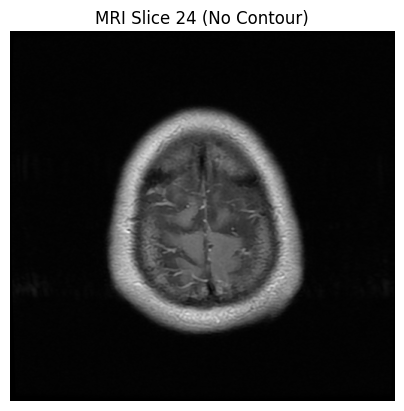

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_024.png
24


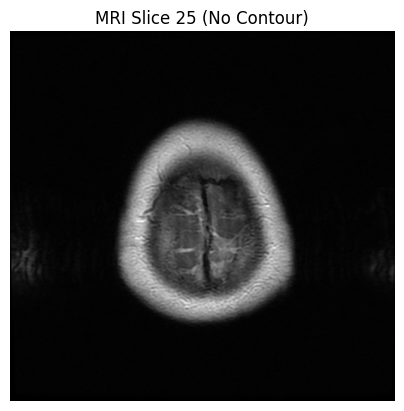

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_025.png
25


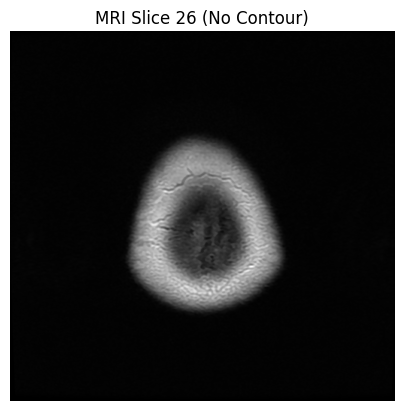

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_026.png
26


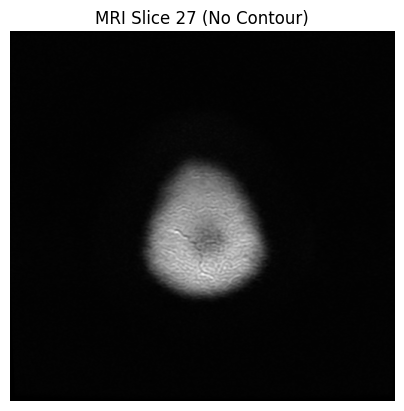

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_027.png
27


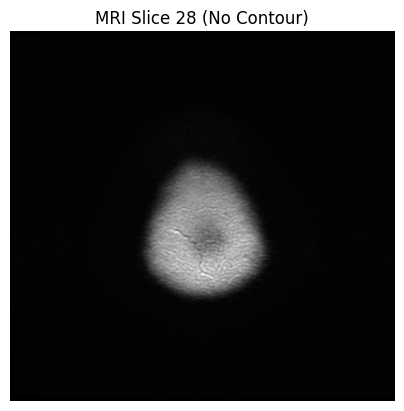

Saved: /content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images/slice_028.png


In [ ]:
import os

# Directory to save the images
output_dir = "/content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images"
os.makedirs(output_dir, exist_ok=True)  # Create the directory if it doesn't exist

# Format the cluster points
cluster_points_np = np.array(cluster_points)
# Create the ConvexHull object
hull = ConvexHull(cluster_points_np)

# Function to plot the 2D contour of the ConvexHull at a specific z slice
def plot_2d_contour_for_z_slice(cluster_points_np, hull, z_val, data, x_min, x_max, y_min, y_max, matched_dicom_slice, mri_num):
    """
    Plot the 2D contour of the ConvexHull at a specific z slice and include the voxel predictions as background.
    Ensures the plot uses the same x and y limits for all slices.
    """
    intersection_points = []  # Collect all intersection points

    # Loop through each triangle (facet) in the hull
    for simplex in hull.simplices:
        points = cluster_points_np[simplex]
        z_coords = points[:, 2]

        # Check if this facet intersects the z slice
        if np.min(z_coords) <= z_val <= np.max(z_coords):
            # Find the intersection points of the facet edges with the z slice
            intersections = []
            for i in range(3):
                p1, p2 = points[i], points[(i + 1) % 3]
                z1, z2 = p1[2], p2[2]
                if (z1 <= z_val <= z2) or (z2 <= z_val <= z1):
                    # Linear interpolation to find intersection
                    t = (z_val - z1) / (z2 - z1)
                    x = p1[0] + t * (p2[0] - p1[0])
                    y = p1[1] + t * (p2[1] - p1[1])
                    intersections.append((x, y))
            if len(intersections) == 2:
                intersection_points.extend(intersections)

    # Extend the x_lim/y_lim to fit the MRI
    x_min_updated = x_min - 8
    x_max_updated = x_max + 8
    #y_min_updated = y_min - 4
    #y_max_updated = y_max + 6

    #y-axis invert
    y_min_updated = y_max+6
    y_max_updated = y_min

    # Check if there are intersection points
    plt.figure()
    if intersection_points:
        # Ensure points are unique
        intersection_points = list(set(intersection_points))
        intersection_points = np.array(intersection_points)

        # Sort the points to create a closed shape (polygon)
        centroid = np.mean(intersection_points, axis=0)
        sorted_points = intersection_points[np.argsort(np.arctan2(intersection_points[:, 1] - centroid[1],
                                                                  intersection_points[:, 0] - centroid[0]))]

        # Plot the MRI slice image
        plt.imshow(matched_dicom_slice.pixel_array, cmap='gray', extent=[x_min_updated, x_max_updated, y_min_updated, y_max_updated], alpha=0.9)

        # Plot the original voxel data points for the current z slice
        plt.scatter(data['data_x'], data['data_y'], c=data['recurrence'], cmap='YlOrRd', alpha=0.2)
        plt.gca().invert_yaxis()

        # Plot the closed shape from the intersection points
        plt.fill(*zip(*sorted_points), color='blue', alpha=0.15)  # Fill the polygon

        # Title and labels
        plt.title(f"2D Contour at MRI Slice {mri_num + 1}")
    else:
        # If no intersection points are found, just print the MRI slice
        plt.imshow(matched_dicom_slice.pixel_array, cmap='gray', extent=[x_min_updated, x_max_updated, y_min_updated, y_max_updated])
        plt.scatter(data['data_x'], data['data_y'], c=data['recurrence'], cmap='YlOrRd', alpha=0.2)
        plt.gca().invert_yaxis()
        plt.title(f"MRI Slice {mri_num + 1} (No Contour)")

    plt.axis('off')
    plt.grid(False)

    # Set consistent limits
    plt.xlim(x_min_updated, x_max_updated)
    plt.ylim(y_min_updated, y_max_updated)

    # Save the figure
    output_path = os.path.join(output_dir, f"slice_{mri_num + 1:03d}.png")
    plt.savefig(output_path, bbox_inches='tight', pad_inches=0)
    plt.show()
    plt.close()  # Close the plot to free memory

    print(f"Saved: {output_path}")

# Plot contours for each unique z slice
for mri_num in range(num_dicom_slices):
    print(mri_num)

    # Match the MRI slice (this is a placeholder; implement your own logic to match slices)
    '''
    Seemed like it was 1 off 10/28/24 14:18,
    I then shifted usign the below logic
    '''
    if mri_num != num_dicom_slices-1:
      matched_dicom_slice = dicom_slices[mri_num+1]

    if mri_num == num_dicom_slices-1:
      matched_dicom_slice = dicom_slices[mri_num]

    # Check if the mri_num corresponds to a valid z_val in your data
    z_val = mri_num + 3  # Adjust based on your mapping
    if z_val in data['data_z'].values:
        # Filter the original data for the current z slice
        data_2d = data[data['data_z'] == z_val]
        # Call the updated plot function with data
        plot_2d_contour_for_z_slice(cluster_points_np, hull, z_val, data_2d, x_min, x_max, y_min, y_max, matched_dicom_slice, mri_num)
    else:
        # Just print the MRI slice if it's not in the range
        data_2d = data[data['data_z'] == z_val]
        plot_2d_contour_for_z_slice(cluster_points_np, hull, z_val, data_2d, x_min, x_max, y_min, y_max, matched_dicom_slice, mri_num)


Create video of the slices

In [ ]:
import os
import imageio

# Directory containing the images
fig_ext = 'alan_cluster'
image_dir = '/content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images'
output_video_path = f'/content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_video_{fig_ext}.mp4'

# Get all image files in the directory and sort them
image_files = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('.png')])

# Create the video
with imageio.get_writer(output_video_path, fps=3) as video_writer:  # fps=1 for 1 second per frame
    for image_file in image_files:
        # Read the image
        image = imageio.imread(image_file)
        # Add the image to the video
        video_writer.append_data(image)
        print(f'Added {image_file} to the video.')

print(f'Video saved to {output_video_path}')


Export as DICOM

In [ ]:
import os
import pydicom
from pydicom.dataset import Dataset, FileDataset
from pydicom.uid import ExplicitVRLittleEndian
import numpy as np
from datetime import datetime
from PIL import Image

# Directory containing image files
image_dir = '/content/drive/Shareddrives/MR_Spectroscopy/Clusters/mri_images'
output_dicom_dir = '/content/drive/Shareddrives/MR_Spectroscopy/Clusters/DICOM_Series'

# Ensure output directory exists
os.makedirs(output_dicom_dir, exist_ok=True)

# Sort and load the images
image_files = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('.png')])

# Base metadata for DICOM files
def create_dicom_metadata():
    ds = Dataset()
    ds.PatientName = "Patient^Name"
    ds.PatientID = "123456"
    ds.StudyInstanceUID = "1.2.3.4.5.6.7.8.9.10"
    ds.SeriesInstanceUID = "1.2.3.4.5.6.7.8.9.10.1"
    ds.SOPClassUID = pydicom.uid.SecondaryCaptureImageStorage
    ds.SOPInstanceUID = pydicom.uid.generate_uid()
    ds.Modality = "MR"
    ds.StudyDate = datetime.now().strftime("%Y%m%d")
    ds.StudyTime = datetime.now().strftime("%H%M%S")
    return ds

# Convert and save each image as a DICOM file
for idx, image_file in enumerate(image_files):
    # Load image and convert to grayscale
    image = Image.open(image_file).convert("L")  # Convert to grayscale
    pixel_array = np.array(image)

    # Create DICOM dataset with metadata
    ds = create_dicom_metadata()
    ds.Rows, ds.Columns = pixel_array.shape
    ds.InstanceNumber = idx + 1  # Each slice gets a unique instance number

    # Add pixel data to the dataset
    ds.PixelData = pixel_array.tobytes()
    ds.SamplesPerPixel = 1
    ds.PhotometricInterpretation = "MONOCHROME2"
    ds.BitsStored = 8
    ds.BitsAllocated = 8
    ds.HighBit = 7
    ds.PixelRepresentation = 0
    ds.ImagePositionPatient = [0, 0, idx * 2.5]  # Example spacing, adjust as needed
    ds.ImageOrientationPatient = [1, 0, 0, 0, 1, 0]

    # Create file meta information
    file_meta = pydicom.dataset.FileMetaDataset()
    file_meta.TransferSyntaxUID = ExplicitVRLittleEndian
    file_meta.MediaStorageSOPClassUID = ds.SOPClassUID
    file_meta.MediaStorageSOPInstanceUID = ds.SOPInstanceUID
    file_meta.ImplementationClassUID = "1.2.3.4"

    # Create the FileDataset with metadata and write as DICOM
    dicom_filename = os.path.join(output_dicom_dir, f"slice_{idx+1:03}.dcm")
    dicom_dataset = FileDataset(dicom_filename, ds, file_meta=file_meta, preamble=b"\0" * 128)
    pydicom.dcmwrite(dicom_filename, dicom_dataset)
    print(f"Saved {dicom_filename}")

print(f"All slices saved as DICOM series in {output_dicom_dir}")


Saved /content/drive/Shareddrives/MR_Spectroscopy/Clusters/DICOM_Series/slice_001.dcm
Saved /content/drive/Shareddrives/MR_Spectroscopy/Clusters/DICOM_Series/slice_002.dcm
Saved /content/drive/Shareddrives/MR_Spectroscopy/Clusters/DICOM_Series/slice_003.dcm
Saved /content/drive/Shareddrives/MR_Spectroscopy/Clusters/DICOM_Series/slice_004.dcm
Saved /content/drive/Shareddrives/MR_Spectroscopy/Clusters/DICOM_Series/slice_005.dcm
Saved /content/drive/Shareddrives/MR_Spectroscopy/Clusters/DICOM_Series/slice_006.dcm
Saved /content/drive/Shareddrives/MR_Spectroscopy/Clusters/DICOM_Series/slice_007.dcm
Saved /content/drive/Shareddrives/MR_Spectroscopy/Clusters/DICOM_Series/slice_008.dcm
Saved /content/drive/Shareddrives/MR_Spectroscopy/Clusters/DICOM_Series/slice_009.dcm
Saved /content/drive/Shareddrives/MR_Spectroscopy/Clusters/DICOM_Series/slice_010.dcm
Saved /content/drive/Shareddrives/MR_Spectroscopy/Clusters/DICOM_Series/slice_011.dcm
Saved /content/drive/Shareddrives/MR_Spectroscopy/Clus

Older versions of the above code

In [ ]:
# def plot_2d_contour_for_z_slice(cluster_points_np, hull, z_val, data, x_min, x_max, y_min, y_max):
#     """
#     Plot the 2D contour of the ConvexHull at a specific z slice and include the voxel predictions as background.
#     Ensures the plot uses the same x and y limits for all slices.
#     """
#     slice_lines = []  # Store intersecting points
#     intersection_points = []  # Collect all intersection points

#     # Loop through each triangle (facet) in the hull
#     for simplex in hull.simplices:
#         points = cluster_points_np[simplex]
#         z_coords = points[:, 2]

#         # Check if this facet intersects the z slice
#         if np.min(z_coords) <= z_val <= np.max(z_coords):
#             # Find the intersection points of the facet edges with the z slice
#             intersections = []
#             for i in range(3):
#                 p1, p2 = points[i], points[(i + 1) % 3]
#                 z1, z2 = p1[2], p2[2]
#                 if (z1 <= z_val <= z2) or (z2 <= z_val <= z1):
#                     # Linear interpolation to find intersection
#                     t = (z_val - z1) / (z2 - z1)
#                     x = p1[0] + t * (p2[0] - p1[0])
#                     y = p1[1] + t * (p2[1] - p1[1])
#                     intersections.append((x, y))
#             if len(intersections) == 2:
#                 intersection_points.extend(intersections)

#     # Create a closed shape if there are intersection points
#     if intersection_points:
#         # Ensure points are unique
#         intersection_points = list(set(intersection_points))
#         intersection_points = np.array(intersection_points)

#         # Sort the points to create a closed shape (polygon)
#         centroid = np.mean(intersection_points, axis=0)
#         sorted_points = intersection_points[np.argsort(np.arctan2(intersection_points[:, 1] - centroid[1],
#                                                                   intersection_points[:, 0] - centroid[0]))]

#         # Plot the original voxel data points for the current z slice
#         plt.figure()
#         plt.scatter(data_2d['data_x'], data_2d['data_y'], c=data_2d['recurrence'], cmap='YlOrRd', alpha=0.7)

#         # Plot the closed shape from the intersection points
#         plt.fill(*zip(*sorted_points), color='blue', alpha=0.2)  # Fill the polygon

#         plt.title(f"2D Contour at Z = {z_val}")
#         plt.xlabel('X Coordinate')
#         plt.ylabel('Y Coordinate')

#         # Set consistent limits
#         plt.xlim(x_min, x_max)
#         plt.ylim(y_min, y_max)

#         plt.grid(True)
#         plt.show()

# # Assuming `cluster_points` is your high_recurrence data points
# # Convert `cluster_points` to a NumPy array and assign to `cluster_points_np`
# cluster_points_np = np.array(cluster_points)

# # Create the ConvexHull object
# hull = ConvexHull(cluster_points_np)

# # Extract unique z values
# unique_z_values = np.unique(cluster_points_np[:, 2])

# # Assuming `data` is your original DataFrame containing the voxel data with 'data_x', 'data_y', 'data_z', and 'recurrence' columns
# # Set consistent x and y limits for the plots
# x_min, x_max = np.min(data['data_x']), np.max(data['data_x'])
# y_min, y_max = np.min(data['data_y']), np.max(data['data_y'])


# unique_z_values_wholebrain = data['data_z'].unique()

# # Plot contours for each unique z slice
# for z_val in data['data_z'].unique(): #unique_z_values:
#     # Filter the original data for the current z slice
#     data_2d = data[data['data_z'] == z_val]
#     plot_2d_contour_for_z_slice(cluster_points_np, hull, z_val, data, x_min, x_max, y_min, y_max)

In [ ]:
# with pd.ExcelWriter('/content/drive/Shareddrives/MR_Spectroscopy/cohort_wbf_binaryPred_clustersheet.xlsx') as writer :
#   #healthy_cohort.to_excel(writer, sheet_name = 'Healthy')
#   wbf_03.to_excel(writer, sheet_name = 'WBF 03')

### Extra

Writing to an excel sheet

change the file name accordingly

In [ ]:
wb88

#pick slice to visualize
slice = 18
predictions_88_filtered = wb88_xyz.loc[wb88_xyz['data_z'] == slice]
predictions_88_xy = predictions_88_filtered.loc[:, predictions_88_filtered.columns.isin(['data_x', 'data_y', 'Predictions'])]


predictions_88_table = predictions_88_xy.pivot('data_y', 'data_x', 'Predictions')

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

ax = sns.heatmap(predictions_88_table, cmap = 'viridis')

wb88_x = wb88_xyz.data_x.to_numpy()
wb88_y = wb88_xyz.data_y.to_numpy()
wb88_z = wb88_xyz.data_z.to_numpy()
wb88_pred = wb88_xyz.Predictions.to_numpy()

#hm = plt.axes(projection='3d')
#hm_nawm_sns = hm.scatter3D(wb88_x, wb88_y, wb88_z, c=wb88_pred)

NameError: ignored

Whole Brain Predictions

In [ ]:
wb_full = pd.read_csv("/content/drive/Shareddrives/MR_Spectroscopy/big_data_sheets/wbf_bigsheets.csv")
wb53 = wb_full.loc[wb_full.id == 'BL_053']
wb88 = wb_full.loc[wb_full.id == 'BL_088']
wb53.to_csv('/content/drive/Shareddrives/MR_Spectroscopy/061223_wb53.csv')
#features_col = ['Glx._Sm', 'myo-Inositol_Sm', 'relNAA/CR', 'relCHO/NAA', 'relCR/CHO']
wb53_features = wb53.loc[:, wb53.columns.isin(['Glx._Sm', 'myo-Inositol_Sm', 'relNAA/CR', 'relCHO/NAA', 'relCHO/CR'])]
wb53_features.to_csv('/content/drive/Shareddrives/MR_Spectroscopy/061223_wb53_features.csv')

In [ ]:
gbc_predictions_53_pre = gbc.predict_proba(wb53_features)
gbc_predictions_53_pre = pd.DataFrame(gbc_predictions_53_pre)
gbc_predictions_53 = gbc_predictions_53_pre[gbc_predictions_53_pre.columns[1]]

In [ ]:
#rf_predictions_53_pre = rf_model.predict_proba(wb53_features)
#rf_predictions_53_pre = pd.DataFrame(rf_predictions_53_pre)
#rf_predictions_53 = rf_predictions_53_pre[rf_predictions_53_pre.columns[1]]

In [ ]:
wb53_xyz = wb53.loc[:, wb53.columns.isin(['data_xyz', 'data_x', 'data_y', 'data_z'])]
wb53_export = pd.concat([wb53_xyz, wb53_features], axis = 1)
wb53_export.to_csv('/content/drive/Shareddrives/MR_Spectroscopy/061223_wb53_predictions.csv')

#wb88_xyz.reset_index(drop=True)
#rf_predictions_88.reset_index(drop=True)
gbc_predictions_53 = gbc_predictions_53.to_frame()

gbc_predictions_53 = gbc_predictions_53.set_index(wb53_xyz.index)

wb53_xyz['Predictions'] = gbc_predictions_53
#wb88_map = pd.concat([wb88_xyz, rf_predictions_88], axis=1)
#wb88_xyz


<ipython-input-13-f5caa6604442>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wb53_xyz['Predictions'] = gbc_predictions_53


In [ ]:
wb53_xyz

In [ ]:
with pd.ExcelWriter('/content/drive/Shareddrives/MR_Spectroscopy/061223_BL_053_predictions.xlsx') as writer:
  wb53_xyz.to_excel(writer)


In [ ]:
with pd.ExcelWriter('/content/drive/Shareddrives/MR_Spectroscopy/heatmap/Jay_updated.xlsx') as writer:
  jay.to_excel(writer)


### p-values using DeLong's method

In [ ]:
y_naive = y_naive_proba[:,1]
y_log = y_log_proba
y_knn = y_knn_proba[:,1]
y_dtree = y_dtree_proba[:,1]
y_rf = y_rf_proba[:,1]
y_gbc = y_gbc_proba[:,1]

#y_gbc = pd.DataFrame(y_gbc)
#y_gbc = y_gbc.to_numpy()

y_delong = y_tres[0].to_numpy()

In [ ]:
z_val = delong_roc_test(y_delong,y_knn,y_rf)
p_val = scipy.stats.norm.sf(abs(z_val))
p_val

array([[1.56090885e-52]])